In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import numpy as np
from scipy import stats
from utils import (
    get_chord_diagram,
    get_normalized_norm,
    get_actual_survey_data_info,
    get_generated_survey_data_info,
    get_transient_prob_1,
    get_transient_prob_2,
    # get_transient_prob_3,
    # get_transient_prob_4,
    # get_transient_prob_5,
    plot_table_inter_city_norm_2,
    create_plots_for_destination_prob,
    plotting_the_dendogram,
    plotting_the_dendogram_JS

)
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import r2_score
from scipy.spatial import distance
from scipy.stats import ttest_ind, levene
from sklearn.cluster import KMeans, AgglomerativeClustering
%load_ext autoreload
%autoreload 2

In [2]:
def get_datadf_from_transient_probs(order=1, model='gemini'):
    data = {
        'SF_Original': [
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'SF_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_sf_{model}')
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dc'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dc'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
        ],
        'LA_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
        ],
        'LA_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            '',
            '',
            '',
        ],
        'Minneapolis_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            0,
            '',
        ],
        'Minneapolis_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_minneapolis'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            '',
        ]
    }
    cell_colours = [
        ['white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white'],  # noqa: E501
    ]

    datadf = pd.DataFrame(data, index=data.keys())

    SOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightcoral')))]  # noqa: E501
    DOO = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightgreen')))]  # noqa: E501
    DOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'cyan')))]  # noqa: E501
    DGG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'orange')))]  # noqa: E501

    datadf
    return SOG, DOO, DOG, DGG, datadf


def get_datadf_from_transient_probs_JS(order=1, model='gemini'):
    data = {
        'SF_Original': [
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'SF_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_sf_{model}')
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dc'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dc'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
        ],
        'LA_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
        ],
        'LA_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            '',
            '',
            '',
        ],
        'Minneapolis_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            0,
            '',
        ],
        'Minneapolis_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_minneapolis'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            '',
        ]
    }
    cell_colours = [
        ['white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white'],  # noqa: E501
    ]

    datadf = pd.DataFrame(data, index=data.keys())

    SOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightcoral')))]  # noqa: E501
    DOO = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightgreen')))]  # noqa: E501
    DOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'cyan')))]  # noqa: E501
    DGG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'orange')))]  # noqa: E501

    datadf
    return SOG, DOO, DOG, DGG, datadf


def get_transient_destination_probabilities(order=1, model='gemini'):
    m_cities = {
        'SF_orig': eval(f't_orig_prob_{order}_sf'),
        'DC_orig': eval(f't_orig_prob_{order}_dc'),
        'DFW_orig': eval(f't_orig_prob_{order}_dfw'),
        'LA_orig': eval(f't_orig_prob_{order}_la'),
        'Minneapolis_orig': eval(f't_orig_prob_{order}_minneapolis'),
        'SF': eval(f't_prob_{order}_sf_{model}'),
        'DC': eval(f't_prob_{order}_dc_{model}'),
        'DFW': eval(f't_prob_{order}_dfw_{model}'),
        'LA': eval(f't_prob_{order}_la_{model}'),
        'Minneapolis': eval(f't_prob_{order}_minneapolis_{model}')
    }

    res = {}
    for name, m in m_cities.items():
        vals = m.sum(0).to_dict()
        res[name] = vals
    res = pd.DataFrame(res)
    cols = [
        "Home",
        "Work",
        "Community",
        "In Transit",
        "Education",
        "Care",
        "Shopping",
        "Eat Meal",
        "Recreational",
        "Social",
        "Other",
    ]
    res.index = cols
    res = res / res.sum()
    return res

In [3]:
# data_t_all, ranks_original_all, relative_freqs_original_all = get_actual_survey_data_info(
#     'dataset/NHTS_2017_csv/processed_data/all',
#     'Actual All',
#     new_loc_type=True
# )

data_t_sf, ranks_original_sf, relative_freqs_original_sf = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/sf',
    'Actual SF',
    new_loc_type=True
)

data_t_dc, ranks_original_dc, relative_freqs_original_dc = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/dc',
    'Actual dc',
    new_loc_type=True
)

data_t_dfw, ranks_original_dfw, relative_freqs_original_dfw = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/dfw',
    'Actual dfw',
    new_loc_type=True
)

data_t_la, ranks_original_la, relative_freqs_original_la = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/la',
    'Actual la',
    new_loc_type=True
)

data_t_minneapolis, ranks_original_minneapolis, relative_freqs_original_minneapolis = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/minneapolis',
    'Actual minneapolis',
    new_loc_type=True
)

Actual SF
**************************************************
Average Location: 5.351378197169108
Average Location: 5.0
Number of samples: 4027
Travel time (Hrs): 1.7411927820544657
**************************************************
Actual dc
**************************************************
Average Location: 5.157748436414177
Average Location: 5.0
Number of samples: 1439
Travel time (Hrs): 1.7513782719481121
**************************************************
Actual dfw
**************************************************
Average Location: 5.140451899605683
Average Location: 5.0
Number of samples: 15977
Travel time (Hrs): 1.522760843712837
**************************************************
Actual la
**************************************************
Average Location: 5.1154680159016985
Average Location: 5.0
Number of samples: 5534
Travel time (Hrs): 1.637094928321889
**************************************************
Actual minneapolis
**************************************************
A

In [4]:
t_sf_gemini, ranks_sf_gemini, relative_freqs_sf_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gemini.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


t_dc_gemini, ranks_dc_gemini, relative_freqs_dc_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_gemini.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=False
)

t_dfw_gemini, ranks_dfw_gemini, relative_freqs_dfw_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_gemini.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=False
)

t_la_gemini, ranks_la_gemini, relative_freqs_la_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_gemini.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=False

)

t_minneapolis_gemini, ranks_minneapolis_gemini, relative_freqs_minneapolis_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_gemini.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=False

)
# t_all = pd.concat([t_sf, t_houston, t_pittsburgh, t_ok])
# values_count = t_all['loc_type2'].value_counts()
# relative_frequencies = values_count/t_all.shape[0]
# rank_relative_freq_list = list(enumerate(relative_frequencies.items(), 1))
# ranks_all, relative_freqs_all = zip(
#     *[
#         (rank, relative_freq)
#         for rank, (category, relative_freq) in rank_relative_freq_list
#     ]
# )

# print('Generated All')
# print('*'*50)
# print(f"Average Location: {t_all.loc_type2.apply(lambda x: len(x)).mean()}")
# print(f"Median Location: {t_all.loc_type2.apply(lambda x: len(x)).median()}")
# print(f'Number of samples: {t_all.shape[0]}')
# print(f'Travel time: {t_all.travel_time.mean()/(60*60)}')
# print('*'*50)

Generated SF
**************************************************
Average Location: 6.599516518936341
Median Location: 6.0
Number of samples: 1241
Travel time: 2.5287474747474747
**************************************************
Generated dc
**************************************************
Average Location: 6.4527802294792584
Median Location: 6.0
Number of samples: 1133
Travel time: 2.8258355916892506
**************************************************
Generated dfw
**************************************************
Average Location: 6.314845024469821
Median Location: 6.0
Number of samples: 1226
Travel time: 2.310245571658615
**************************************************
Generated la
**************************************************
Average Location: 6.568129330254042
Median Location: 6.0
Number of samples: 1299
Travel time: 2.266047162270184
**************************************************
Generated minneapolis
**************************************************
Average Locatio

In [5]:
t_sf_llama, ranks_sf_llama, relative_freqs_sf_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=True
)


t_dc_llama, ranks_dc_llama, relative_freqs_dc_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_llama.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=True
)

t_dfw_llama, ranks_dfw_llama, relative_freqs_dfw_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_llama.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=True
)

t_la_llama, ranks_la_llama, relative_freqs_la_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_llama.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=True

)

t_minneapolis_llama, ranks_minneapolis_llama, relative_freqs_minneapolis_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_llama.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=True

)

Generated SF
**************************************************
Average Location: 5.559812353401095
Median Location: 5.0
Number of samples: 1279
Travel time: 7.179538180155465
**************************************************
Generated dc
**************************************************
Average Location: 5.375
Median Location: 5.0
Number of samples: 1240
Travel time: 6.4300181653042685
**************************************************
Generated dfw
**************************************************
Average Location: 5.429661016949153
Median Location: 5.0
Number of samples: 1180
Travel time: 5.7561991869918705
**************************************************
Generated la
**************************************************
Average Location: 5.635918367346939
Median Location: 5.0
Number of samples: 1225
Travel time: 6.228321513002364
**************************************************
Generated minneapolis
**************************************************
Average Location: 5.73073666

In [6]:
t_sf_gpt4, ranks_sf_gpt4, relative_freqs_sf_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gpt4.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


t_dc_gpt4, ranks_dc_gpt4, relative_freqs_dc_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_gpt4.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=False
)

t_dfw_gpt4, ranks_dfw_gpt4, relative_freqs_dfw_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_gpt4.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=False
)

t_la_gpt4, ranks_la_gpt4, relative_freqs_la_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_gpt4.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=False

)

t_minneapolis_gpt4, ranks_minneapolis_gpt4, relative_freqs_minneapolis_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_gpt4.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=False

)

Generated SF
**************************************************
Average Location: 6.963662790697675
Median Location: 7.0
Number of samples: 688
Travel time: 2.522167487684729
**************************************************
Generated dc
**************************************************
Average Location: 6.909647779479326
Median Location: 7.0
Number of samples: 653
Travel time: 2.577797202797203
**************************************************
Generated dfw
**************************************************
Average Location: 6.9072327044025155
Median Location: 7.0
Number of samples: 636
Travel time: 2.583784596871239
**************************************************
Generated la
**************************************************
Average Location: 6.8843338213762815
Median Location: 7.0
Number of samples: 683
Travel time: 2.5306433721575154
**************************************************
Generated minneapolis
**************************************************
Average Location: 7

### Creating ensemble model

In [7]:
def create_ens_model(df1, df2, df3, sample_size=500):
    # t = pd.concat([df1.sample(sample_size), df2.sample(sample_size), df3.sample(sample_size)], ignore_index=True) 
    t = pd.concat([df1, df2, df3], ignore_index=True) 
    t.drop(['id'],inplace=True, axis=1)
    print(f"Average Location: {t.loc_type2.apply(lambda x: len(x)).mean()}")
    print(f"Median Location: {t.loc_type2.apply(lambda x: len(x)).median()}")
    print(f'Number of samples: {t.shape[0]}')
    print(f'Travel time: {t.travel_time.mean()/(60*60)}')
    print('*'*50)
    return t

In [8]:
t_sf_ens = create_ens_model(t_sf_gemini, t_sf_llama, t_sf_gpt4)
t_dc_ens = create_ens_model(t_dc_gemini, t_dc_llama, t_dc_gpt4)
t_dfw_ens = create_ens_model(t_dfw_gemini, t_dfw_llama, t_dfw_gpt4)
t_la_ens = create_ens_model(t_la_gemini, t_la_llama, t_la_gpt4)
t_minneapolis_ens = create_ens_model(t_minneapolis_gemini, t_minneapolis_llama, t_minneapolis_gpt4)

Average Location: 6.263092269326683
Median Location: 6.0
Number of samples: 3208
Travel time: 4.094359685621821
**************************************************
Average Location: 6.109715796430932
Median Location: 6.0
Number of samples: 3026
Travel time: 4.05068493150685
**************************************************
Average Location: 6.095332018408942
Median Location: 6.0
Number of samples: 3042
Travel time: 3.4938011122015045
**************************************************
Average Location: 6.279388836919239
Median Location: 6.0
Number of samples: 3207
Travel time: 3.645685358255452
**************************************************
Average Location: 6.230548469387755
Median Location: 6.0
Number of samples: 3136
Travel time: 3.7737683941138838
**************************************************


## Statistical Significance Test

In [9]:
data_t_sf_loc = data_t_sf['location'].to_list()
data_t_dc_loc = data_t_dc['location'].to_list()
data_t_dfw_loc = data_t_dfw['location'].to_list()
data_t_la_loc = data_t_la['location'].to_list()
data_t_minneapolis_loc = data_t_minneapolis['location'].to_list()

t_sf_gemini_loc = t_sf_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dc_gemini_loc = t_dc_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dfw_gemini_loc = t_dfw_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()
t_la_gemini_loc = t_la_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()
t_minneapolis_gemini_loc = t_minneapolis_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_loc = t_sf_llama['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dc_llama_loc = t_dc_llama['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dfw_llama_loc = t_dfw_llama['loc_type_new'].apply(lambda x: len(x)).to_list()
t_la_llama_loc = t_la_llama['loc_type_new'].apply(lambda x: len(x)).to_list()
t_minneapolis_llama_loc = t_minneapolis_llama['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_gpt4_loc = t_sf_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dc_gpt4_loc = t_dc_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dfw_gpt4_loc = t_dfw_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()
t_la_gpt4_loc = t_la_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()
t_minneapolis_gpt4_loc = t_minneapolis_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_ens_loc = t_sf_ens['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dc_ens_loc = t_dc_ens['loc_type_new'].apply(lambda x: len(x)).to_list()
t_dfw_ens_loc = t_dfw_ens['loc_type_new'].apply(lambda x: len(x)).to_list()
t_la_ens_loc = t_la_ens['loc_type_new'].apply(lambda x: len(x)).to_list()
t_minneapolis_ens_loc = t_minneapolis_ens['loc_type_new'].apply(lambda x: len(x)).to_list()

In [10]:
actual_color = 'tab:blue'
gemini_color = 'tab:orange'
llama_color = 'tab:green'
gpt4_color = 'tab:red'
ens_color = 'tab:purple'
one_color_line = 'tab:olive'
ten_color_line = 'tab:cyan'

In [11]:
def loc_significance_test(a,b,c,d,e, name='SF'):

    fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(2,2)

    ax0.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
    ax0.hist(b, bins=10, alpha=0.5, label=f'Gemini {name}', color=gemini_color)
    ax0.legend(loc='best')

    ax1.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
    ax1.hist(c, bins=10, alpha=0.5, label=f'Llama {name}', color=llama_color)
    ax1.legend(loc='best')

    ax2.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
    ax2.hist(d, bins=10, alpha=0.5, label=f'GPT-4 {name}', color=gpt4_color)
    ax2.legend(loc='best')

    ax3.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
    ax3.hist(e, bins=10, alpha=0.5, label=f'Ens {name}', color=ens_color)
    ax3.legend(loc='best')
    plt.suptitle('Distribution of Location Types')
    plt.tight_layout()
    plt.show()

    alpha = 0.05
    stat, p_value = levene(a, b)
    # Print the results
    print(f"Levene's test statistic: {stat:.3f}")
    print(f"p-value: {p_value:.3f}")
    if p_value > alpha:
        print('Equal variances')
    else:
        print('Unequal variances')

    stat, p_value = levene(a, c)
    # Print the results
    print(f"Levene's test statistic: {stat:.3f}")
    print(f"p-value: {p_value:.3f}")
    if p_value > alpha:
        print('Equal variances')
    else:
        print('Unequal variances')

    stat, p_value = levene(a, d)
    # Print the results
    print(f"Levene's test statistic: {stat:.3f}")
    print(f"p-value: {p_value:.3f}")
    if p_value > alpha:
        print('Equal variances')
    else:
        print('Unequal variances')

    stat, p_value = levene(a, e)
    # Print the results
    print(f"Levene's test statistic: {stat:.3f}")
    print(f"p-value: {p_value:.3f}")
    if p_value > alpha:
        print('Equal variances')
    else:
        print('Unequal variances')

    t_stat, p_value = ttest_ind(a, b, equal_var=False)
    # Print the results
    print(f"Welch's t-statistic: {t_stat:.3f}")
    print(f"p-value: {p_value:.3f}")

    if p_value > alpha:
        print('Same distribution')
    else:
        print('Different distribution')

    t_stat, p_value = ttest_ind(a, c, equal_var=False)
    # Print the results
    print(f"Welch's t-statistic: {t_stat:.3f}")
    print(f"p-value: {p_value:.3f}")

    if p_value > alpha:
        print('Same distribution')
    else:
        print('Different distribution')

    t_stat, p_value = ttest_ind(a, d, equal_var=False)
    # Print the results
    print(f"Welch's t-statistic: {t_stat:.3f}")
    print(f"p-value: {p_value:.3f}")

    if p_value > alpha:
        print('Same distribution')
    else:
        print('Different distribution')

    t_stat, p_value = ttest_ind(a, e, equal_var=True)
    # Print the results
    print(f"Welch's t-statistic: {t_stat:.3f}")
    print(f"p-value: {p_value:.3f}")

    if p_value > alpha:
        print('Same distribution')
    else:
        print('Different distribution')

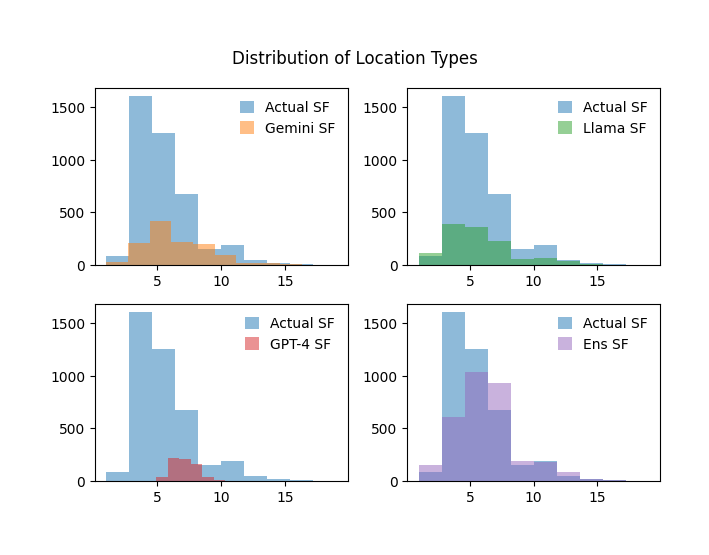

Levene's test statistic: 8.628
p-value: 0.003
Unequal variances
Levene's test statistic: 30.512
p-value: 0.000
Unequal variances
Levene's test statistic: 234.384
p-value: 0.000
Unequal variances
Levene's test statistic: 4.920
p-value: 0.027
Unequal variances
Welch's t-statistic: -14.945
p-value: 0.000
Different distribution
Welch's t-statistic: -2.386
p-value: 0.017
Different distribution
Welch's t-statistic: -28.047
p-value: 0.000
Different distribution
Welch's t-statistic: -15.581
p-value: 0.000
Different distribution


In [12]:
loc_significance_test(data_t_sf_loc, t_sf_gemini_loc, t_sf_llama_loc, t_sf_gpt4_loc, t_sf_ens_loc, 'SF')

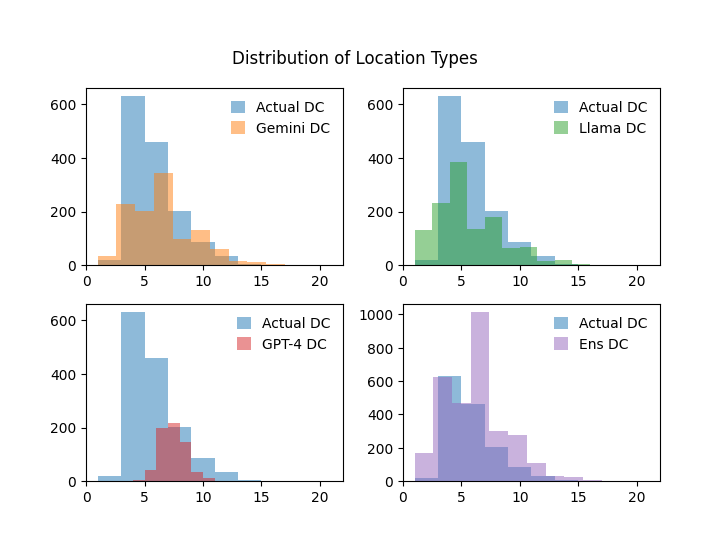

Levene's test statistic: 28.639
p-value: 0.000
Unequal variances
Levene's test statistic: 34.572
p-value: 0.000
Unequal variances
Levene's test statistic: 177.286
p-value: 0.000
Unequal variances
Levene's test statistic: 22.614
p-value: 0.000
Unequal variances
Welch's t-statistic: -13.030
p-value: 0.000
Different distribution
Welch's t-statistic: -2.219
p-value: 0.027
Different distribution
Welch's t-statistic: -23.294
p-value: 0.000
Different distribution
Welch's t-statistic: -12.123
p-value: 0.000
Different distribution


In [13]:
loc_significance_test(data_t_dc_loc, t_dc_gemini_loc, t_dc_llama_loc, t_dc_gpt4_loc, t_dc_ens_loc, 'DC')

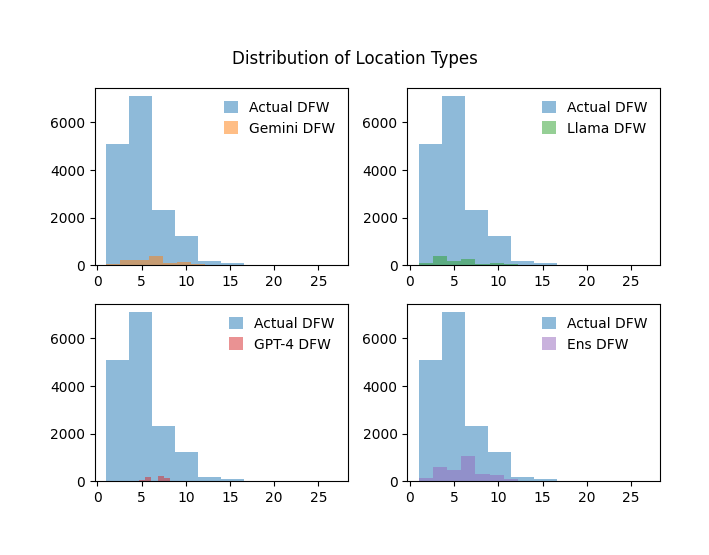

Levene's test statistic: 5.761
p-value: 0.016
Unequal variances
Levene's test statistic: 22.611
p-value: 0.000
Unequal variances
Levene's test statistic: 245.825
p-value: 0.000
Unequal variances
Levene's test statistic: 2.331
p-value: 0.127
Equal variances
Welch's t-statistic: -15.441
p-value: 0.000
Different distribution
Welch's t-statistic: -3.580
p-value: 0.000
Different distribution
Welch's t-statistic: -37.279
p-value: 0.000
Different distribution
Welch's t-statistic: -19.911
p-value: 0.000
Different distribution


In [14]:
loc_significance_test(data_t_dfw_loc, t_dfw_gemini_loc, t_dfw_llama_loc, t_dfw_gpt4_loc, t_dfw_ens_loc, 'DFW')

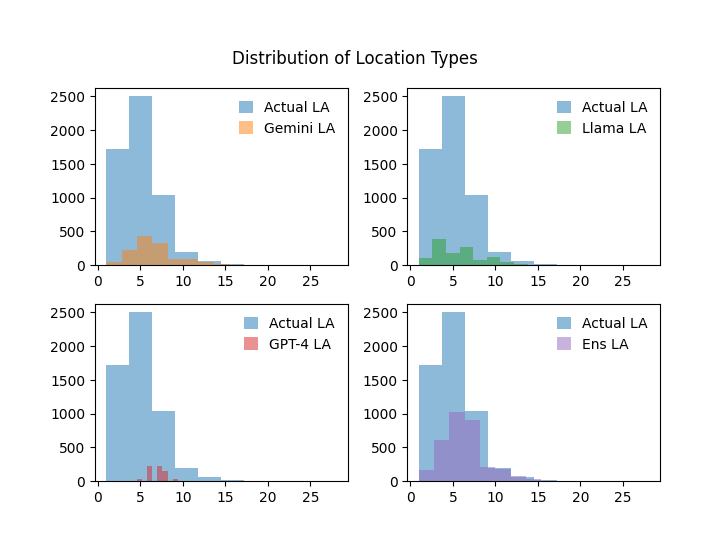

Levene's test statistic: 24.261
p-value: 0.000
Unequal variances
Levene's test statistic: 68.878
p-value: 0.000
Unequal variances
Levene's test statistic: 249.429
p-value: 0.000
Unequal variances
Levene's test statistic: 17.556
p-value: 0.000
Unequal variances
Welch's t-statistic: -18.040
p-value: 0.000
Different distribution
Welch's t-statistic: -5.952
p-value: 0.000
Different distribution
Welch's t-statistic: -34.280
p-value: 0.000
Different distribution
Welch's t-statistic: -21.555
p-value: 0.000
Different distribution


In [15]:
loc_significance_test(data_t_la_loc, t_la_gemini_loc, t_la_llama_loc, t_la_gpt4_loc, t_la_ens_loc, 'LA')

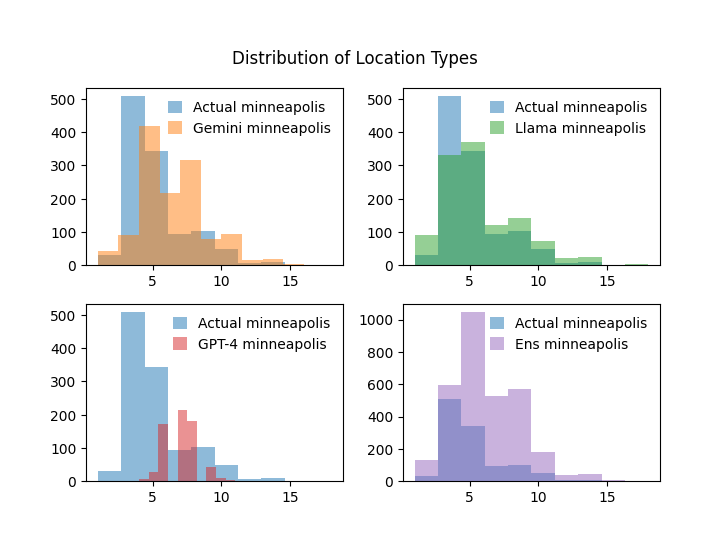

Levene's test statistic: 0.000
p-value: 0.994
Equal variances
Levene's test statistic: 12.599
p-value: 0.000
Unequal variances
Levene's test statistic: 222.032
p-value: 0.000
Unequal variances
Levene's test statistic: 0.071
p-value: 0.790
Equal variances
Welch's t-statistic: -11.604
p-value: 0.000
Different distribution
Welch's t-statistic: -5.807
p-value: 0.000
Different distribution
Welch's t-statistic: -23.729
p-value: 0.000
Different distribution
Welch's t-statistic: -13.514
p-value: 0.000
Different distribution


In [16]:
loc_significance_test(data_t_minneapolis_loc, t_minneapolis_gemini_loc, t_minneapolis_llama_loc, t_minneapolis_gpt4_loc, t_minneapolis_ens_loc, 'minneapolis')

In [17]:
data_t_sf_tt = data_t_sf['travel_time'].to_list()
data_t_sf_tt = [x for x in data_t_sf_tt if str(x) != 'nan']
data_t_dc_tt = data_t_dc['travel_time'].to_list()
data_t_dc_tt = [x for x in data_t_dc_tt if str(x) != 'nan']
data_t_dfw_tt = data_t_dfw['travel_time'].to_list()
data_t_dfw_tt = [x for x in data_t_dfw_tt if str(x) != 'nan']
data_t_la_tt = data_t_la['travel_time'].to_list()
data_t_la_tt = [x for x in data_t_la_tt if str(x) != 'nan']
data_t_minneapolis_tt = data_t_minneapolis['travel_time'].to_list()
data_t_minneapolis_tt = [x for x in data_t_minneapolis_tt if str(x) != 'nan']

In [18]:
t_sf_gemini_tt = t_sf_gemini['travel_time'].to_list()
t_sf_gemini_tt = [x for x in t_sf_gemini_tt if str(x) != 'nan']
t_dc_gemini_tt = t_dc_gemini['travel_time'].to_list()
t_dc_gemini_tt = [x for x in t_dc_gemini_tt if str(x) != 'nan']
t_dfw_gemini_tt = t_dfw_gemini['travel_time'].to_list()
t_dfw_gemini_tt = [x for x in t_dfw_gemini_tt if str(x) != 'nan']
t_la_gemini_tt = t_la_gemini['travel_time'].to_list()
t_la_gemini_tt = [x for x in t_la_gemini_tt if str(x) != 'nan']
t_minneapolis_gemini_tt = t_minneapolis_gemini['travel_time'].to_list()
t_minneapolis_gemini_tt = [x for x in t_minneapolis_gemini_tt if str(x) != 'nan']

In [19]:
t_sf_llama_tt = t_sf_llama['travel_time'].to_list()
t_sf_llama_tt = [x for x in t_sf_llama_tt if str(x) != 'nan']
t_dc_llama_tt = t_dc_llama['travel_time'].to_list()
t_dc_llama_tt = [x for x in t_dc_llama_tt if str(x) != 'nan']
t_dfw_llama_tt = t_dfw_llama['travel_time'].to_list()
t_dfw_llama_tt = [x for x in t_dfw_llama_tt if str(x) != 'nan']
t_la_llama_tt = t_la_llama['travel_time'].to_list()
t_la_llama_tt = [x for x in t_la_llama_tt if str(x) != 'nan']
t_minneapolis_llama_tt = t_minneapolis_llama['travel_time'].to_list()
t_minneapolis_llama_tt = [x for x in t_minneapolis_llama_tt if str(x) != 'nan']

In [20]:
t_sf_gpt4_tt = t_sf_gpt4['travel_time'].to_list()
t_sf_gpt4_tt = [x for x in t_sf_gpt4_tt if str(x) != 'nan']
t_dc_gpt4_tt = t_dc_gpt4['travel_time'].to_list()
t_dc_gpt4_tt = [x for x in t_dc_gpt4_tt if str(x) != 'nan']
t_dfw_gpt4_tt = t_dfw_gpt4['travel_time'].to_list()
t_dfw_gpt4_tt = [x for x in t_dfw_gpt4_tt if str(x) != 'nan']
t_la_gpt4_tt = t_la_gpt4['travel_time'].to_list()
t_la_gpt4_tt = [x for x in t_la_gpt4_tt if str(x) != 'nan']
t_minneapolis_gpt4_tt = t_minneapolis_gpt4['travel_time'].to_list()
t_minneapolis_gpt4_tt = [x for x in t_minneapolis_gpt4_tt if str(x) != 'nan']

In [21]:
t_sf_ens_tt = t_sf_ens['travel_time'].to_list()
t_sf_ens_tt = [x for x in t_sf_ens_tt if str(x) != 'nan']
t_dc_ens_tt = t_dc_ens['travel_time'].to_list()
t_dc_ens_tt = [x for x in t_dc_ens_tt if str(x) != 'nan']
t_dfw_ens_tt = t_dfw_ens['travel_time'].to_list()
t_dfw_ens_tt = [x for x in t_dfw_ens_tt if str(x) != 'nan']
t_la_ens_tt = t_la_ens['travel_time'].to_list()
t_la_ens_tt = [x for x in t_la_ens_tt if str(x) != 'nan']
t_minneapolis_ens_tt = t_minneapolis_ens['travel_time'].to_list()
t_minneapolis_ens_tt = [x for x in t_minneapolis_ens_tt if str(x) != 'nan']

In [22]:
# print(len(data_t_all_tt))
# print(len(data_t_sf_tt))
# print(len(data_t_houston_tt))
# print(len(data_t_pittsburgh_tt))
# print(len(data_t_ok_tt))

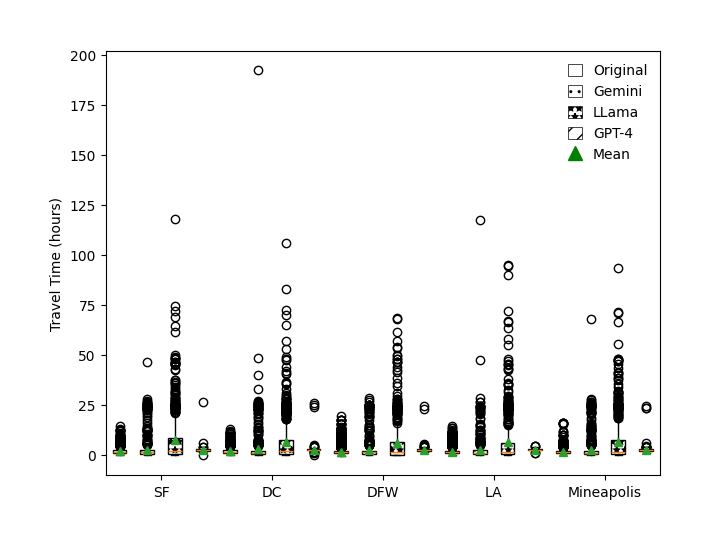

In [23]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in data_t_dc_tt],
        [x / (60*60) for x in t_dc_gemini_tt],
        [x / (60*60) for x in t_dc_llama_tt],
        [x / (60*60) for x in t_dc_gpt4_tt],
        [x / (60*60) for x in data_t_dfw_tt],
        [x / (60*60) for x in t_dfw_gemini_tt],
        [x / (60*60) for x in t_dfw_llama_tt],
        [x / (60*60) for x in t_dfw_gpt4_tt],
        [x / (60*60) for x in data_t_la_tt],
        [x / (60*60) for x in t_la_gemini_tt],
        [x / (60*60) for x in t_la_llama_tt],
        [x / (60*60) for x in t_la_gpt4_tt],
        [x / (60*60) for x in data_t_minneapolis_tt],
        [x / (60*60) for x in t_minneapolis_gemini_tt],
        [x / (60*60) for x in t_minneapolis_llama_tt],
        [x / (60*60) for x in t_minneapolis_gpt4_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=True,
)

hatch_pattern_second = '..'
hatch_pattern_third = '**'
hatch_pattern_fourth = '//'

for i, box in enumerate(bp['boxes']):
    # Change outline color
    box.set(color='black', linewidth=1)
    # Change fill color
    box.set(facecolor='white')

    if i>0 and (i+1) % 4 != 1:
        if (i + 1) % 4 == 2:
            box.set(hatch=hatch_pattern_second)
        elif (i + 1) % 4 == 3:
            box.set(hatch=hatch_pattern_third)
        elif (i + 1) % 4 == 0:
            box.set(hatch=hatch_pattern_fourth)

plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        2.5,
        6.5,
        10.5,
        14.5,
        18.5,
    ],
    [
        'SF',
        'DC',
        'DFW',
        'LA',
        'Mineapolis',
    ]
)

white_patch = mpatches.Patch(edgecolor='black',facecolor='white', linewidth=0.5, label='Original')
white_dot_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_second, linewidth=0.5, label='Gemini')
white_star_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_third, linewidth=0.5, label='LLama')
white_slash_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_fourth, linewidth=0.5, label='GPT-4')
green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[white_patch, white_dot_patch, white_star_patch, white_slash_patch, green_triangle], loc='best')

plt.tight_layout()
plt.show()

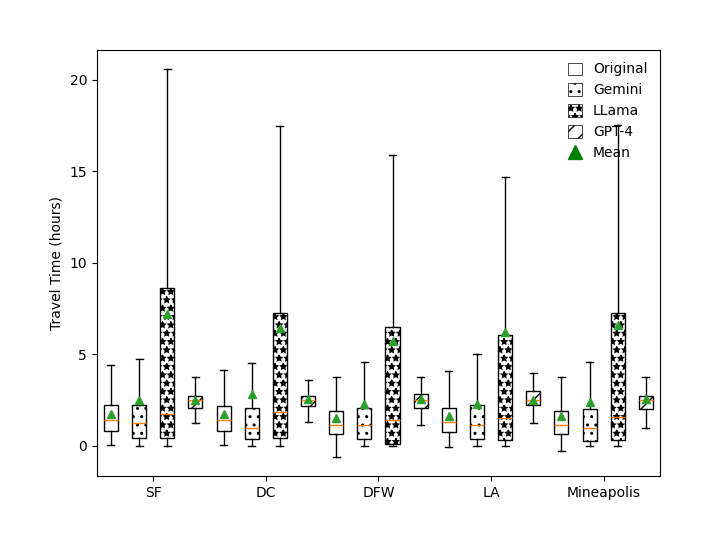

In [24]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in data_t_dc_tt],
        [x / (60*60) for x in t_dc_gemini_tt],
        [x / (60*60) for x in t_dc_llama_tt],
        [x / (60*60) for x in t_dc_gpt4_tt],
        [x / (60*60) for x in data_t_dfw_tt],
        [x / (60*60) for x in t_dfw_gemini_tt],
        [x / (60*60) for x in t_dfw_llama_tt],
        [x / (60*60) for x in t_dfw_gpt4_tt],
        [x / (60*60) for x in data_t_la_tt],
        [x / (60*60) for x in t_la_gemini_tt],
        [x / (60*60) for x in t_la_llama_tt],
        [x / (60*60) for x in t_la_gpt4_tt],
        [x / (60*60) for x in data_t_minneapolis_tt],
        [x / (60*60) for x in t_minneapolis_gemini_tt],
        [x / (60*60) for x in t_minneapolis_llama_tt],
        [x / (60*60) for x in t_minneapolis_gpt4_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=False,
)

hatch_pattern_second = '..'
hatch_pattern_third = '**'
hatch_pattern_fourth = '//'

for i, box in enumerate(bp['boxes']):
    # Change outline color
    box.set(color='black', linewidth=1)
    # Change fill color
    box.set(facecolor='white')

    if i>0 and (i+1) % 4 != 1:
        if (i + 1) % 4 == 2:
            box.set(hatch=hatch_pattern_second)
        elif (i + 1) % 4 == 3:
            box.set(hatch=hatch_pattern_third)
        elif (i + 1) % 4 == 0:
            box.set(hatch=hatch_pattern_fourth)

plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        2.5,
        6.5,
        10.5,
        14.5,
        18.5,
    ],
    [
        'SF',
        'DC',
        'DFW',
        'LA',
        'Mineapolis',
    ]
)

white_patch = mpatches.Patch(edgecolor='black',facecolor='white', linewidth=0.5, label='Original')
white_dot_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_second, linewidth=0.5, label='Gemini')
white_star_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_third, linewidth=0.5, label='LLama')
white_slash_patch = mpatches.Patch(edgecolor='black',facecolor='white',hatch=hatch_pattern_fourth, linewidth=0.5, label='GPT-4')
green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[white_patch, white_dot_patch, white_star_patch, white_slash_patch, green_triangle], loc='upper right')

plt.tight_layout()
plt.show()

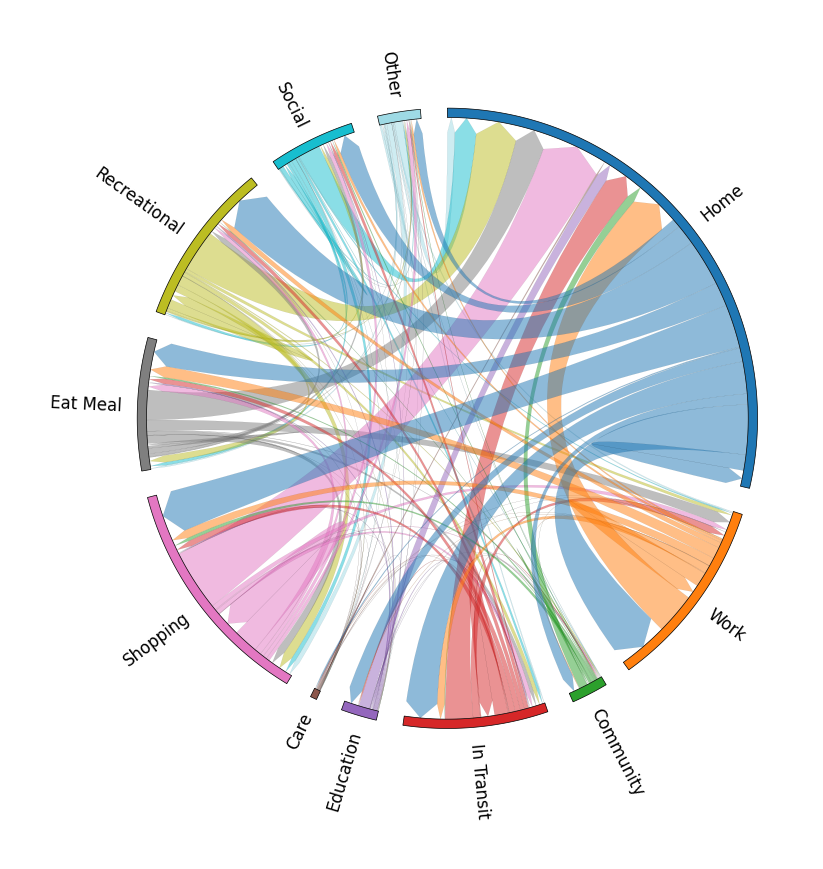

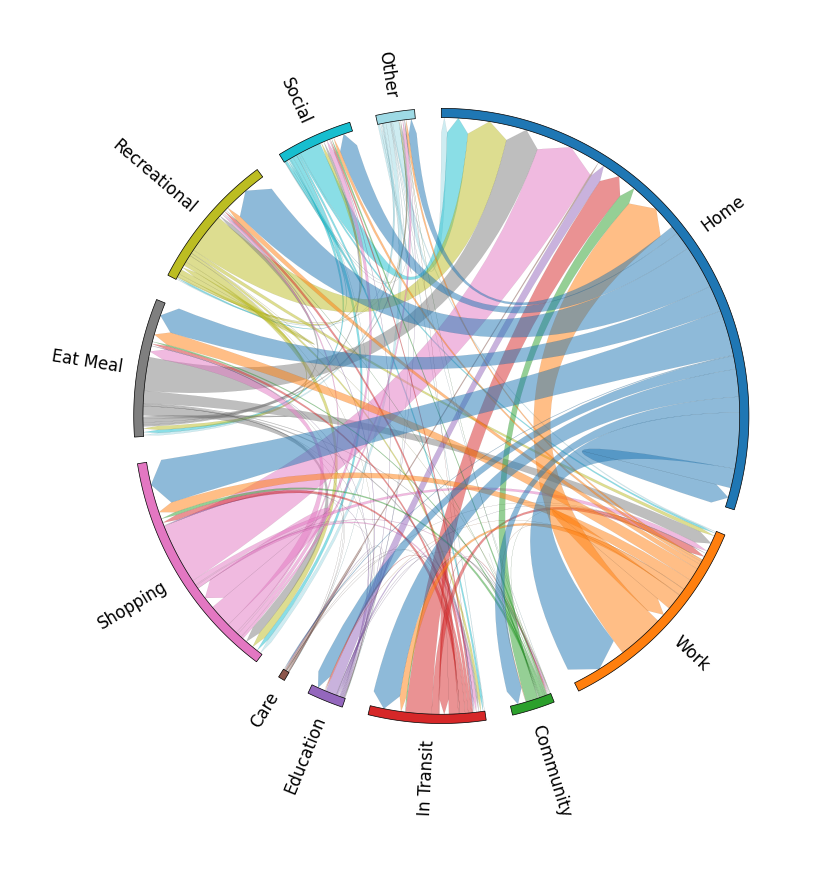

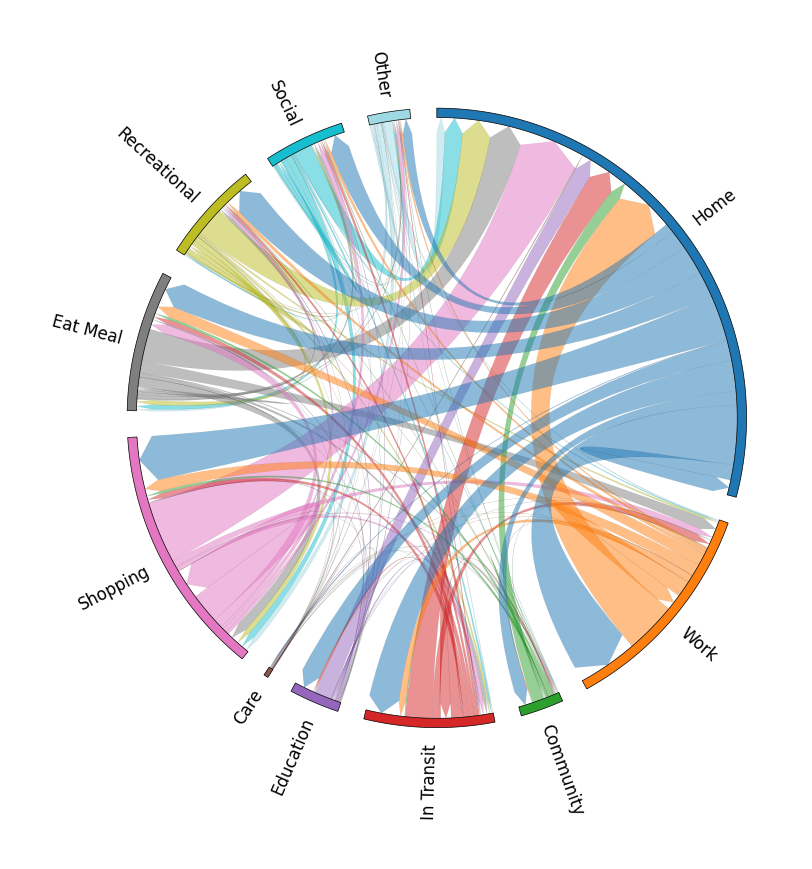

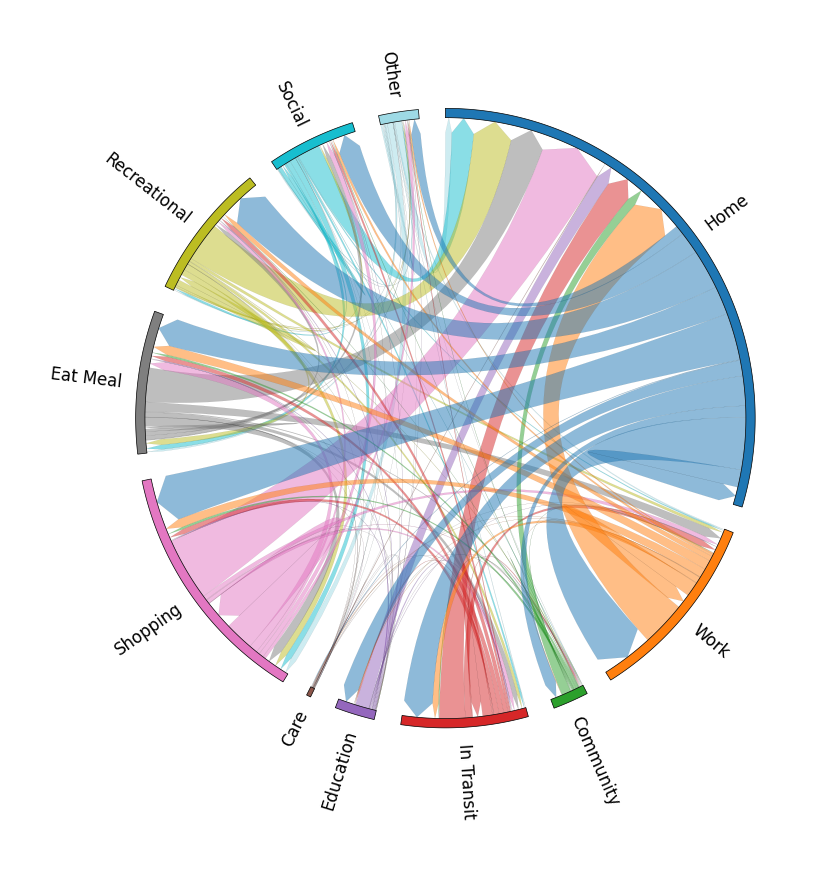

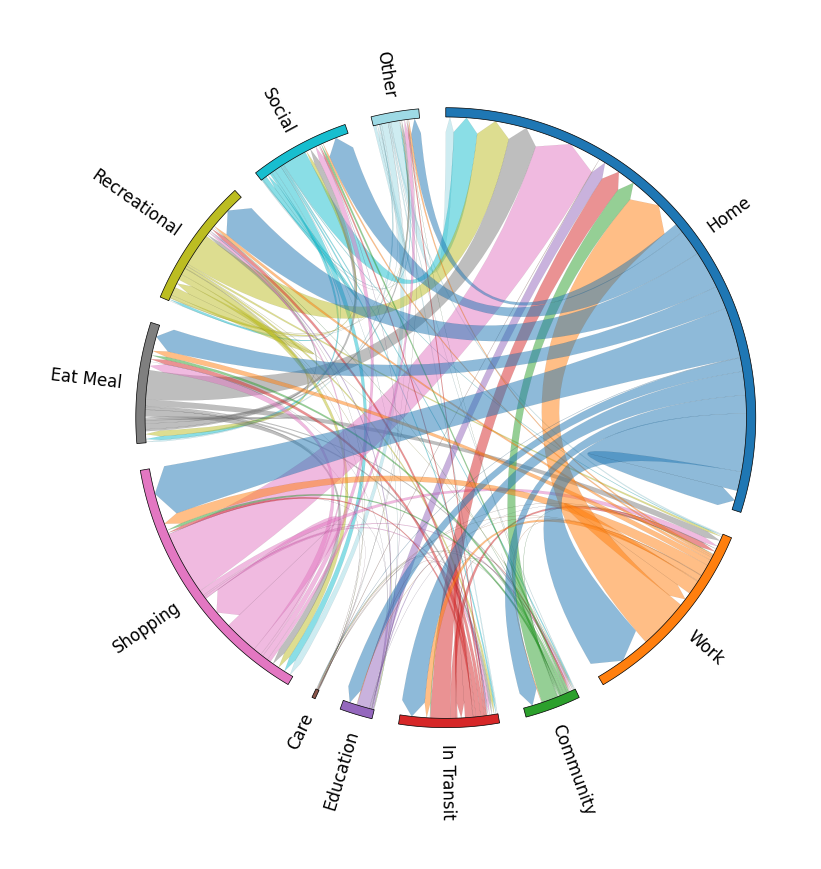

In [25]:
_, m_orig_sf = get_chord_diagram(data_t_sf, loc_type_key='loc_type', file_name='example.png', new_mappings=True)
_, m_orig_dc = get_chord_diagram(data_t_dc, loc_type_key='loc_type', file_name='example.png', new_mappings=True)
_, m_orig_dfw = get_chord_diagram(data_t_dfw, loc_type_key='loc_type', file_name='example.png', new_mappings=True)
_, m_orig_la = get_chord_diagram(data_t_la, loc_type_key='loc_type', file_name='example.png', new_mappings=True)
_, m_orig_minneapolis = get_chord_diagram(data_t_minneapolis, loc_type_key='loc_type', file_name='example.png', new_mappings=True)

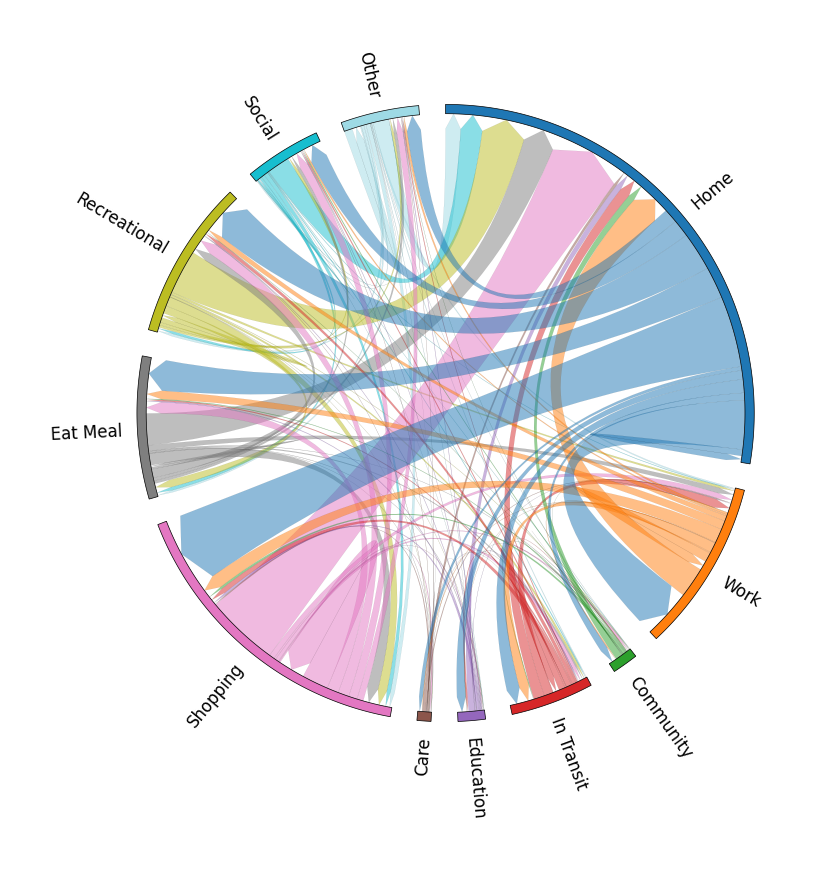

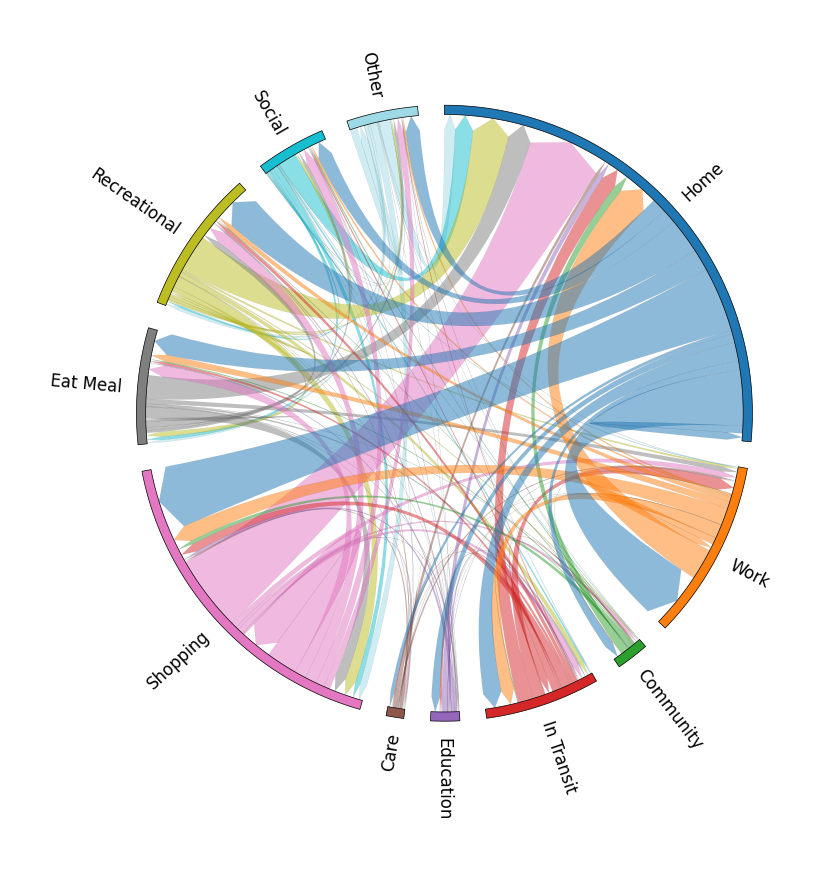

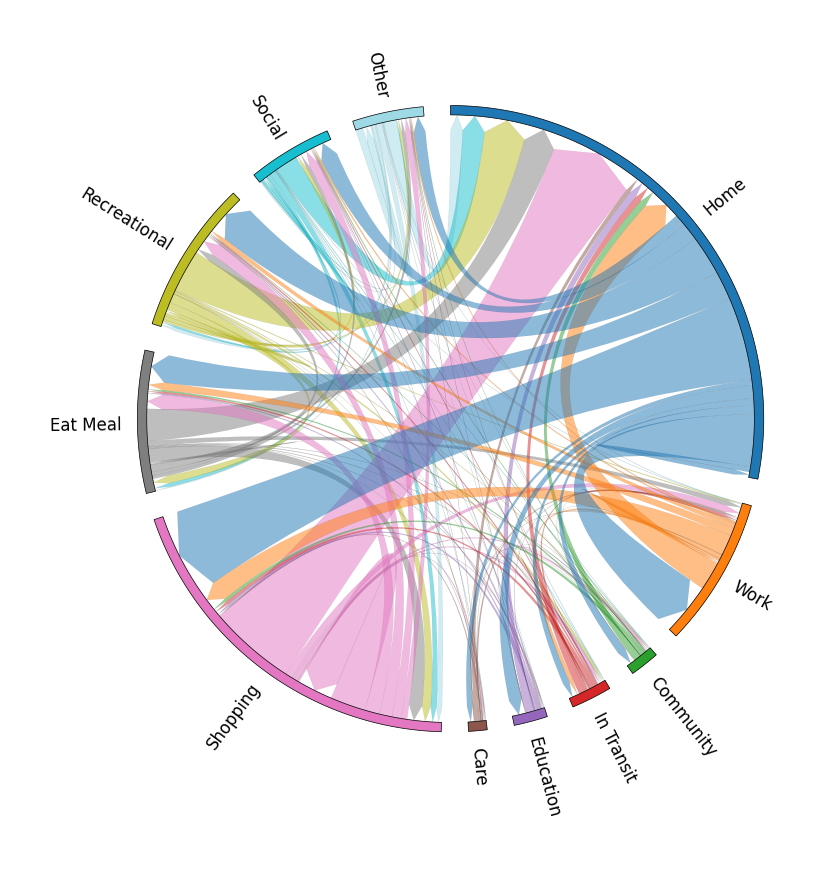

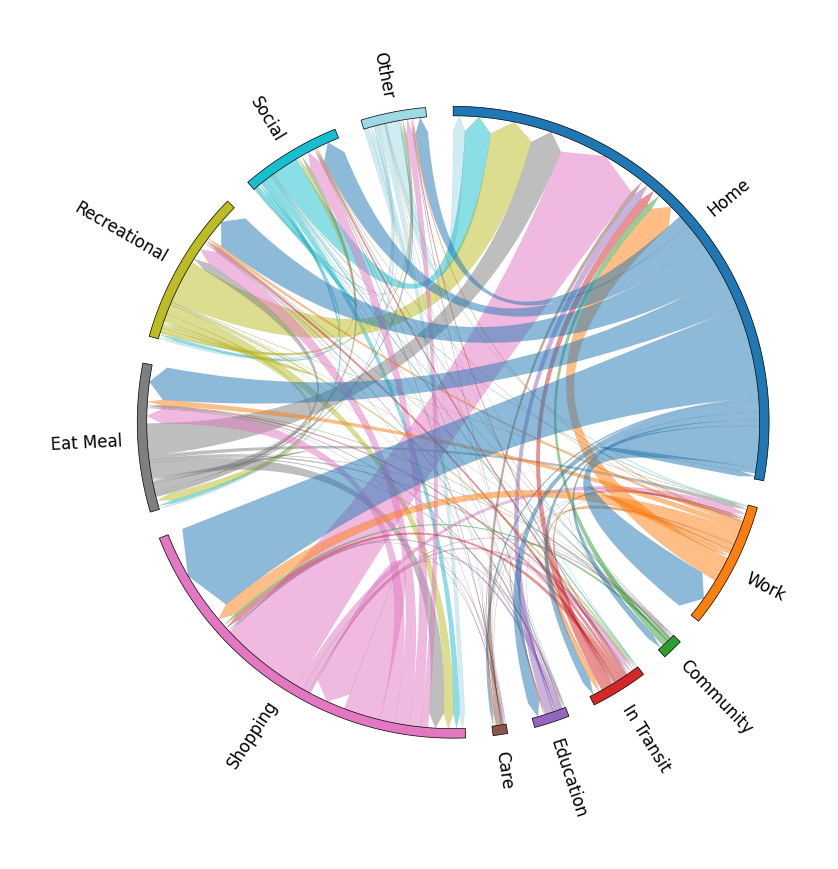

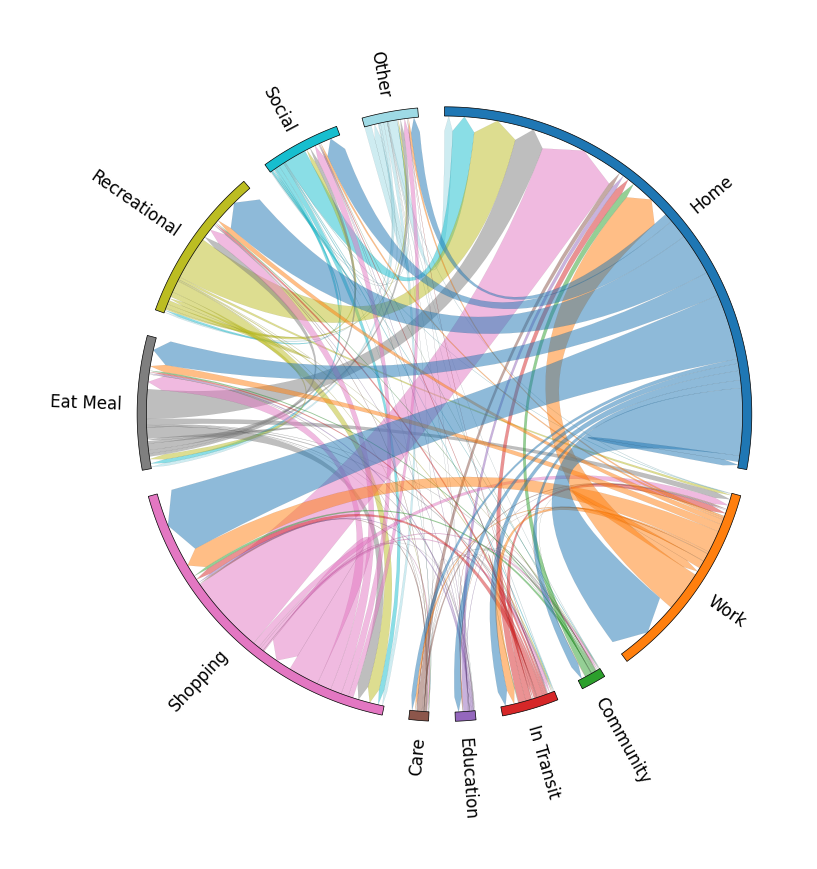

In [26]:
_, m_sf_gemini = get_chord_diagram(t_sf_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dc_gemini = get_chord_diagram(t_dc_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dfw_gemini = get_chord_diagram(t_dfw_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_la_gemini = get_chord_diagram(t_la_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_minneapolis_gemini = get_chord_diagram(t_minneapolis_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)

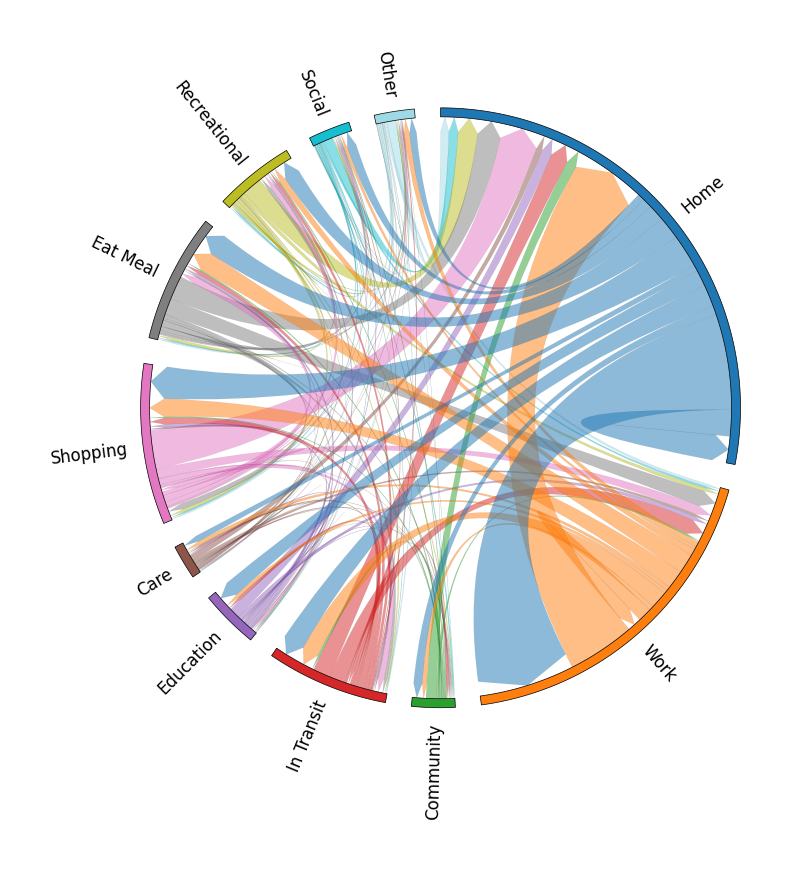

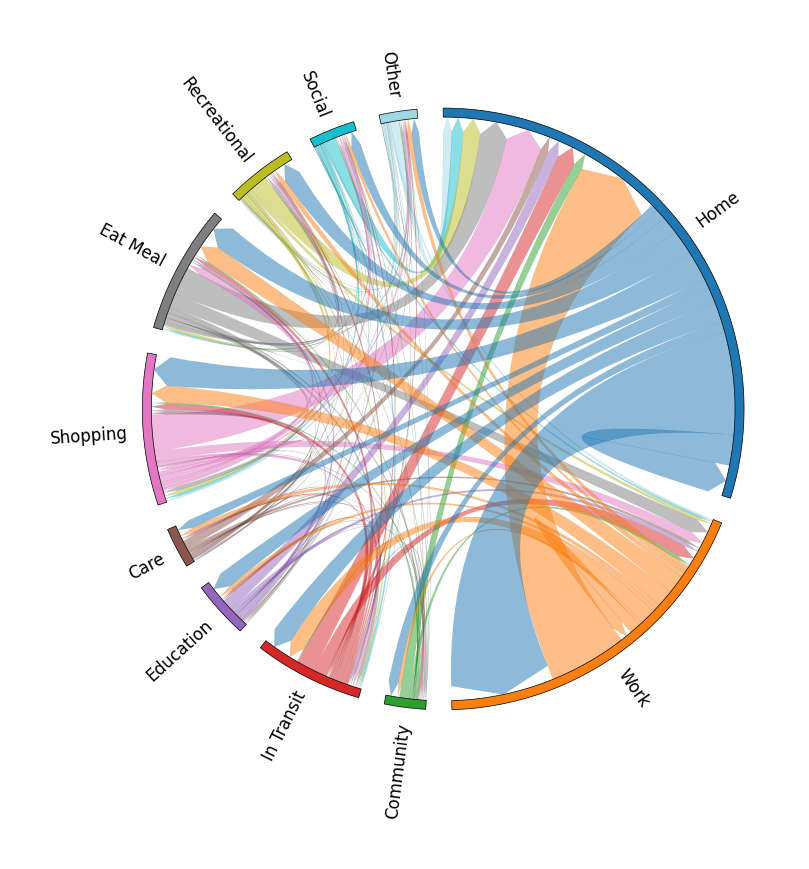

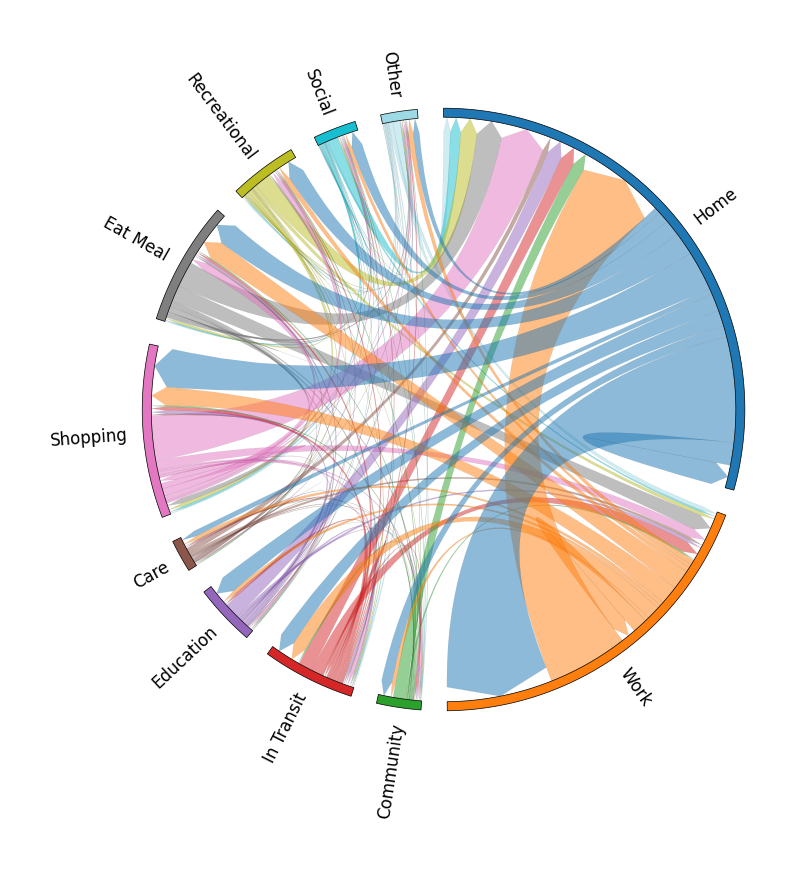

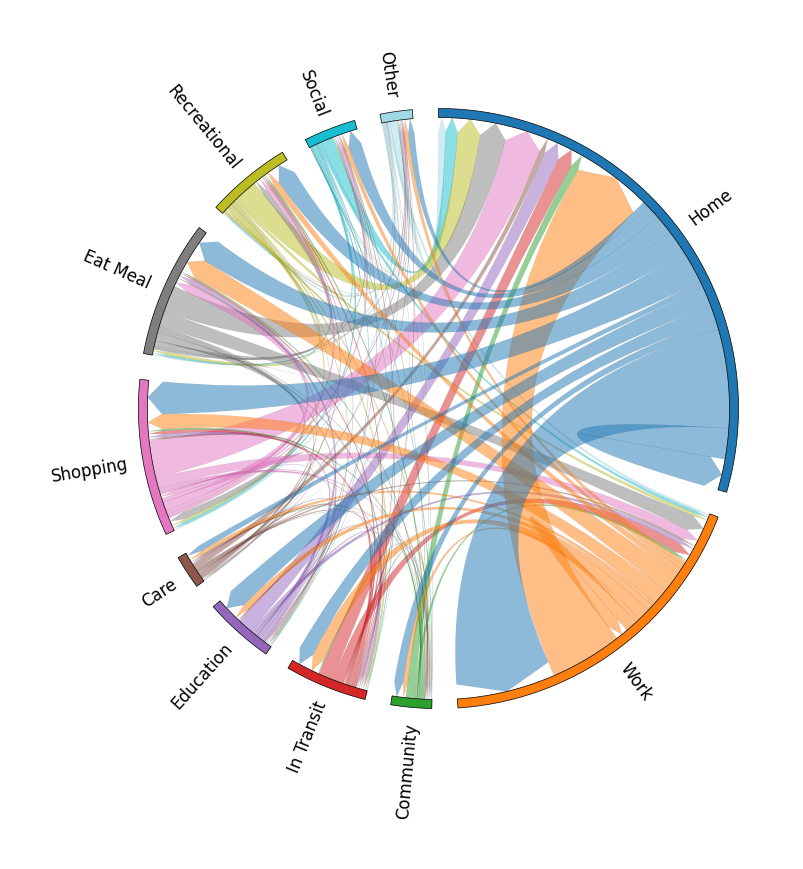

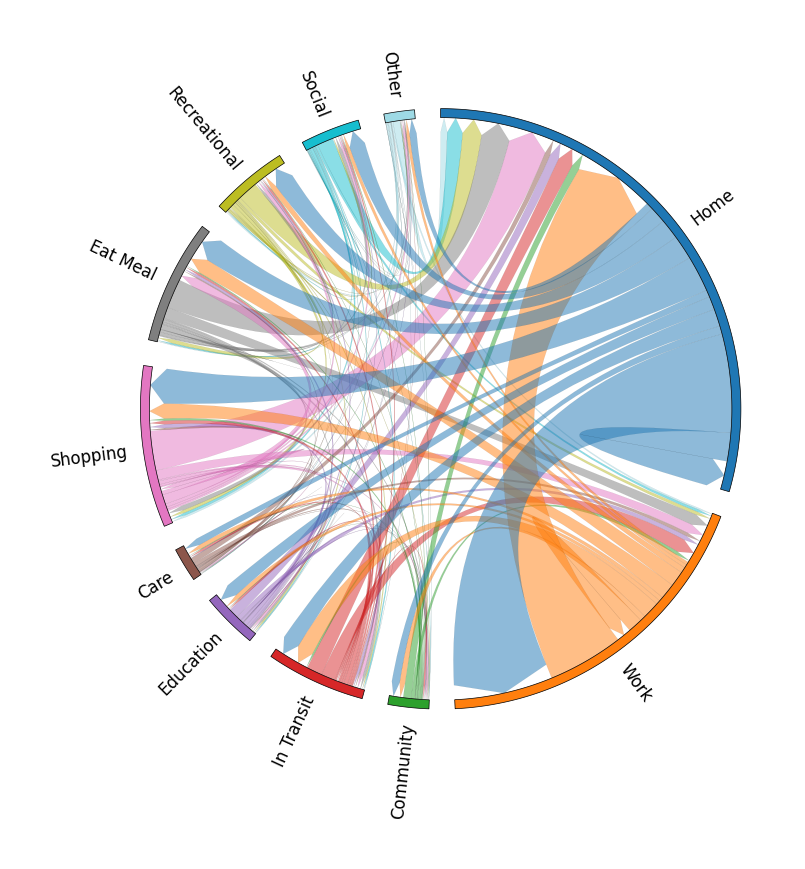

In [27]:
_, m_sf_llama = get_chord_diagram(t_sf_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dc_llama = get_chord_diagram(t_dc_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dfw_llama = get_chord_diagram(t_dfw_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_la_llama = get_chord_diagram(t_la_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_minneapolis_llama = get_chord_diagram(t_minneapolis_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)

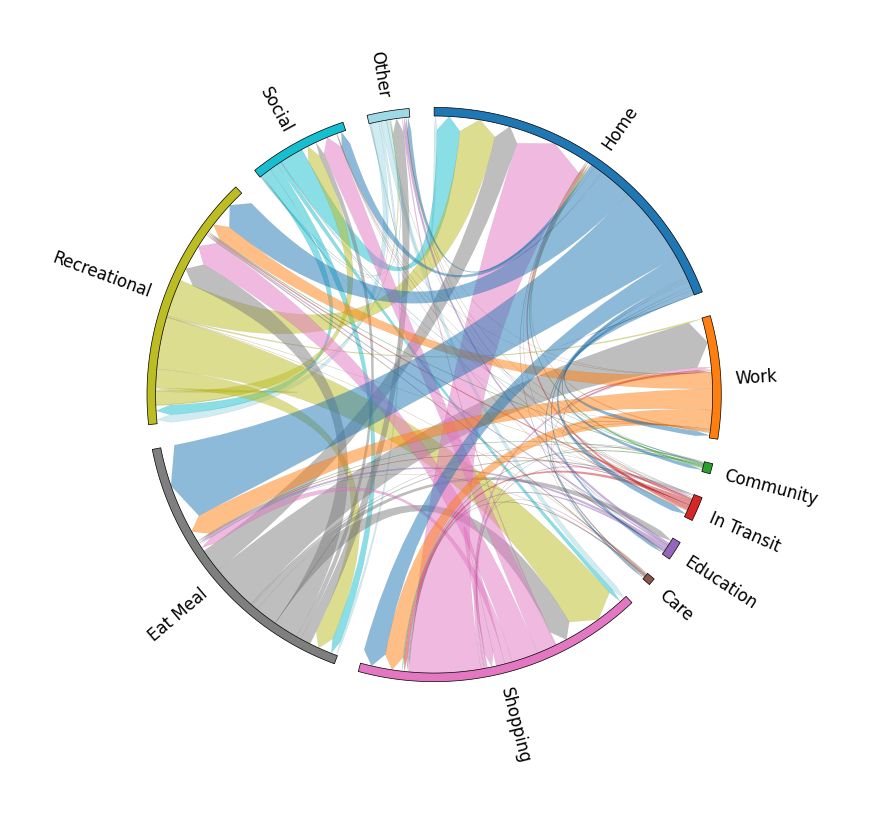

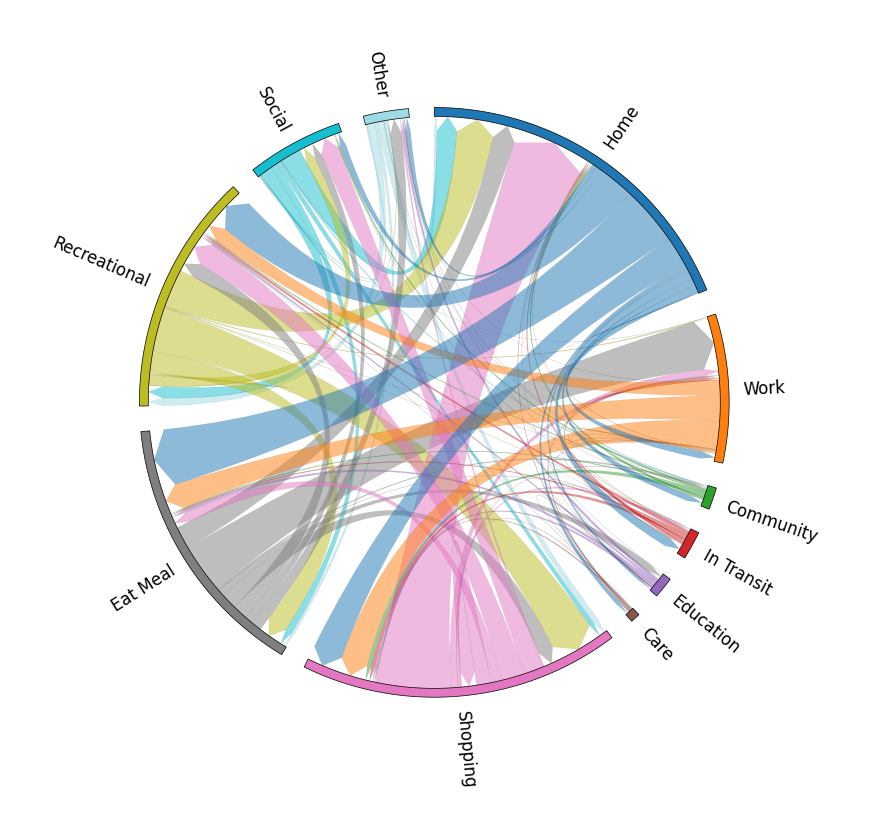

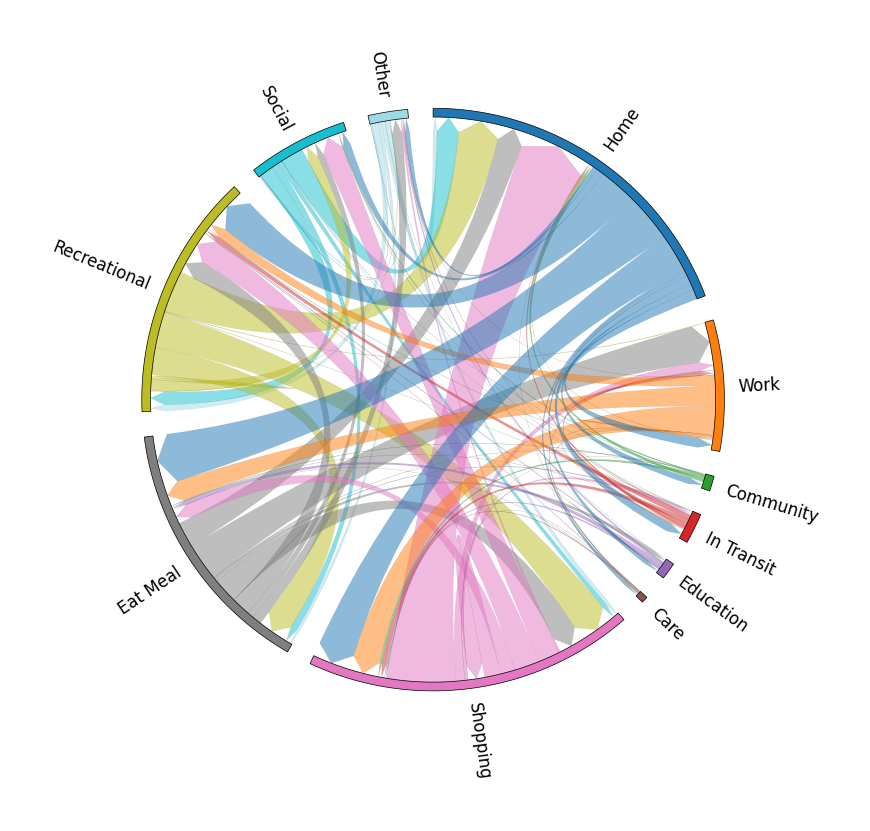

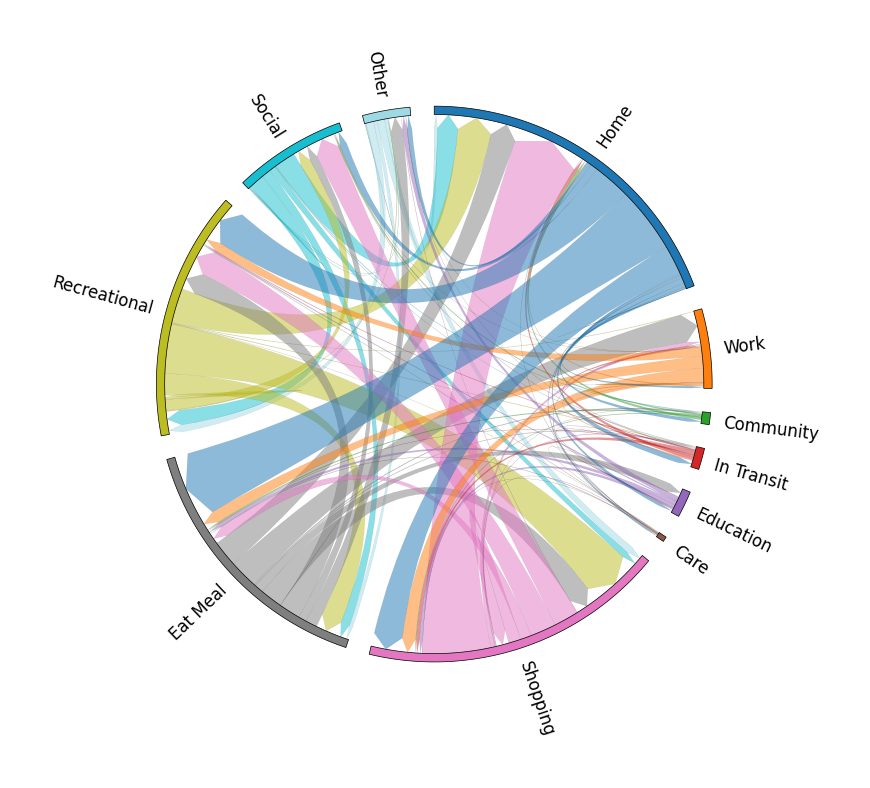

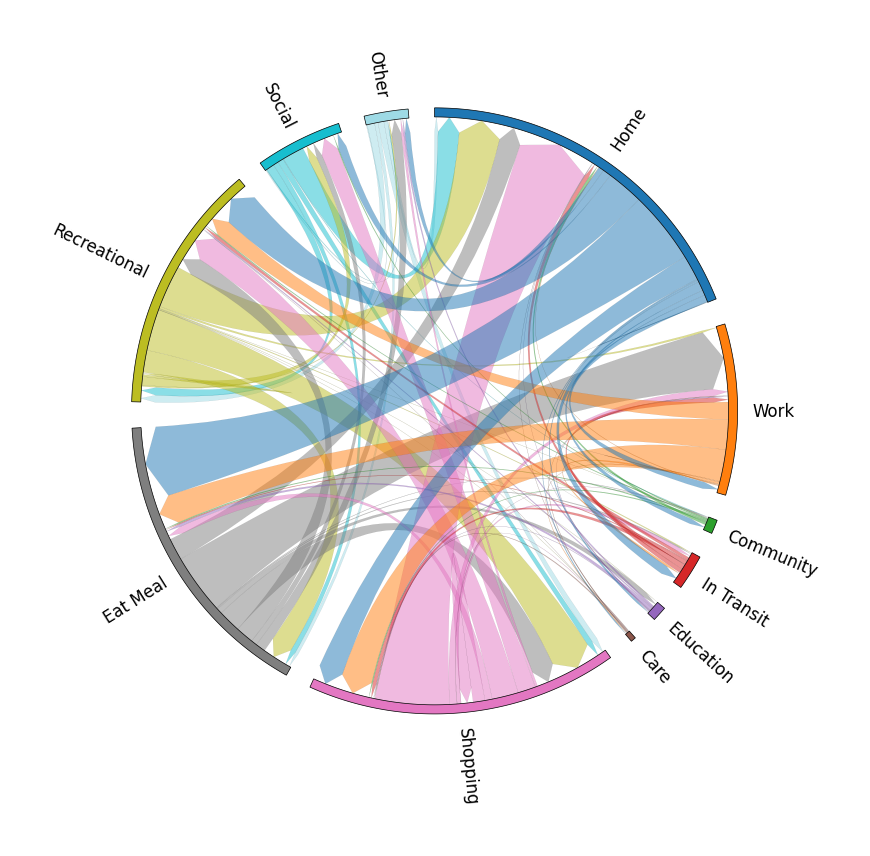

In [28]:
_, m_sf_gpt4 = get_chord_diagram(t_sf_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dc_gpt4 = get_chord_diagram(t_dc_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dfw_gpt4 = get_chord_diagram(t_dfw_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_la_gpt4 = get_chord_diagram(t_la_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_minneapolis_gpt4 = get_chord_diagram(t_minneapolis_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)

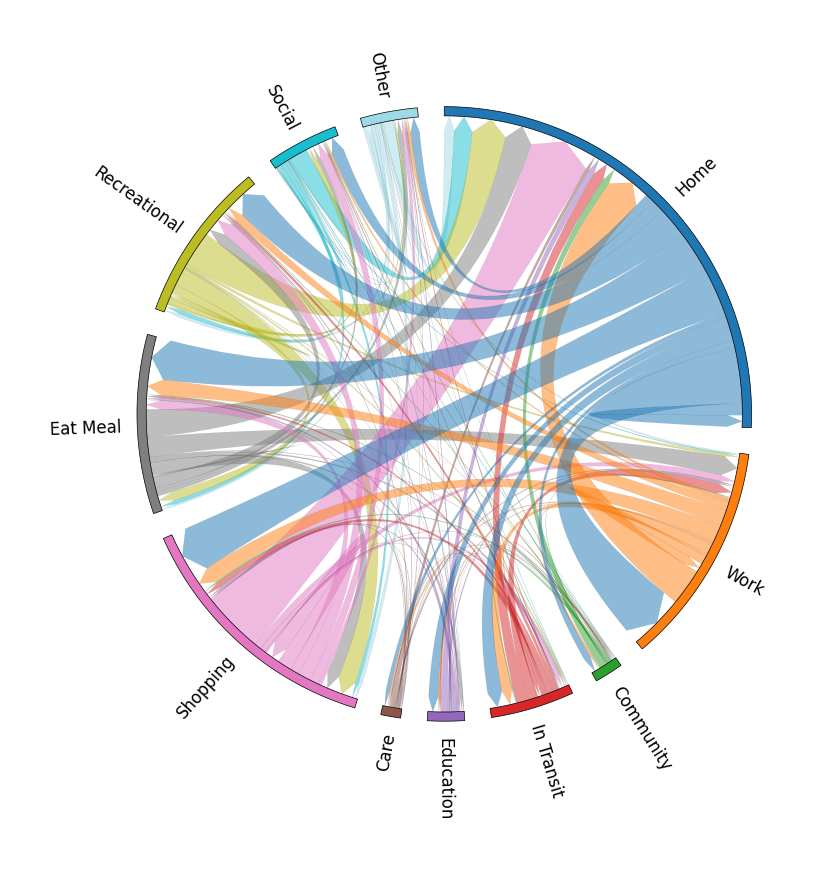

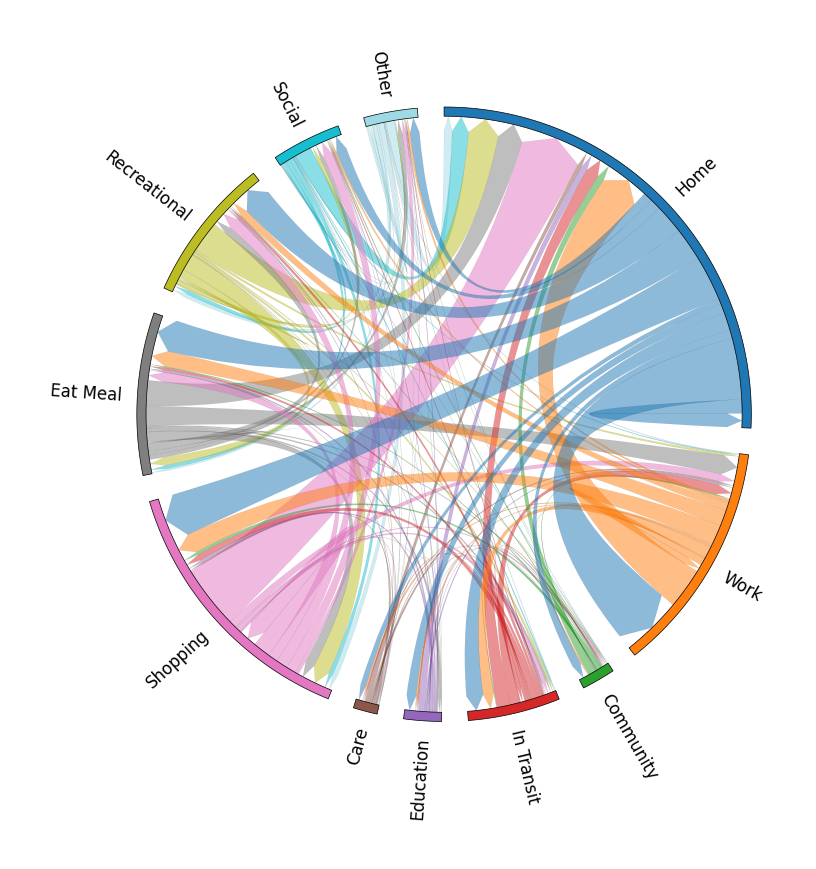

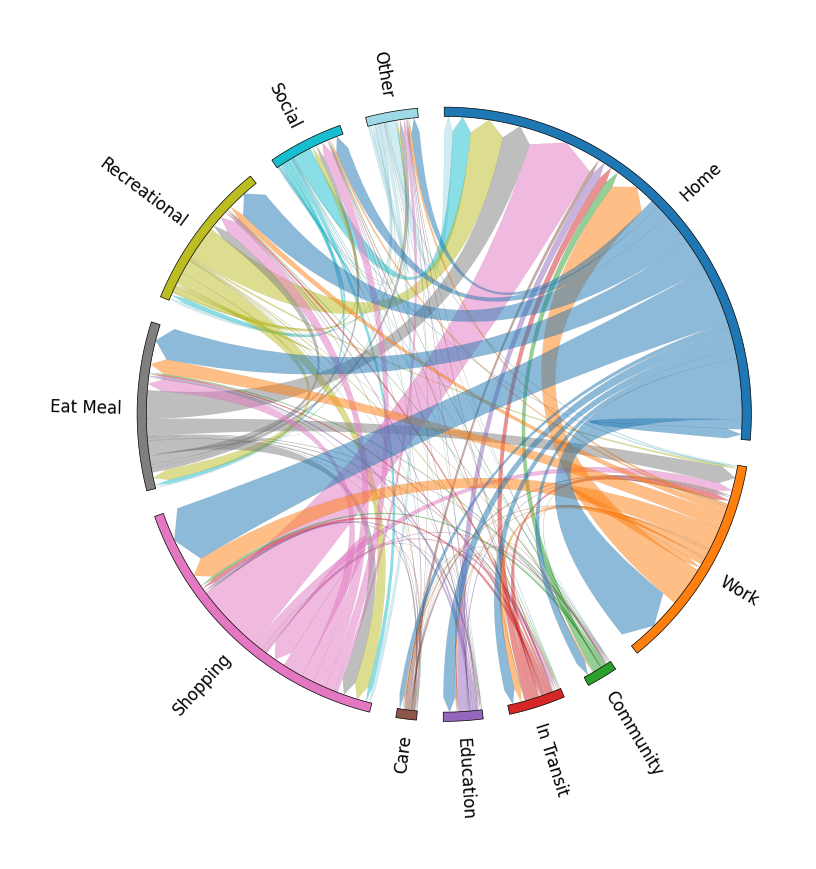

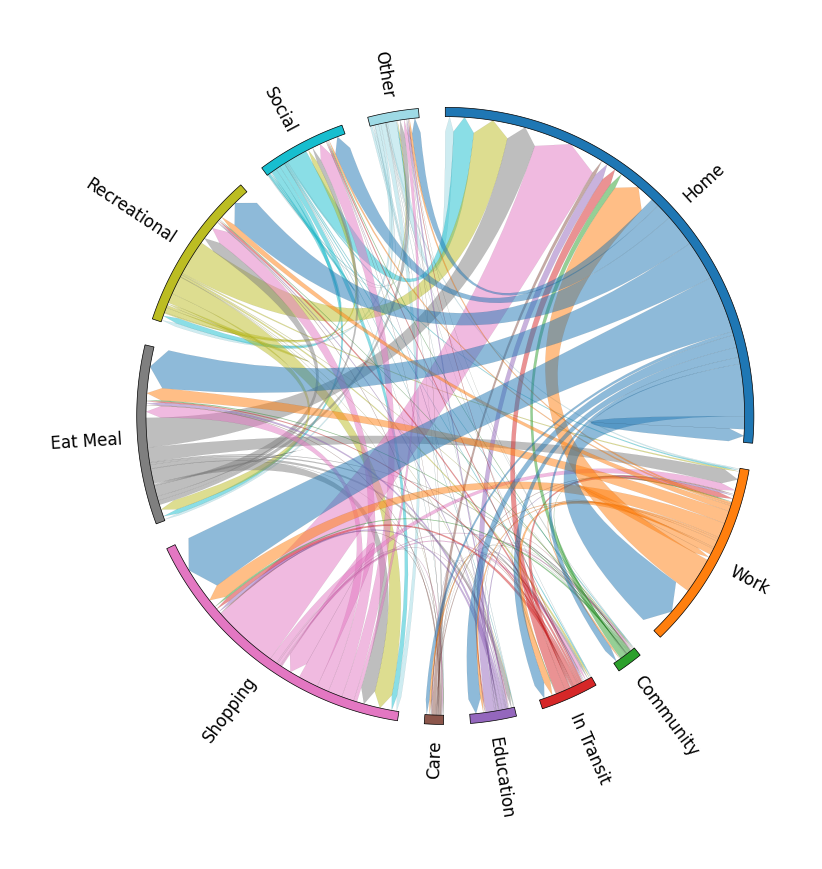

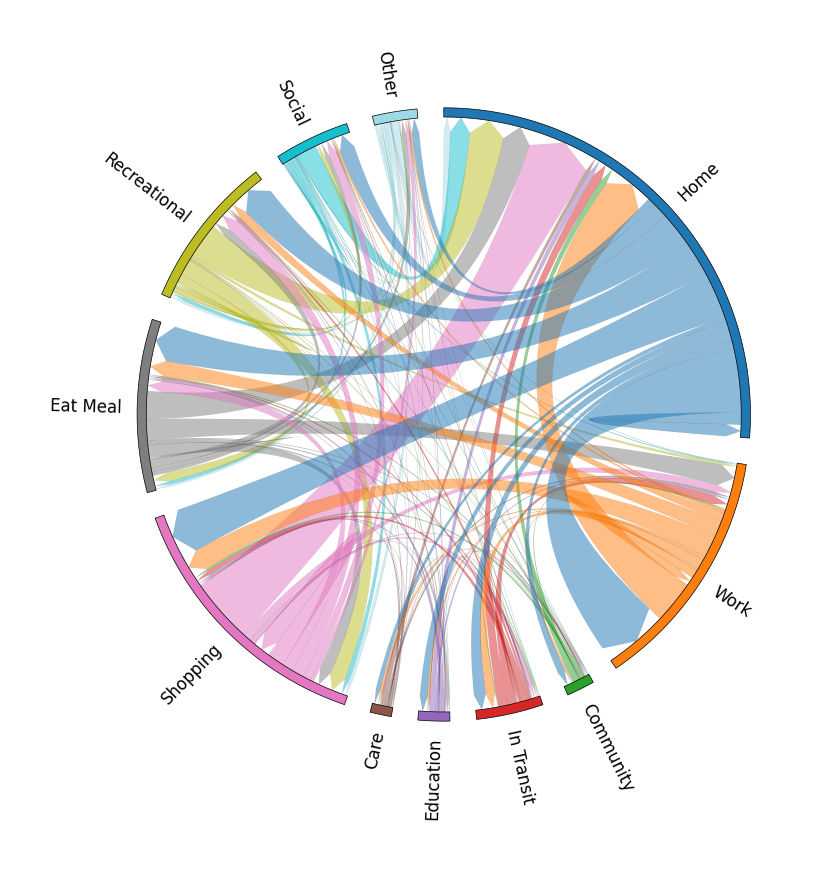

In [29]:
_, m_sf_ens = get_chord_diagram(t_sf_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dc_ens = get_chord_diagram(t_dc_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_dfw_ens = get_chord_diagram(t_dfw_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_la_ens = get_chord_diagram(t_la_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_minneapolis_ens = get_chord_diagram(t_minneapolis_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)

In [30]:
t_orig_prob_1_sf = get_transient_prob_1(data_t_sf, 'loc_type')
t_orig_prob_1_dc = get_transient_prob_1(data_t_dc, 'loc_type')
t_orig_prob_1_dfw = get_transient_prob_1(data_t_dfw, 'loc_type')
t_orig_prob_1_la = get_transient_prob_1(data_t_la, 'loc_type')
t_orig_prob_1_minneapolis = get_transient_prob_1(data_t_minneapolis, 'loc_type')

t_prob_1_sf_gemini = get_transient_prob_1(t_sf_gemini, 'loc_type_new')
t_prob_1_dc_gemini = get_transient_prob_1(t_dc_gemini, 'loc_type_new')
t_prob_1_dfw_gemini = get_transient_prob_1(t_dfw_gemini, 'loc_type_new')
t_prob_1_la_gemini = get_transient_prob_1(t_la_gemini, 'loc_type_new')
t_prob_1_minneapolis_gemini = get_transient_prob_1(t_minneapolis_gemini, 'loc_type_new')

t_prob_1_sf_llama = get_transient_prob_1(t_sf_llama, 'loc_type_new')
t_prob_1_dc_llama = get_transient_prob_1(t_dc_llama, 'loc_type_new')
t_prob_1_dfw_llama = get_transient_prob_1(t_dfw_llama, 'loc_type_new')
t_prob_1_la_llama = get_transient_prob_1(t_la_llama, 'loc_type_new')
t_prob_1_minneapolis_llama = get_transient_prob_1(t_minneapolis_llama, 'loc_type_new')

t_prob_1_sf_gpt4 = get_transient_prob_1(t_sf_gpt4, 'loc_type_new')
t_prob_1_dc_gpt4 = get_transient_prob_1(t_dc_gpt4, 'loc_type_new')
t_prob_1_dfw_gpt4 = get_transient_prob_1(t_dfw_gpt4, 'loc_type_new')
t_prob_1_la_gpt4 = get_transient_prob_1(t_la_gpt4, 'loc_type_new')
t_prob_1_minneapolis_gpt4 = get_transient_prob_1(t_minneapolis_gpt4, 'loc_type_new')

t_prob_1_sf_ens = get_transient_prob_1(t_sf_ens, 'loc_type_new')
t_prob_1_dc_ens = get_transient_prob_1(t_dc_ens, 'loc_type_new')
t_prob_1_dfw_ens = get_transient_prob_1(t_dfw_ens, 'loc_type_new')
t_prob_1_la_ens = get_transient_prob_1(t_la_ens, 'loc_type_new')
t_prob_1_minneapolis_ens = get_transient_prob_1(t_minneapolis_ens, 'loc_type_new')

In [31]:
t_orig_prob_2_sf = get_transient_prob_2(data_t_sf, 'loc_type')
t_orig_prob_2_dc = get_transient_prob_2(data_t_dc, 'loc_type')
t_orig_prob_2_dfw = get_transient_prob_2(data_t_dfw, 'loc_type')
t_orig_prob_2_la = get_transient_prob_2(data_t_la, 'loc_type')
t_orig_prob_2_minneapolis = get_transient_prob_2(data_t_minneapolis, 'loc_type')

t_prob_2_sf_gemini = get_transient_prob_2(t_sf_gemini, 'loc_type_new')
t_prob_2_dc_gemini = get_transient_prob_2(t_dc_gemini, 'loc_type_new')
t_prob_2_dfw_gemini = get_transient_prob_2(t_dfw_gemini, 'loc_type_new')
t_prob_2_la_gemini = get_transient_prob_2(t_la_gemini, 'loc_type_new')
t_prob_2_minneapolis_gemini = get_transient_prob_2(t_minneapolis_gemini, 'loc_type_new')

t_prob_2_sf_llama = get_transient_prob_2(t_sf_llama, 'loc_type_new')
t_prob_2_dc_llama = get_transient_prob_2(t_dc_llama, 'loc_type_new')
t_prob_2_dfw_llama = get_transient_prob_2(t_dfw_llama, 'loc_type_new')
t_prob_2_la_llama = get_transient_prob_2(t_la_llama, 'loc_type_new')
t_prob_2_minneapolis_llama = get_transient_prob_2(t_minneapolis_llama, 'loc_type_new')

t_prob_2_sf_gpt4 = get_transient_prob_2(t_sf_gpt4, 'loc_type_new')
t_prob_2_dc_gpt4 = get_transient_prob_2(t_dc_gpt4, 'loc_type_new')
t_prob_2_dfw_gpt4 = get_transient_prob_2(t_dfw_gpt4, 'loc_type_new')
t_prob_2_la_gpt4 = get_transient_prob_2(t_la_gpt4, 'loc_type_new')
t_prob_2_minneapolis_gpt4 = get_transient_prob_2(t_minneapolis_gpt4, 'loc_type_new')

t_prob_2_sf_ens = get_transient_prob_2(t_sf_ens, 'loc_type_new')
t_prob_2_dc_ens = get_transient_prob_2(t_dc_ens, 'loc_type_new')
t_prob_2_dfw_ens = get_transient_prob_2(t_dfw_ens, 'loc_type_new')
t_prob_2_la_ens = get_transient_prob_2(t_la_ens, 'loc_type_new')
t_prob_2_minneapolis_ens = get_transient_prob_2(t_minneapolis_ens, 'loc_type_new')

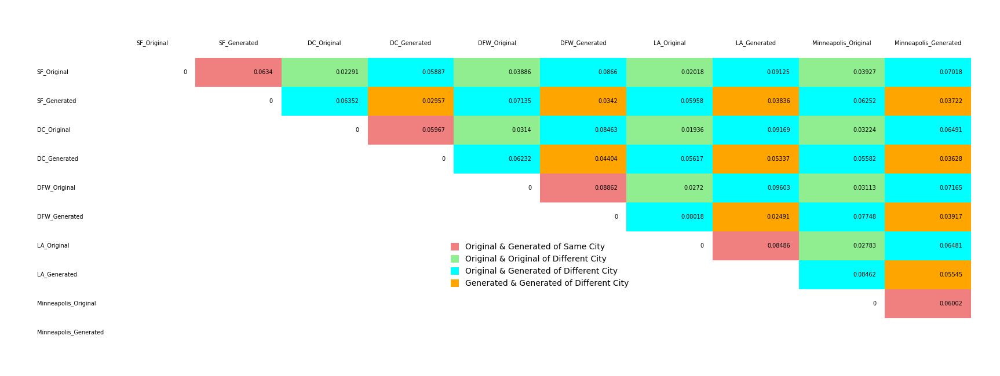

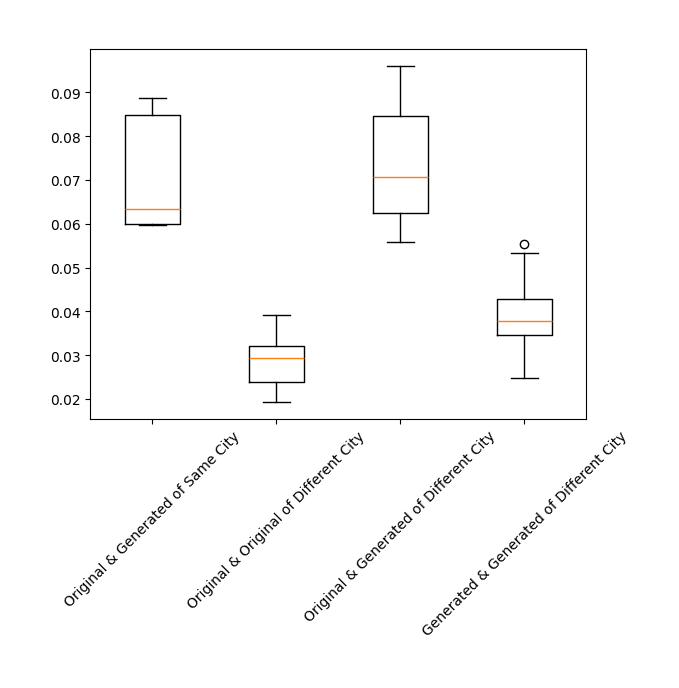

In [32]:
SOG, DOO, DOG, DGG , datadf = get_datadf_from_transient_probs(order=1, model='gemini')
datadf.to_pickle('inter_city_destination_probabilites_diff_Gemini.pkl')
# datadf
plot_table_inter_city_norm_2(datadf, SOG, DOO, DOG, DGG)

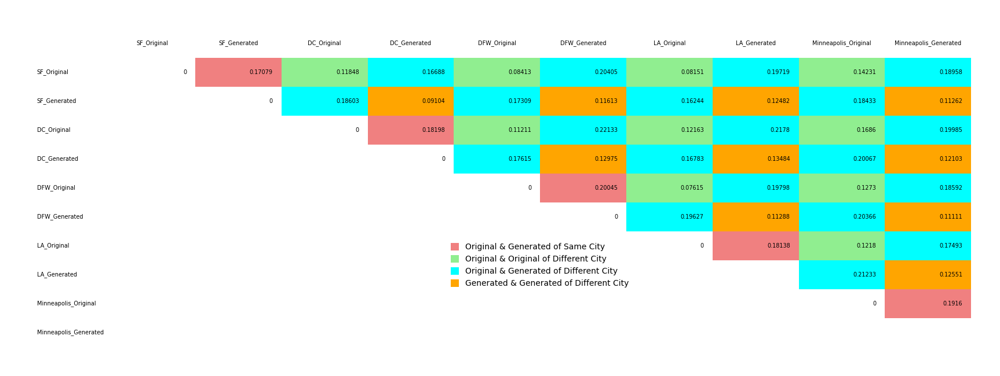

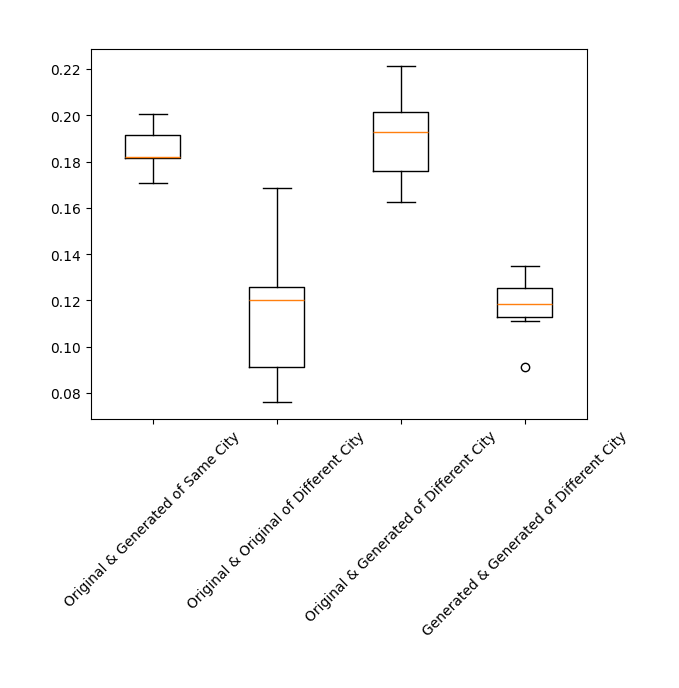

In [33]:
SOG_JS, DOO_JS, DOG_JS, DGG_JS, datadf_JS = get_datadf_from_transient_probs_JS(order=1, model='gemini')
datadf.to_pickle('inter_city_destination_probabilites_diff_Gemini_JS.pkl')
# datadf
plot_table_inter_city_norm_2(datadf_JS, SOG_JS, DOO_JS, DOG_JS, DGG_JS)

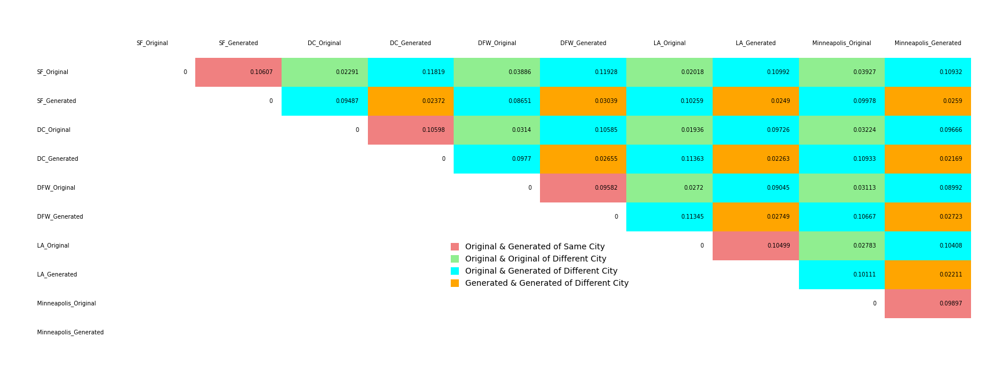

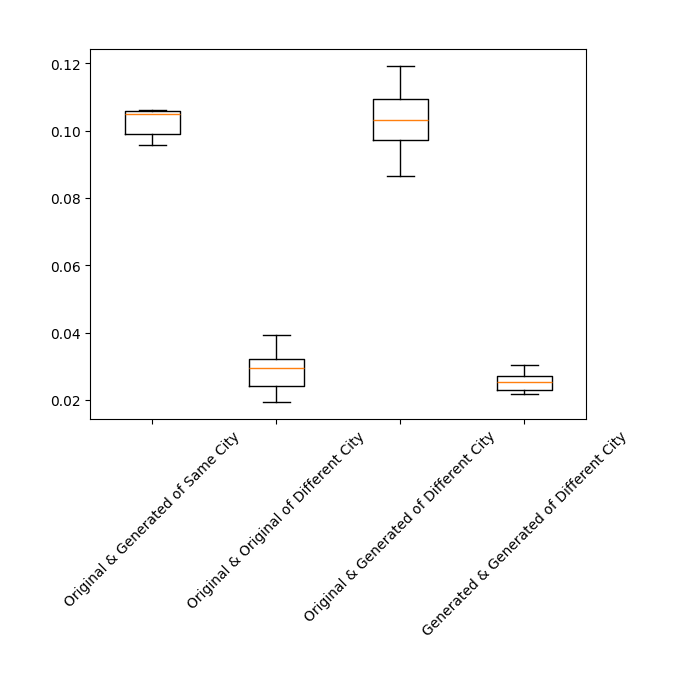

In [34]:
SOG, DOO, DOG, DGG , datadf = get_datadf_from_transient_probs(order=1, model='llama')
datadf.to_pickle('inter_city_destination_probabilites_diff_llama.pkl')
# datadf
plot_table_inter_city_norm_2(datadf, SOG, DOO, DOG, DGG)

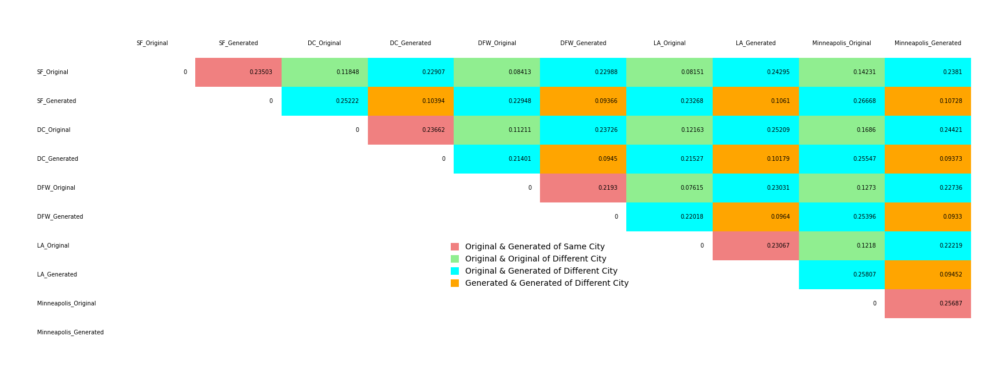

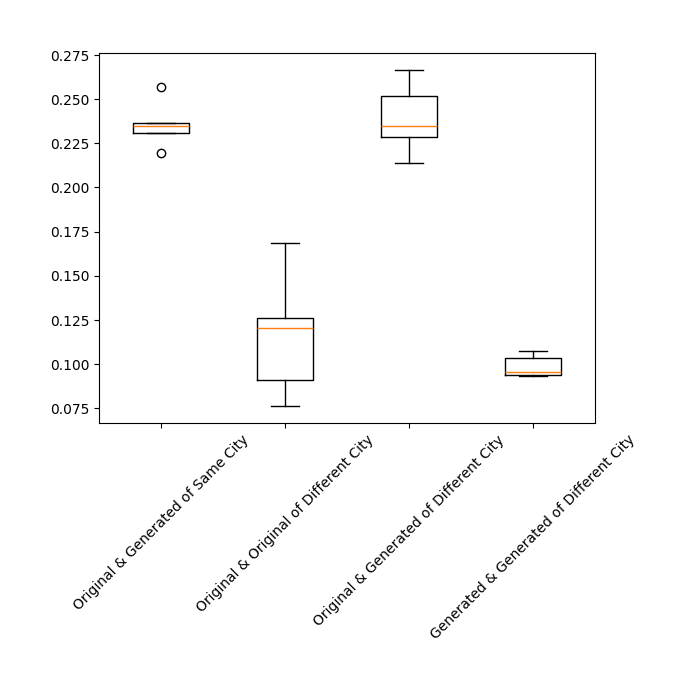

In [35]:
SOG_JS, DOO_JS, DOG_JS, DGG_JS, datadf_JS = get_datadf_from_transient_probs_JS(order=1, model='llama')
datadf.to_pickle('inter_city_destination_probabilites_diff_llama_JS.pkl')
# datadf
plot_table_inter_city_norm_2(datadf_JS, SOG_JS, DOO_JS, DOG_JS, DGG_JS)

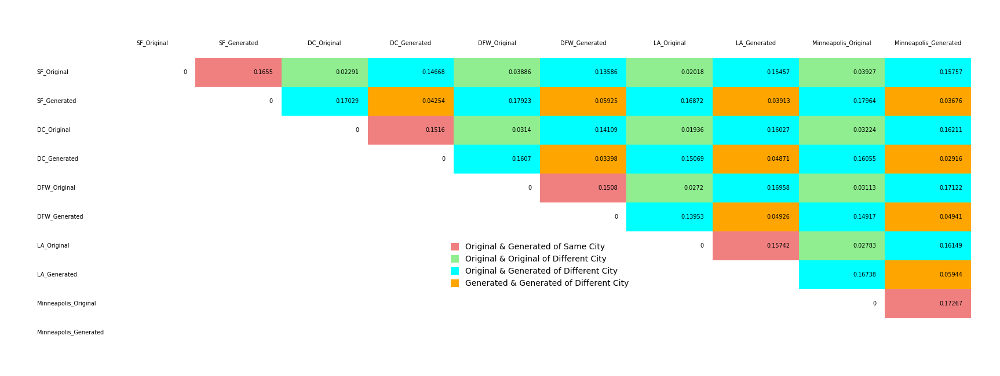

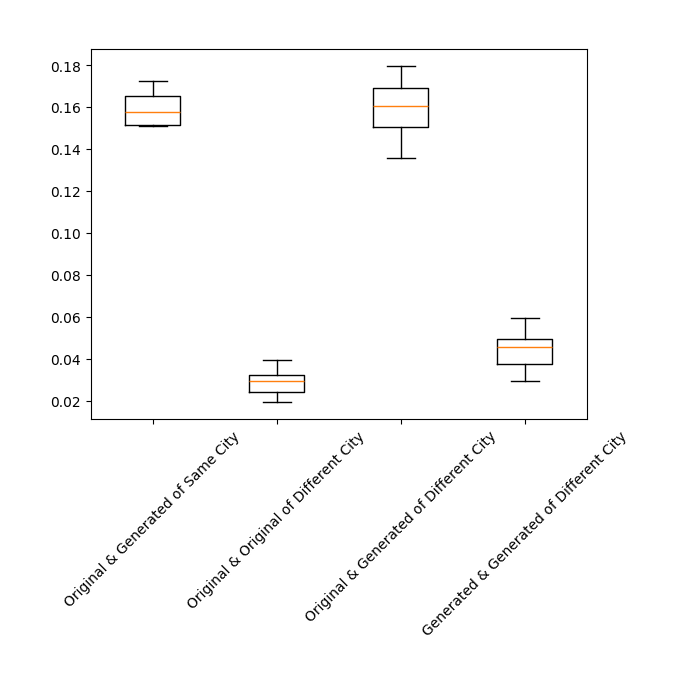

In [36]:
SOG, DOO, DOG, DGG , datadf = get_datadf_from_transient_probs(order=1, model='gpt4')
datadf.to_pickle('inter_city_destination_probabilites_diff_gpt4.pkl')
# datadf
plot_table_inter_city_norm_2(datadf, SOG, DOO, DOG, DGG)


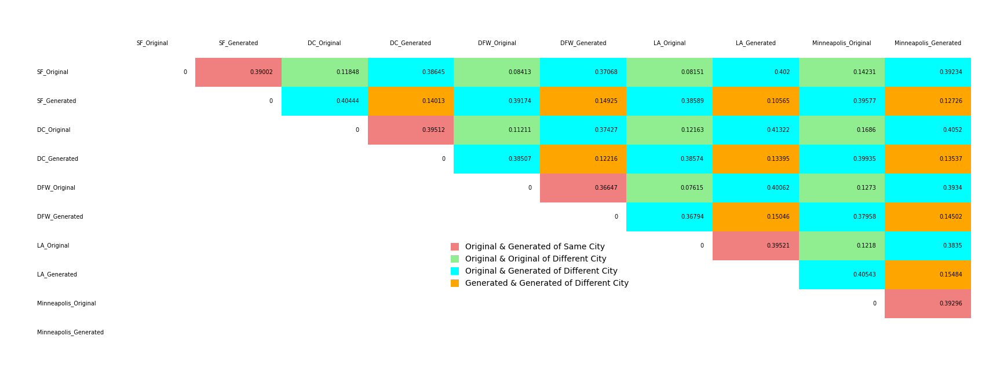

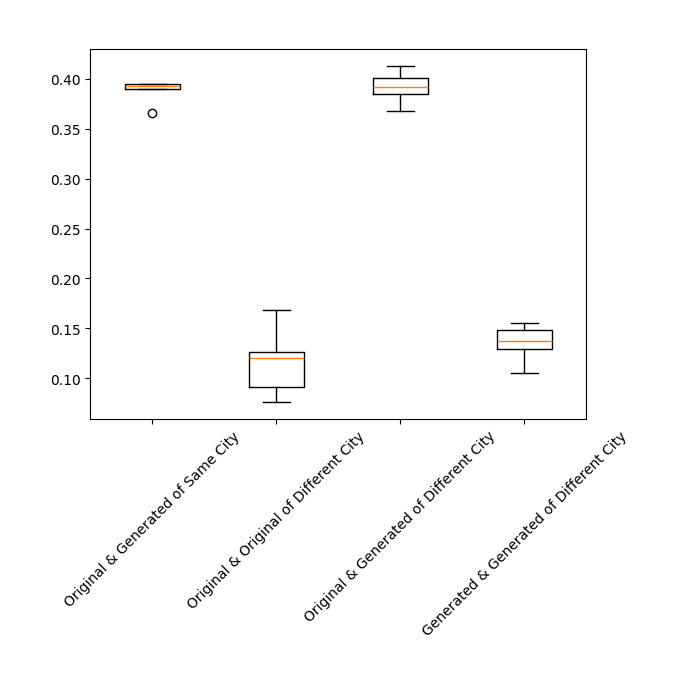

In [37]:
SOG_JS, DOO_JS, DOG_JS, DGG_JS, datadf_JS = get_datadf_from_transient_probs_JS(order=1, model='gpt4')
datadf.to_pickle('inter_city_destination_probabilites_diff_gpt4_JS.pkl')
# datadf
plot_table_inter_city_norm_2(datadf_JS, SOG_JS, DOO_JS, DOG_JS, DGG_JS)

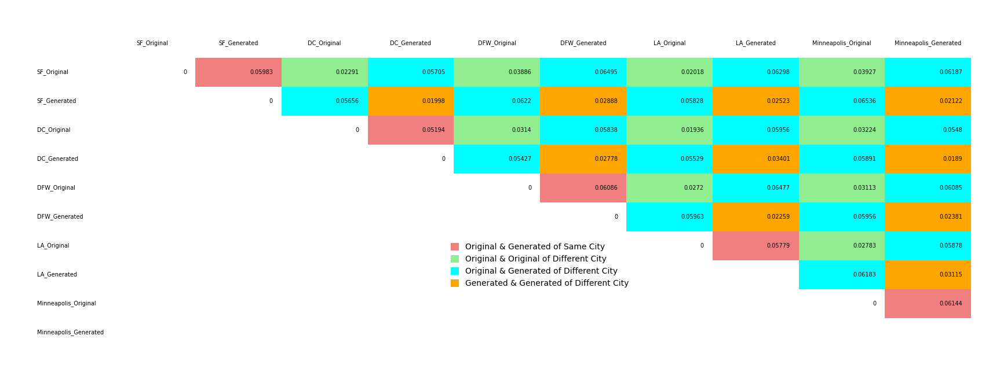

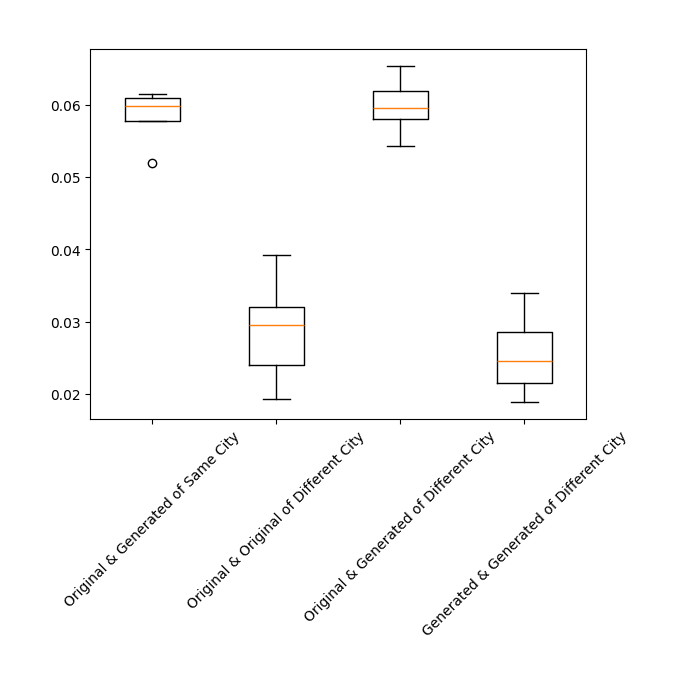

In [38]:
SOG, DOO, DOG, DGG , datadf = get_datadf_from_transient_probs(order=1, model='ens')
datadf.to_pickle('inter_city_destination_probabilites_diff_ens.pkl')
# datadf
plot_table_inter_city_norm_2(datadf, SOG, DOO, DOG, DGG)

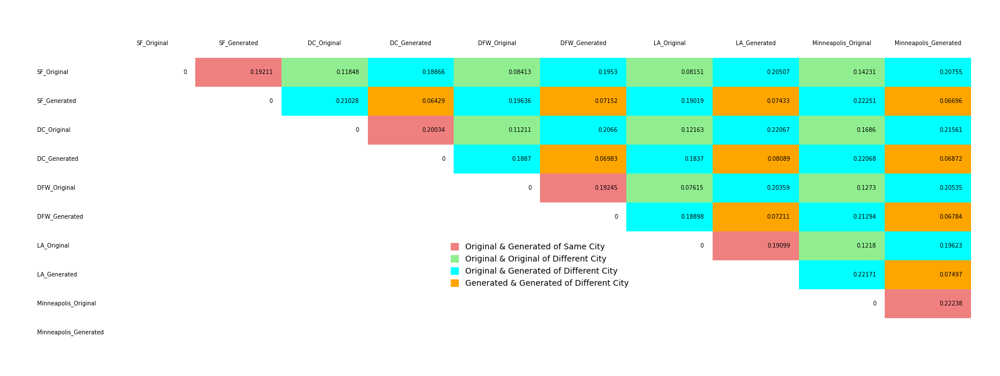

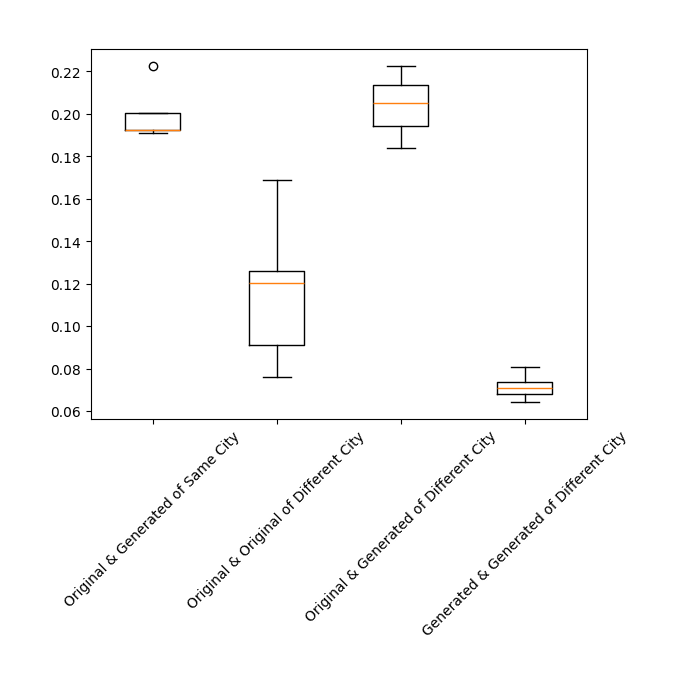

In [39]:
SOG_JS, DOO_JS, DOG_JS, DGG_JS, datadf_JS = get_datadf_from_transient_probs_JS(order=1, model='ens')
datadf.to_pickle('inter_city_destination_probabilites_diff_ens_JS.pkl')
# datadf
plot_table_inter_city_norm_2(datadf_JS, SOG_JS, DOO_JS, DOG_JS, DGG_JS)

In [40]:
res_1 = get_transient_destination_probabilities(order=1, model='gemini')
res_1

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.338983,0.356844,0.345885,0.352097,0.351828,0.318895,0.301554,0.321670,0.320199,0.321724
Work,0.118188,0.132375,0.133964,0.117673,0.119473,0.106634,0.114276,0.092541,0.077146,0.126181
Community,0.022485,0.026408,0.026545,0.021647,0.034226,0.015974,0.020719,0.018109,0.012996,0.016086
In Transit,0.089140,0.072037,0.079998,0.078068,0.061437,0.051374,0.071544,0.025015,0.034426,0.035272
Education,0.021743,0.022063,0.030596,0.024325,0.019770,0.017269,0.018291,0.020718,0.021844,0.012249
Care,0.003938,0.004011,0.002751,0.002722,0.002338,0.008778,0.011169,0.011510,0.008848,0.012249
Shopping,0.144039,0.144409,0.155339,0.152887,0.162840,0.192690,0.208158,0.229742,0.233790,0.206612
Eat Meal,0.081607,0.085743,0.086679,0.087947,0.074405,0.089797,0.073325,0.087937,0.091110,0.084120
Recreational,0.100211,0.084740,0.062115,0.083864,0.079294,0.099727,0.091130,0.095304,0.096364,0.097845
Social,0.053416,0.047468,0.050157,0.054358,0.065051,0.049360,0.044675,0.053407,0.062768,0.051505


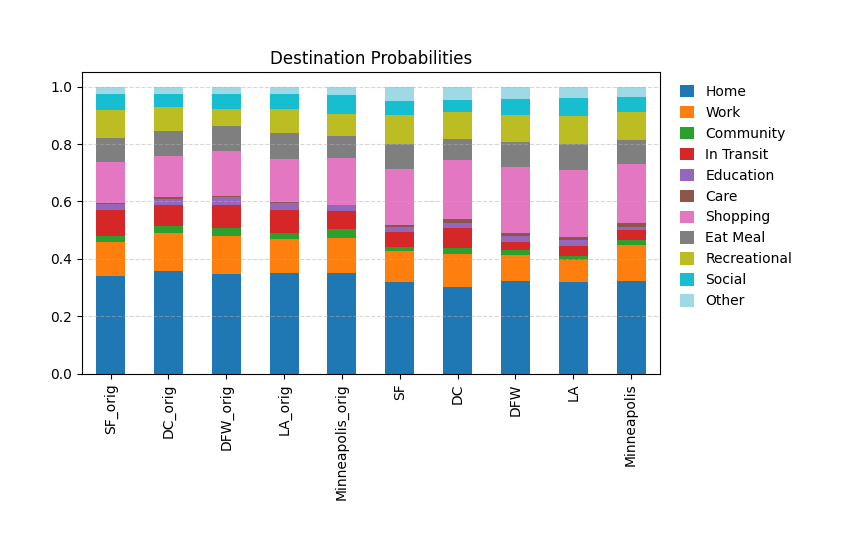

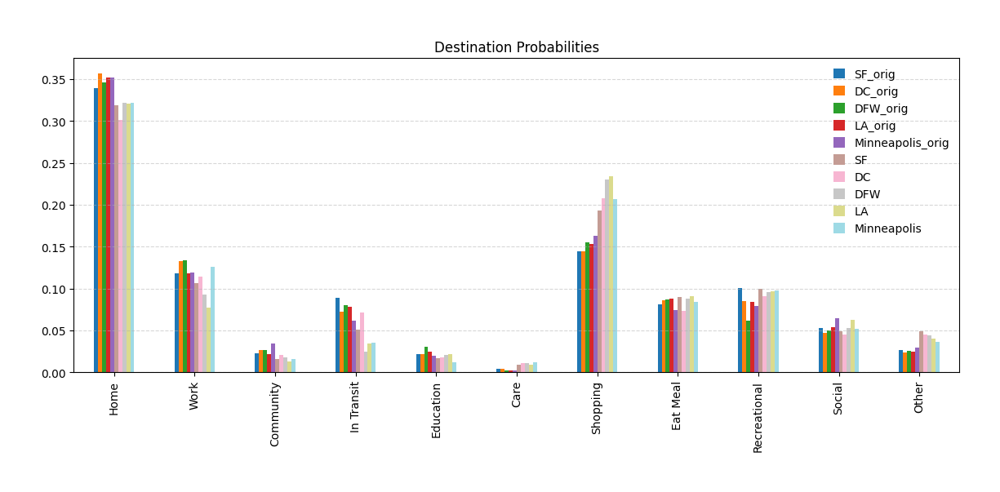

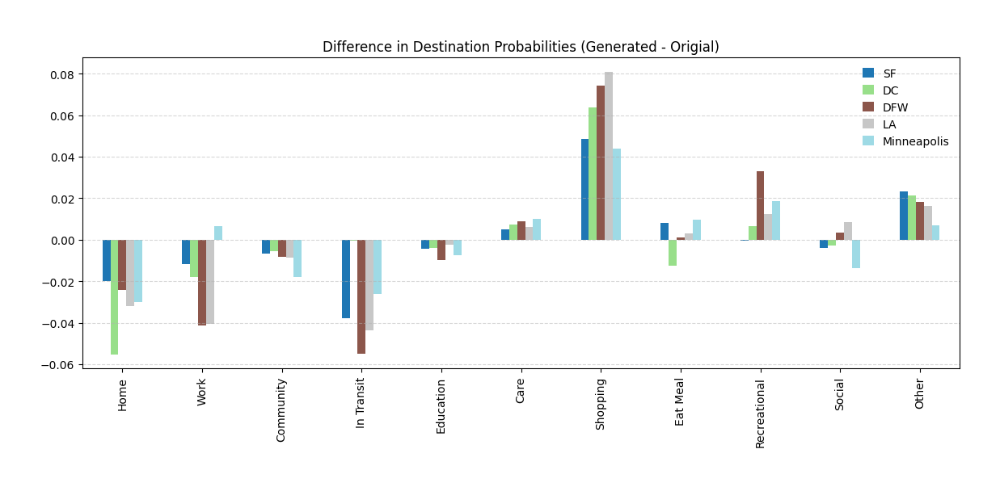

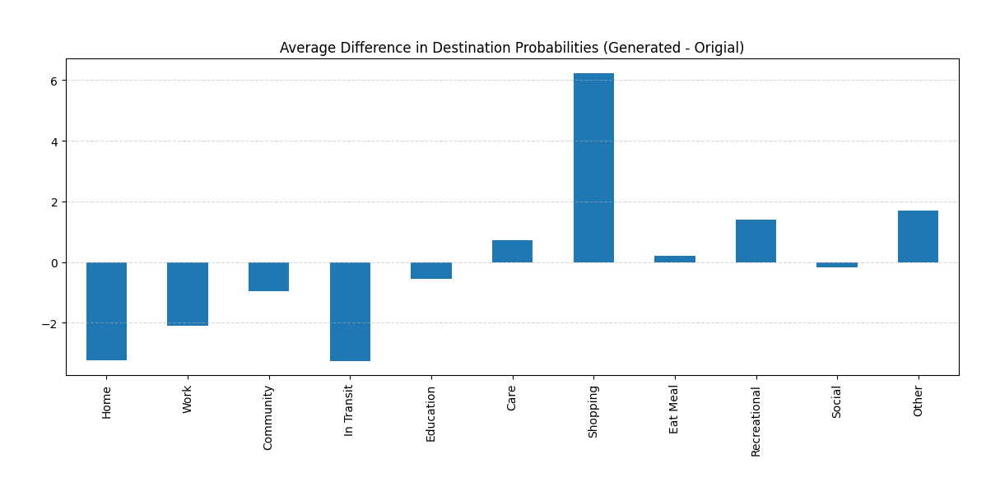

Home           -3.231925
Work           -2.097869
Community      -0.948538
In Transit     -3.260984
Education      -0.562517
Care            0.735870
Shopping        6.229524
Eat Meal        0.198172
Recreational    1.402912
Social         -0.174699
Other           1.710056
dtype: float64
1.8684604805477851
[0.64919316 1.40291222 2.66489714 3.26098419]
2.664897135512449
Home         -3.231925
In Transit   -3.260984
Shopping      6.229524
dtype: float64


In [41]:
destination_probs_diff_gemini = create_plots_for_destination_prob(res_1)

In [42]:
res_1 = get_transient_destination_probabilities(order=1, model='llama')
res_1

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.338983,0.356844,0.345885,0.352097,0.351828,0.315672,0.339539,0.333844,0.334390,0.332916
Work,0.118188,0.132375,0.133964,0.117673,0.119473,0.218964,0.217512,0.226325,0.214298,0.218543
Community,0.022485,0.026408,0.026545,0.021647,0.034226,0.028635,0.028203,0.029654,0.027117,0.027206
In Transit,0.089140,0.072037,0.079998,0.078068,0.061437,0.078361,0.069862,0.059881,0.054411,0.065509
Education,0.021743,0.022063,0.030596,0.024325,0.019770,0.038237,0.036498,0.039028,0.045607,0.036155
Care,0.003938,0.004011,0.002751,0.002722,0.002338,0.022805,0.026728,0.021810,0.022011,0.022731
Shopping,0.144039,0.144409,0.155339,0.152887,0.162840,0.104938,0.098065,0.111728,0.101250,0.104349
Eat Meal,0.081607,0.085743,0.086679,0.087947,0.074405,0.084362,0.083871,0.080161,0.089100,0.081618
Recreational,0.100211,0.084740,0.062115,0.083864,0.079294,0.054698,0.044977,0.045150,0.056700,0.051190
Social,0.053416,0.047468,0.050157,0.054358,0.065051,0.027606,0.030230,0.028697,0.034337,0.039556


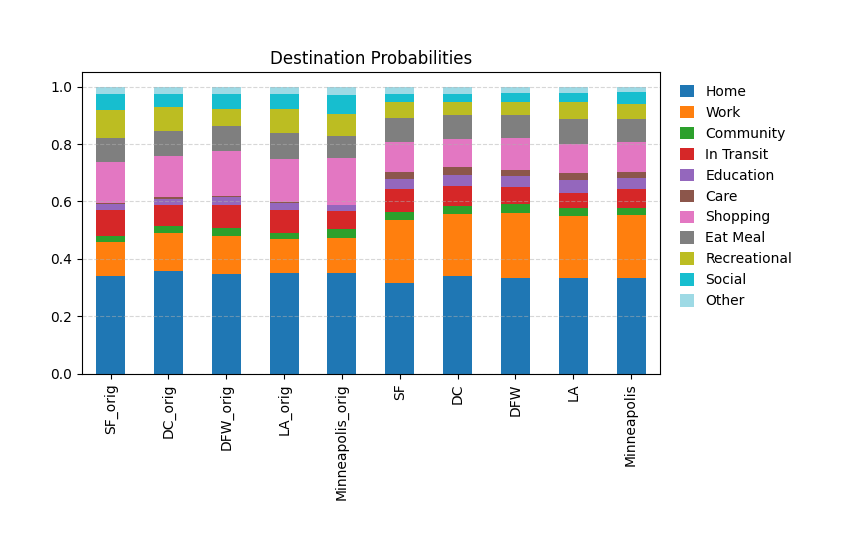

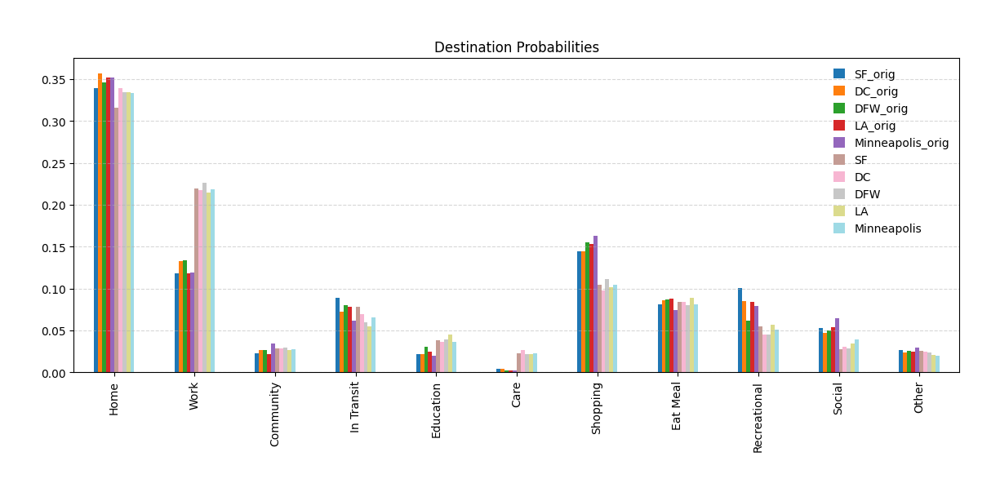

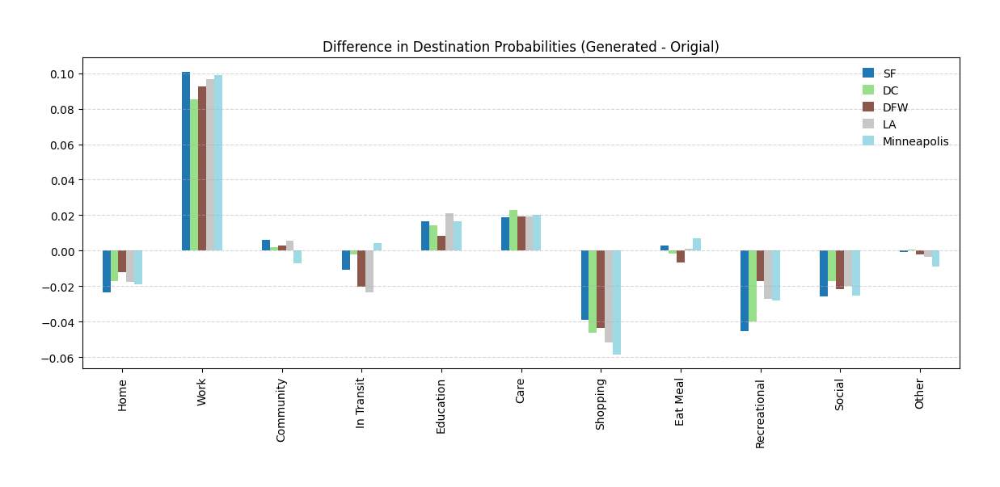

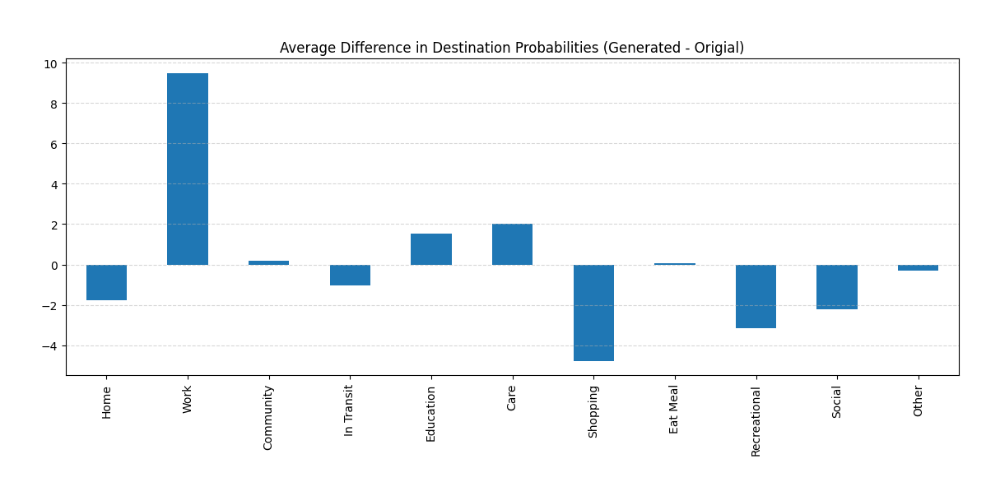

Home           -1.785542
Work            9.479392
Community       0.190090
In Transit     -1.053121
Education       1.540564
Care            2.006488
Shopping       -4.783695
Eat Meal        0.054617
Recreational   -3.150163
Social         -2.200448
Other          -0.298183
dtype: float64
2.4129366076580685
[0.67565156 1.78554244 2.67530534 4.78369511]
2.6753053368804816
Work            9.479392
Shopping       -4.783695
Recreational   -3.150163
dtype: float64


In [43]:
destination_probs_diff_llama = create_plots_for_destination_prob(res_1)

In [44]:
res_1 = get_transient_destination_probabilities(order=1, model='gpt4')
res_1

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.338983,0.356844,0.345885,0.352097,0.351828,0.226176,0.221560,0.226511,0.226922,0.223762
Work,0.118188,0.132375,0.133964,0.117673,0.119473,0.081648,0.096139,0.085707,0.054491,0.107673
Community,0.022485,0.026408,0.026545,0.021647,0.034226,0.006824,0.014252,0.009848,0.008211,0.008911
In Transit,0.089140,0.072037,0.079998,0.078068,0.061437,0.016330,0.018399,0.019963,0.014680,0.022277
Education,0.021743,0.022063,0.030596,0.024325,0.019770,0.012917,0.013734,0.011179,0.018164,0.009406
Care,0.003938,0.004011,0.002751,0.002722,0.002338,0.004874,0.006219,0.004259,0.003483,0.003218
Shopping,0.144039,0.144409,0.155339,0.152887,0.162840,0.193029,0.207308,0.216130,0.210002,0.196040
Eat Meal,0.081607,0.085743,0.086679,0.087947,0.074405,0.192298,0.174138,0.172478,0.182632,0.188366
Recreational,0.100211,0.084740,0.062115,0.083864,0.079294,0.171582,0.156517,0.161831,0.171187,0.157921
Social,0.053416,0.047468,0.050157,0.054358,0.065051,0.066293,0.062451,0.066010,0.077382,0.054703


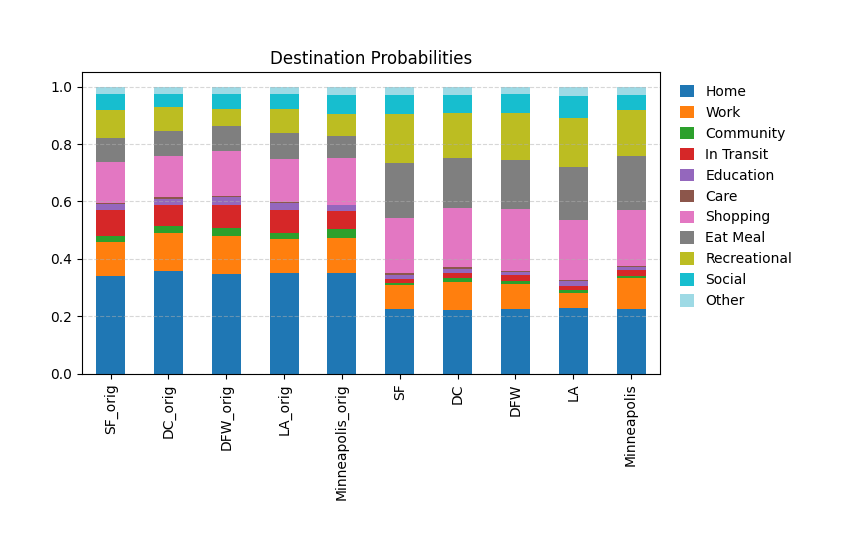

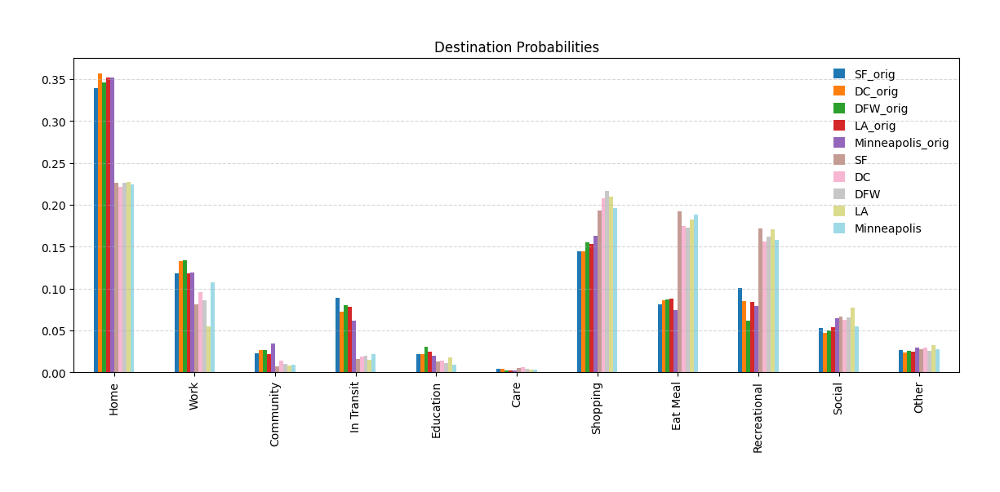

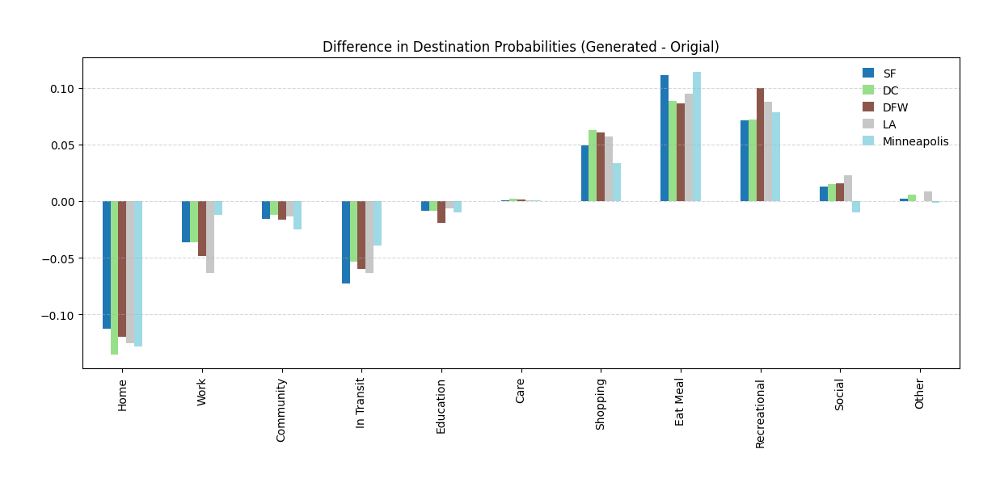

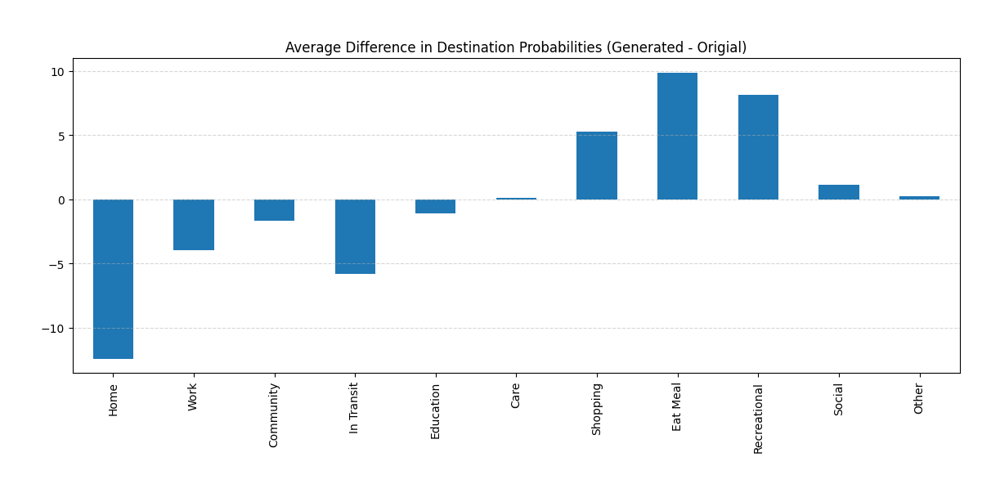

Home           -12.414131
Work            -3.920298
Community       -1.665274
In Transit      -5.780637
Education       -1.061932
Care             0.125854
Shopping         5.259887
Eat Meal         9.870647
Recreational     8.176281
Social           1.127809
Other            0.281793
dtype: float64
4.516776578386473
[1.09487058 3.92029762 6.97845873 9.87064729]
6.978458726335786
Home           -12.414131
Eat Meal         9.870647
Recreational     8.176281
dtype: float64


In [45]:
destination_probs_diff_gpt4 = create_plots_for_destination_prob(res_1)


In [46]:
res_1 = get_transient_destination_probabilities(order=1, model='ens')
res_1

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.338983,0.356844,0.345885,0.352097,0.351828,0.295250,0.294917,0.302710,0.302817,0.301408
Work,0.118188,0.132375,0.133964,0.117673,0.119473,0.139363,0.145971,0.136000,0.117772,0.153082
Community,0.022485,0.026408,0.026545,0.021647,0.034226,0.018124,0.021731,0.020000,0.016597,0.018106
In Transit,0.089140,0.072037,0.079998,0.078068,0.061437,0.052180,0.057690,0.035548,0.036442,0.042370
Education,0.021743,0.022063,0.030596,0.024325,0.019770,0.023454,0.023542,0.024581,0.028941,0.019692
Care,0.003938,0.004011,0.002751,0.002722,0.002338,0.012675,0.015393,0.013226,0.011990,0.013595
Shopping,0.144039,0.144409,0.155339,0.152887,0.162840,0.162462,0.169318,0.186645,0.183687,0.169176
Eat Meal,0.081607,0.085743,0.086679,0.087947,0.074405,0.112829,0.102186,0.105806,0.112161,0.108943
Recreational,0.100211,0.084740,0.062115,0.083864,0.079294,0.101635,0.091256,0.094516,0.100821,0.096751
Social,0.053416,0.047468,0.050157,0.054358,0.065051,0.045961,0.044043,0.048129,0.056701,0.048223


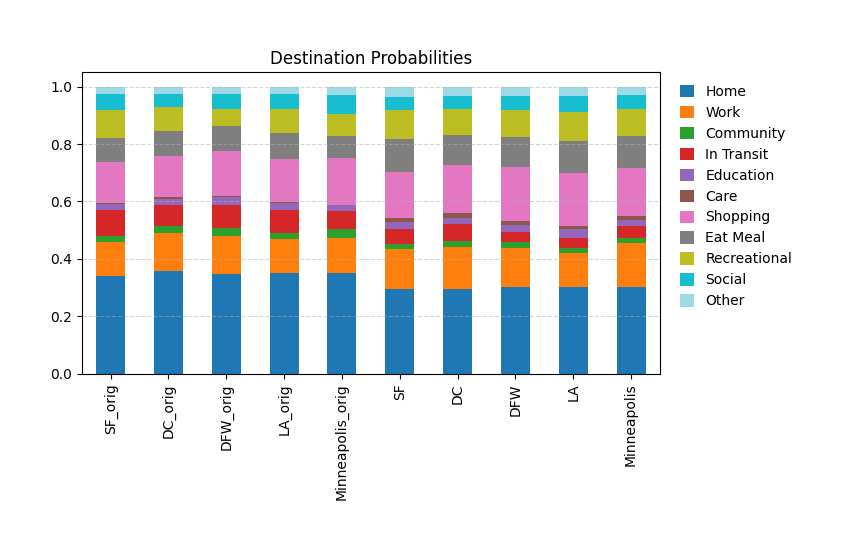

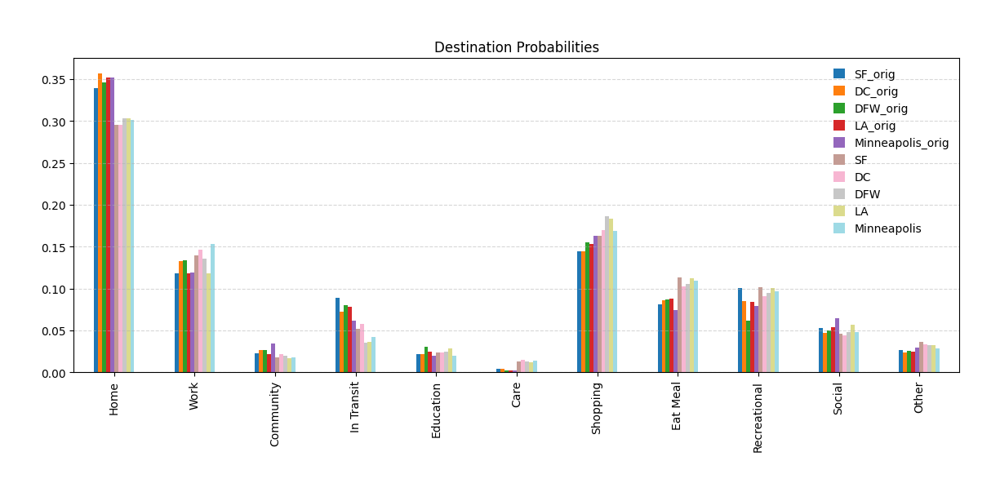

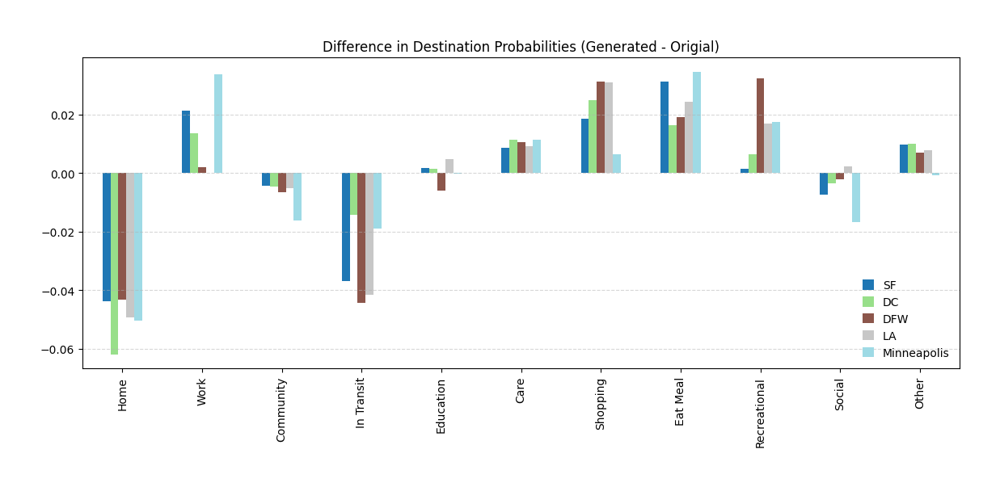

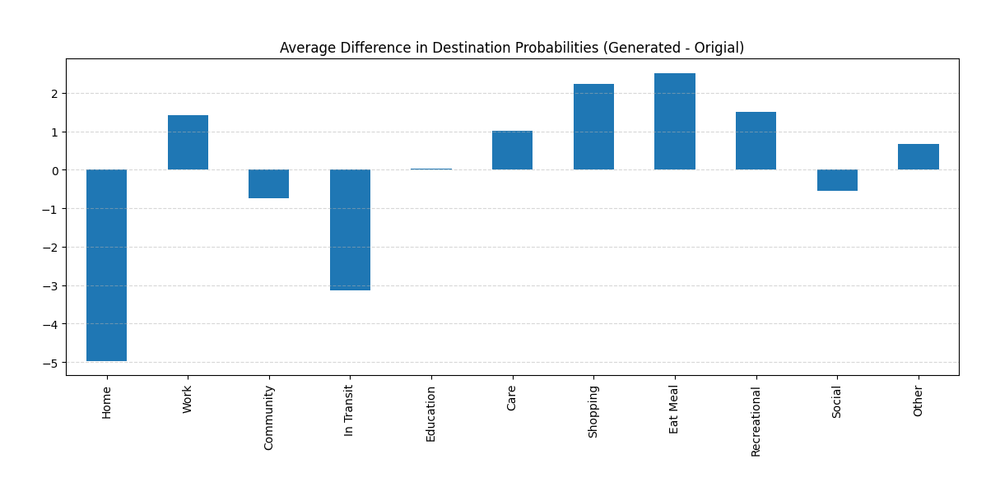

Home           -4.970714
Work            1.410298
Community      -0.735059
In Transit     -3.129001
Education       0.034240
Care            1.022340
Shopping        2.235468
Eat Meal        2.510892
Recreational    1.495090
Social         -0.547853
Other           0.674300
dtype: float64
1.7059322108480808
[0.70467959 1.41029794 2.37317952 3.12900054]
2.3731795187108147
Home         -4.970714
In Transit   -3.129001
Eat Meal      2.510892
dtype: float64


In [47]:
destination_probs_diff_ens = create_plots_for_destination_prob(res_1)

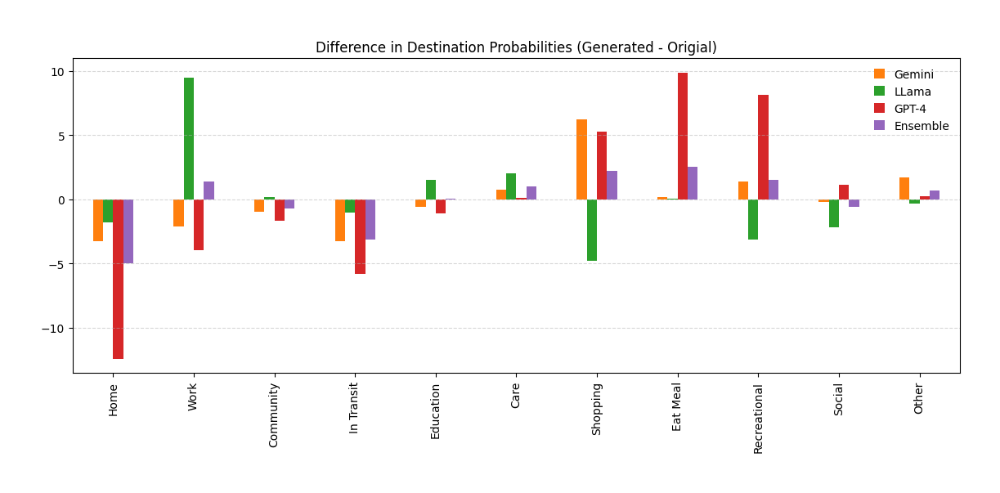

In [48]:
destination_probs_diffs = pd.concat([destination_probs_diff_gemini, destination_probs_diff_llama, destination_probs_diff_gpt4, destination_probs_diff_ens], axis=1)
destination_probs_diffs.rename(columns={0: 'Gemini', 1: 'LLama', 2: 'GPT-4', 3: 'Ensemble'}, inplace=True)
destination_probs_diffs.plot.bar(
    # kind='bar',
    title='Difference in Destination Probabilities (Generated - Origial)',
    figsize=(14, 5),
    color=[gemini_color, llama_color, gpt4_color, ens_color],
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

In [49]:
res_2 = get_transient_destination_probabilities(order=2, model='gemini')
res_2

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.425637,0.453091,0.440322,0.447252,0.444382,0.377101,0.358741,0.384978,0.380552,0.386016
Work,0.079738,0.088119,0.086621,0.077241,0.071090,0.061800,0.061374,0.038875,0.035834,0.055353
Community,0.017229,0.016879,0.020440,0.014242,0.026763,0.015406,0.017620,0.016796,0.012281,0.014567
In Transit,0.082536,0.063130,0.070451,0.070637,0.056036,0.046919,0.067115,0.024910,0.034993,0.034960
Education,0.006921,0.006357,0.008797,0.006317,0.004182,0.008578,0.010295,0.007360,0.009590,0.006555
Care,0.003534,0.003946,0.002174,0.002814,0.002230,0.007528,0.009701,0.009813,0.008412,0.011107
Shopping,0.141216,0.140947,0.155808,0.151439,0.156119,0.179797,0.204712,0.215324,0.212315,0.204843
Eat Meal,0.084745,0.090092,0.090338,0.089301,0.078617,0.097689,0.083548,0.096811,0.096063,0.096140
Recreational,0.083640,0.069268,0.055171,0.071096,0.068860,0.102941,0.096219,0.099264,0.102120,0.096140
Social,0.050434,0.043183,0.045900,0.048584,0.062448,0.053396,0.048505,0.061332,0.069482,0.058267


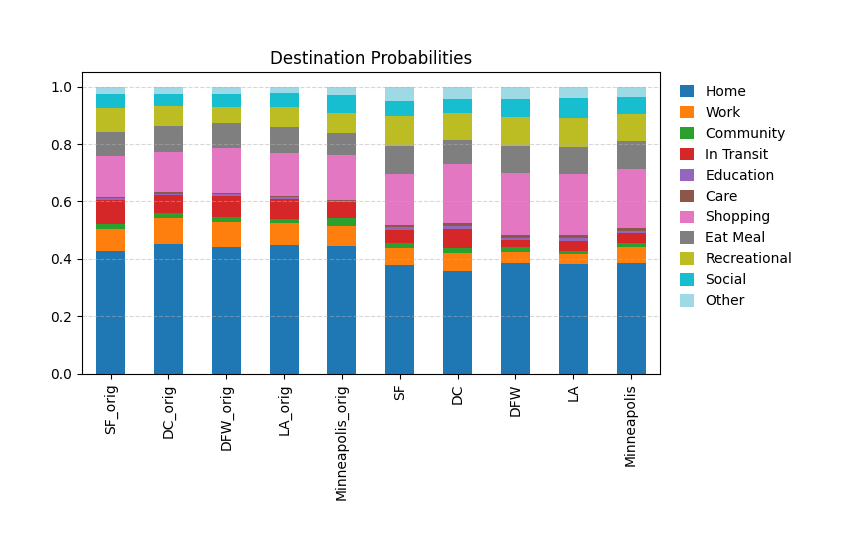

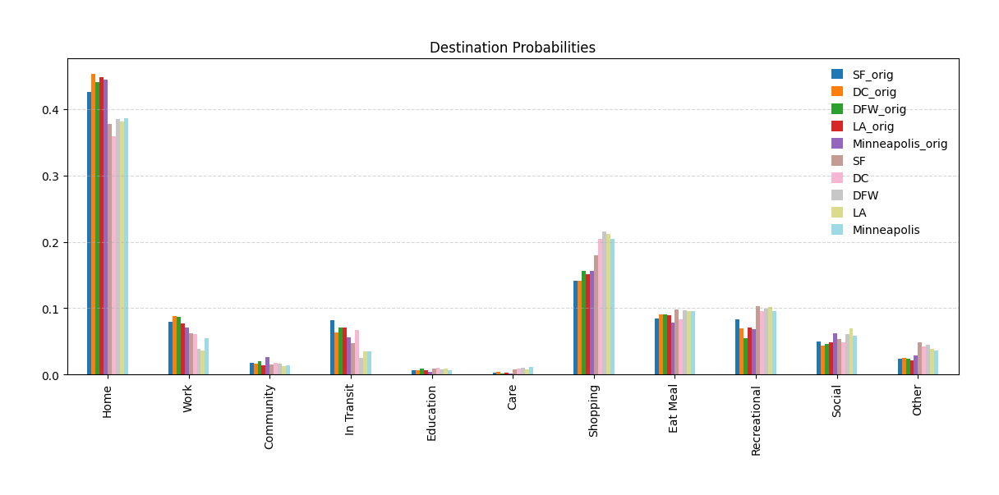

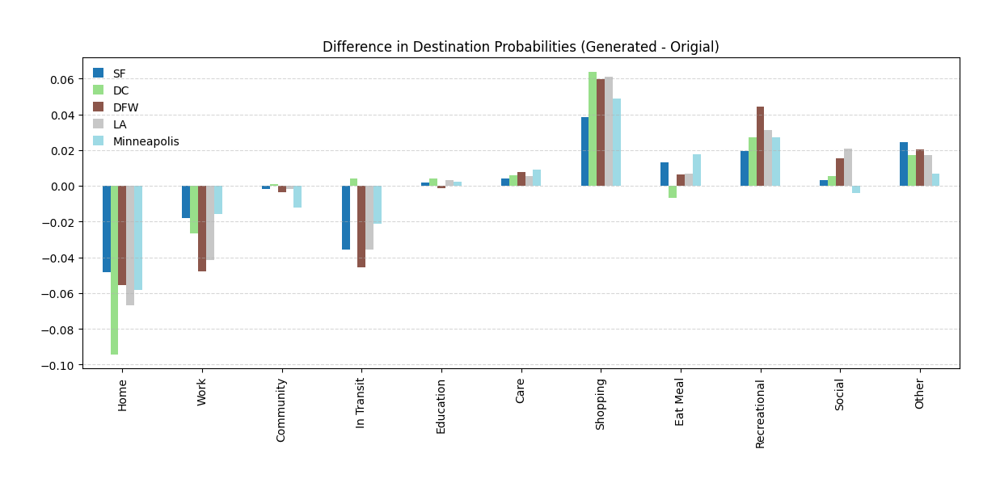

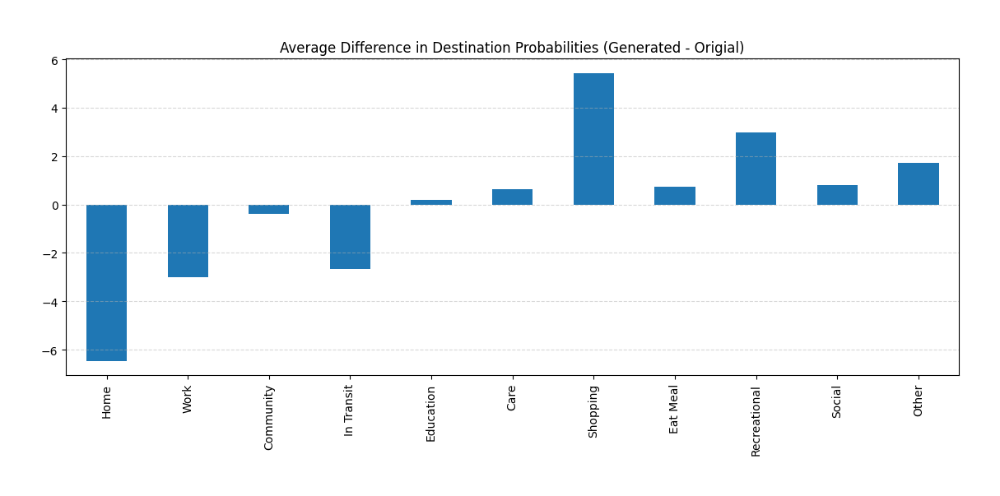

Home           -6.465923
Work           -2.991460
Community      -0.377649
In Transit     -2.677844
Education       0.196091
Care            0.637254
Shopping        5.429240
Eat Meal        0.743163
Recreational    2.972963
Social          0.808656
Other           1.725509
dtype: float64
2.2750683427870504
[0.69020889 1.72550859 2.98221137 5.42923961]
2.982211368790965
Home       -6.465923
Work       -2.991460
Shopping    5.429240
dtype: float64


In [50]:
destination_probs_diff_gemini_2 = create_plots_for_destination_prob(res_2)

In [51]:
res_2 = get_transient_destination_probabilities(order=2, model='llama')
res_2

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.425637,0.453091,0.440322,0.447252,0.444382,0.370992,0.397247,0.396231,0.389570,0.389440
Work,0.079738,0.088119,0.086621,0.077241,0.071090,0.150273,0.142145,0.153451,0.150212,0.149594
Community,0.017229,0.016879,0.020440,0.014242,0.026763,0.030971,0.028714,0.029613,0.026744,0.028430
In Transit,0.082536,0.063130,0.070451,0.070637,0.056036,0.074591,0.066920,0.059471,0.053711,0.063854
Education,0.006921,0.006357,0.008797,0.006317,0.004182,0.031407,0.026578,0.030348,0.036773,0.029558
Care,0.003534,0.003946,0.002174,0.002814,0.002230,0.021374,0.027527,0.022026,0.021395,0.022338
Shopping,0.141216,0.140947,0.155808,0.151439,0.156119,0.108615,0.104651,0.116006,0.102741,0.108303
Eat Meal,0.084745,0.090092,0.090338,0.089301,0.078617,0.095529,0.097532,0.090308,0.100735,0.091381
Recreational,0.083640,0.069268,0.055171,0.071096,0.068860,0.060851,0.051020,0.049192,0.060397,0.056859
Social,0.050434,0.043183,0.045900,0.048584,0.062448,0.027045,0.030138,0.027655,0.034321,0.038583


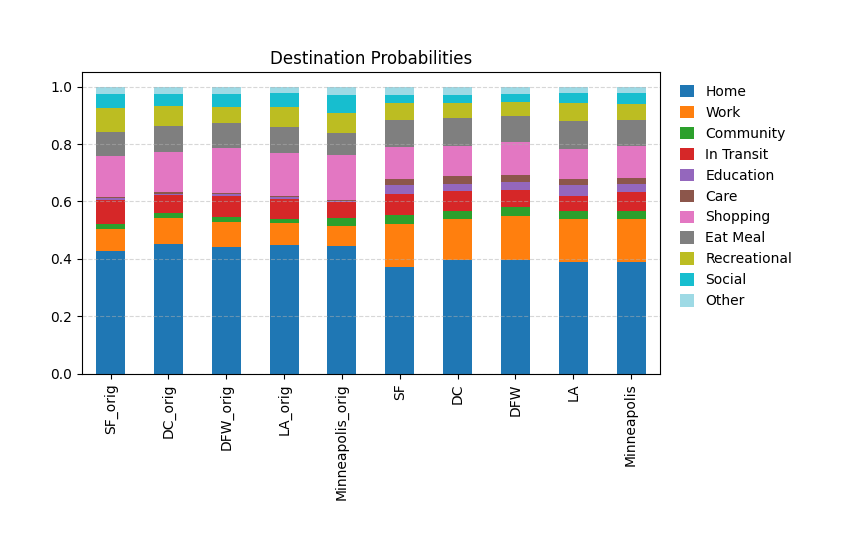

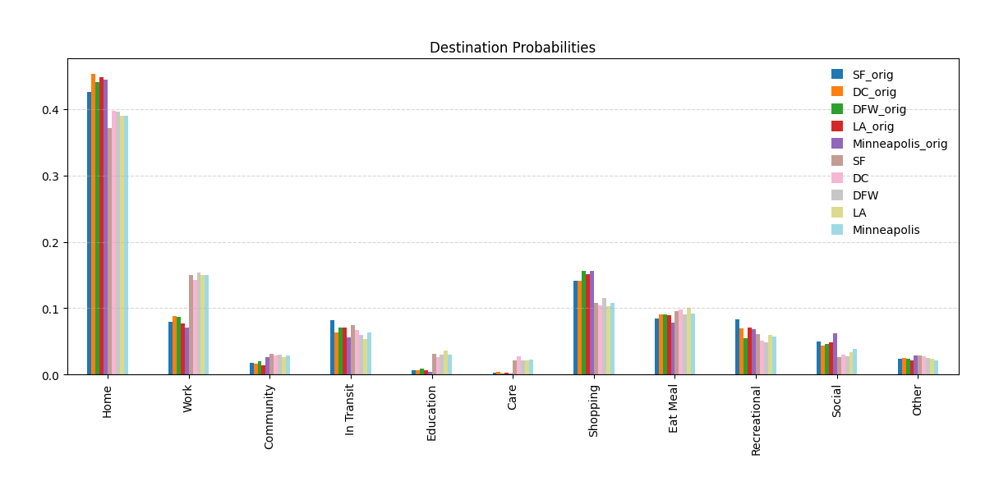

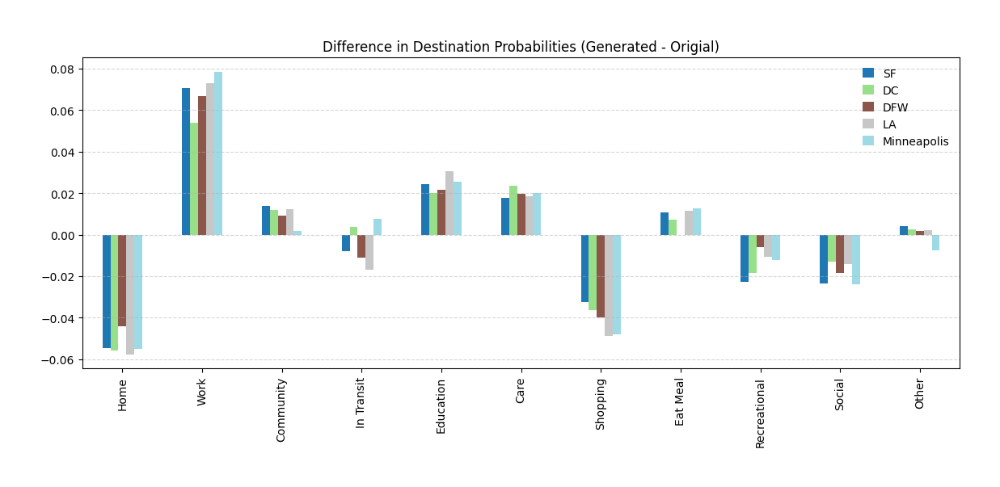

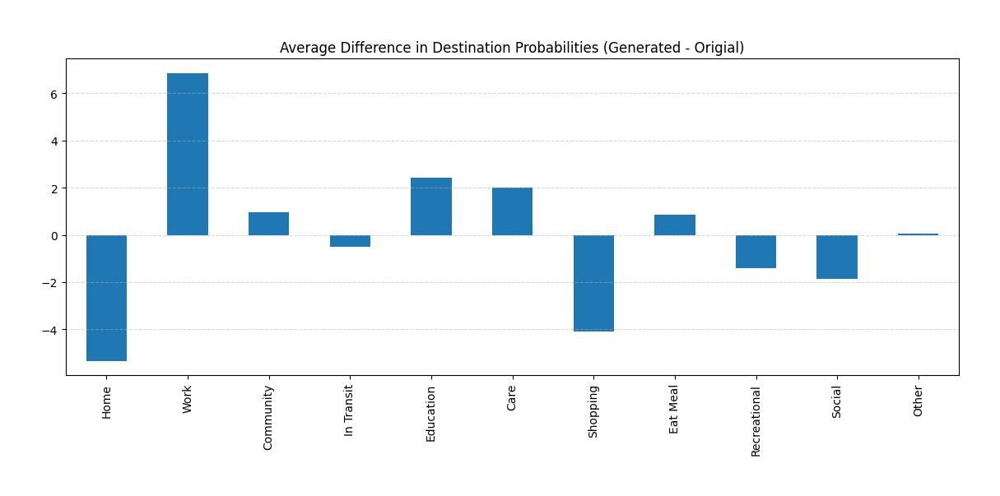

Home           -5.344060
Work            6.857292
Community       0.978376
In Transit     -0.484865
Education       2.441796
Care            1.999241
Shopping       -4.104246
Eat Meal        0.847862
Recreational   -1.394319
Social         -1.856148
Other           0.059072
dtype: float64
2.3970250413032077
[0.91311883 1.85614768 3.27302082 5.34406022]
3.273020816110911
Home       -5.344060
Work        6.857292
Shopping   -4.104246
dtype: float64


In [52]:
destination_probs_diff_llama_2 = create_plots_for_destination_prob(res_2)

In [53]:
res_2 = get_transient_destination_probabilities(order=2, model='gpt4')
res_2

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.425637,0.453091,0.440322,0.447252,0.444382,0.271449,0.266209,0.272669,0.273082,0.267318
Work,0.079738,0.088119,0.086621,0.077241,0.071090,0.091362,0.104738,0.089394,0.062350,0.119005
Community,0.017229,0.016879,0.020440,0.014242,0.026763,0.005564,0.008728,0.006729,0.006894,0.007105
In Transit,0.082536,0.063130,0.070451,0.070637,0.056036,0.013470,0.012157,0.014098,0.011091,0.015986
Education,0.006921,0.006357,0.008797,0.006317,0.004182,0.011420,0.013092,0.007369,0.017086,0.008585
Care,0.003534,0.003946,0.002174,0.002814,0.002230,0.003807,0.001870,0.001282,0.001499,0.002072
Shopping,0.141216,0.140947,0.155808,0.151439,0.156119,0.200293,0.202307,0.202179,0.207134,0.196862
Eat Meal,0.084745,0.090092,0.090338,0.089301,0.078617,0.112152,0.119701,0.132009,0.112110,0.119301
Recreational,0.083640,0.069268,0.055171,0.071096,0.068860,0.179795,0.163030,0.166613,0.178957,0.167851
Social,0.050434,0.043183,0.045900,0.048584,0.062448,0.078477,0.074813,0.078821,0.092326,0.064831


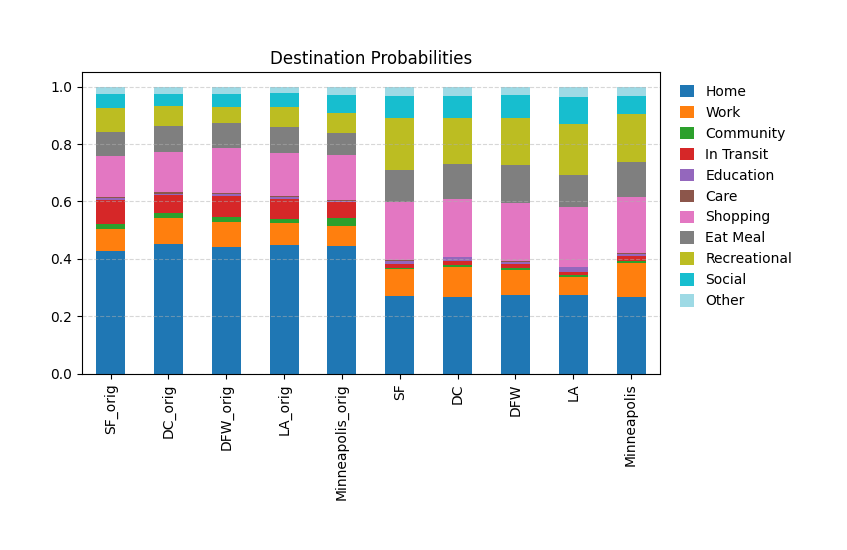

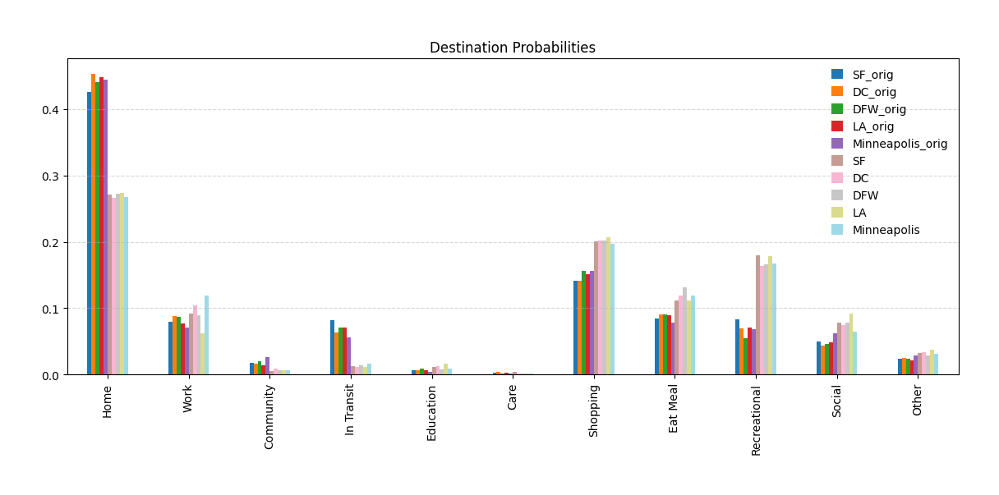

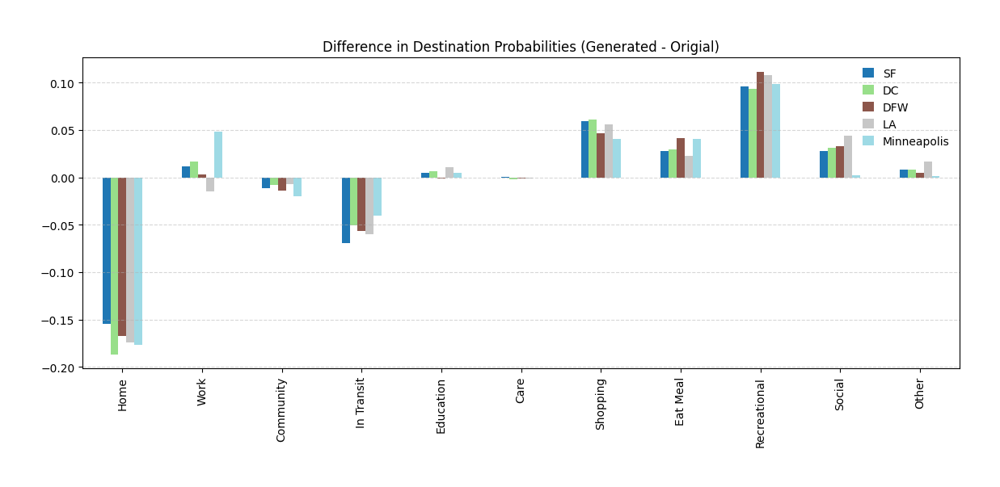

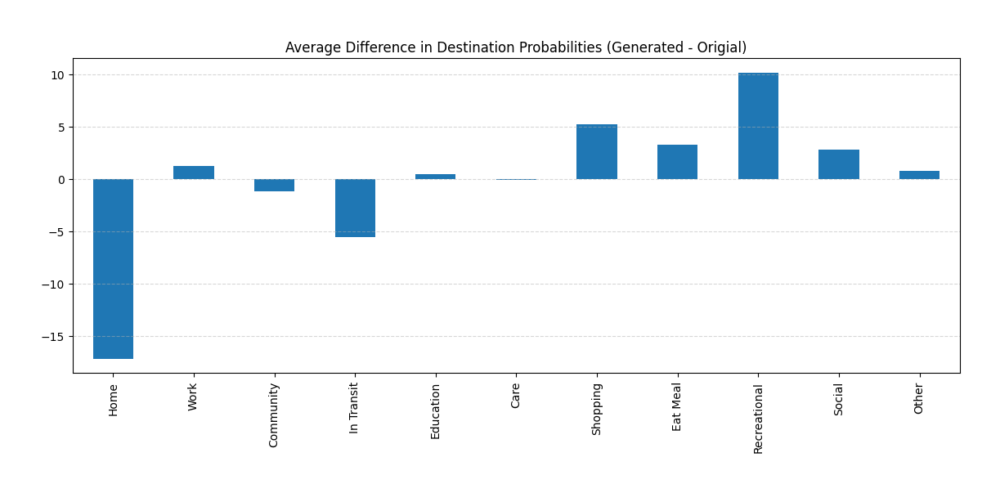

Home           -17.199131
Work             1.280800
Community       -1.210653
In Transit      -5.519758
Education        0.499599
Care            -0.083374
Shopping         5.264916
Eat Meal         3.243623
Recreational    10.164212
Social           2.774380
Other            0.785385
dtype: float64
4.36598469681628
[ 0.99801897  2.77438038  5.39233733 10.16421207]
5.392337333906596
Home           -17.199131
In Transit      -5.519758
Recreational    10.164212
dtype: float64


In [54]:
destination_probs_diff_gpt4_2 = create_plots_for_destination_prob(res_2)

In [55]:
res_2 = get_transient_destination_probabilities(order=2, model='ens')
res_2

,SF_orig,DC_orig,DFW_orig,LA_orig,Minneapolis_orig,SF,DC,DFW,LA,Minneapolis
Home,0.425637,0.453091,0.440322,0.447252,0.444382,0.348746,0.347952,0.360627,0.357449,0.357014
Work,0.079738,0.088119,0.086621,0.077241,0.071090,0.098746,0.099816,0.088917,0.079538,0.102917
Community,0.017229,0.016879,0.020440,0.014242,0.026763,0.018159,0.019081,0.018471,0.015690,0.017291
In Transit,0.082536,0.063130,0.070451,0.070637,0.056036,0.047841,0.052914,0.033504,0.035302,0.039768
Education,0.006921,0.006357,0.008797,0.006317,0.004182,0.016919,0.016516,0.014873,0.020266,0.014735
Care,0.003534,0.003946,0.002174,0.002814,0.002230,0.011231,0.013710,0.011674,0.010968,0.012555
Shopping,0.141216,0.140947,0.155808,0.151439,0.156119,0.161100,0.170288,0.179594,0.175347,0.170651
Eat Meal,0.084745,0.090092,0.090338,0.089301,0.078617,0.100569,0.097571,0.103470,0.101475,0.100436
Recreational,0.083640,0.069268,0.055171,0.071096,0.068860,0.108008,0.098132,0.099712,0.107140,0.101263
Social,0.050434,0.043183,0.045900,0.048584,0.062448,0.050831,0.049066,0.054694,0.063558,0.053375


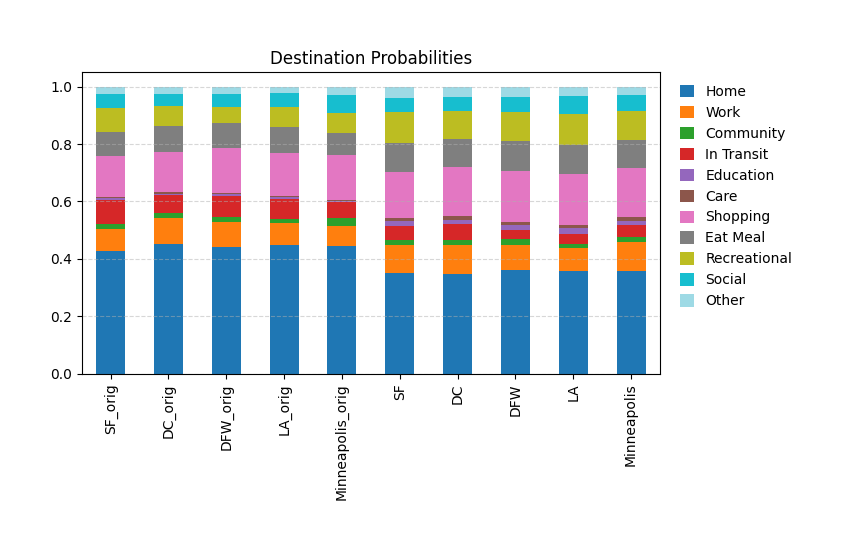

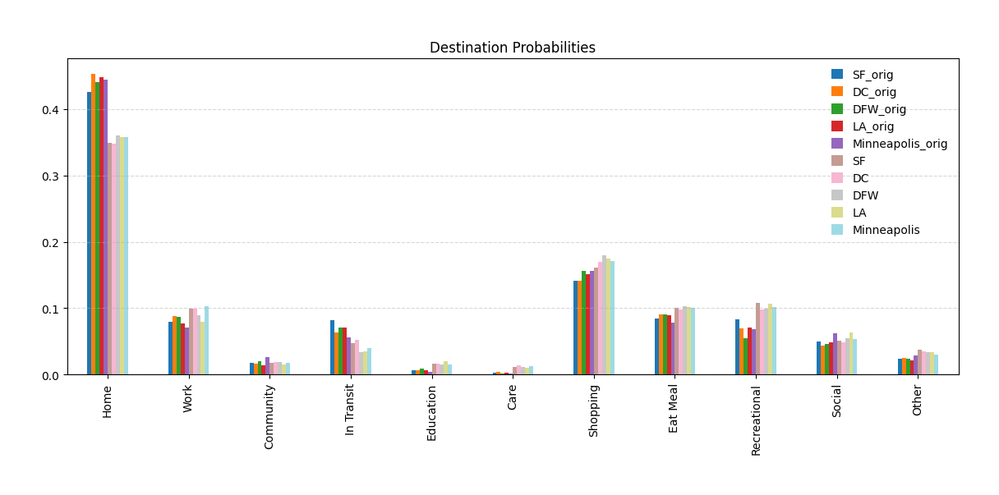

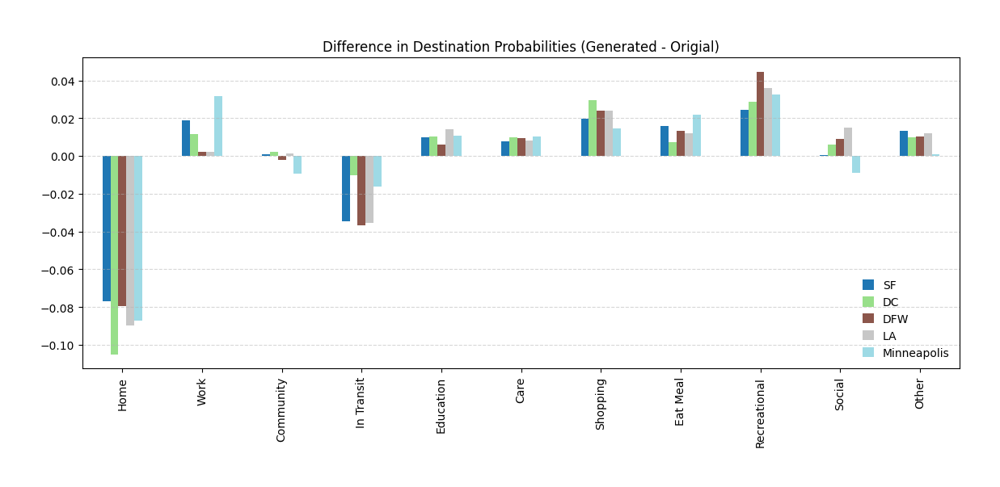

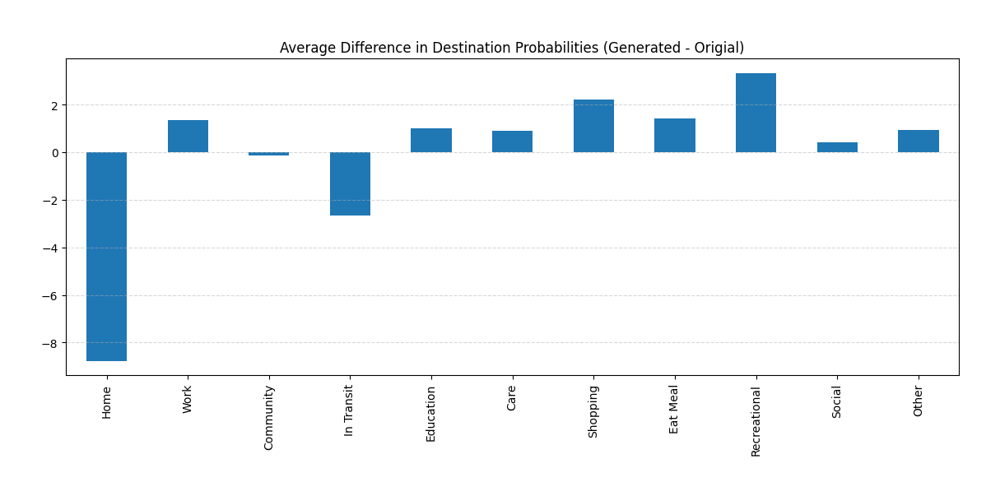

Home           -8.777939
Work            1.342475
Community      -0.137209
In Transit     -2.669204
Education       1.014706
Care            0.908788
Shopping        2.229008
Eat Meal        1.408559
Recreational    3.324394
Social          0.419496
Other           0.936927
dtype: float64
2.1062457647488455
[0.92285727 1.34247539 2.44910573 3.32439353]
2.4491057278402515
Home           -8.777939
In Transit     -2.669204
Recreational    3.324394
dtype: float64


In [56]:
destination_probs_diff_ens_2 = create_plots_for_destination_prob(res_2)

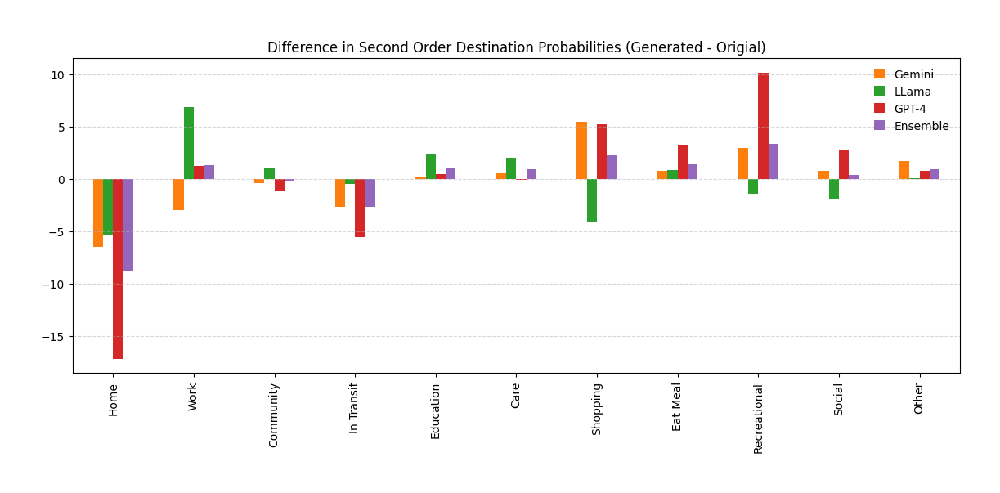

In [57]:
destination_probs_diffs = pd.concat(
    [
        destination_probs_diff_gemini_2,
        destination_probs_diff_llama_2,
        destination_probs_diff_gpt4_2,
        destination_probs_diff_ens_2
    ],
    axis=1
)
destination_probs_diffs.rename(columns={0: 'Gemini', 1: 'LLama', 2: 'GPT-4', 3: "Ensemble"}, inplace=True)
destination_probs_diffs.plot.bar(
    # kind='bar',
    title='Difference in Second Order Destination Probabilities (Generated - Origial)',
    figsize=(14, 5),
    color=[gemini_color, llama_color, gpt4_color, ens_color],
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

### Clustering

Kmeans
[1 1 0 1 1]
Agglomerative
[1 1 0 1 0]


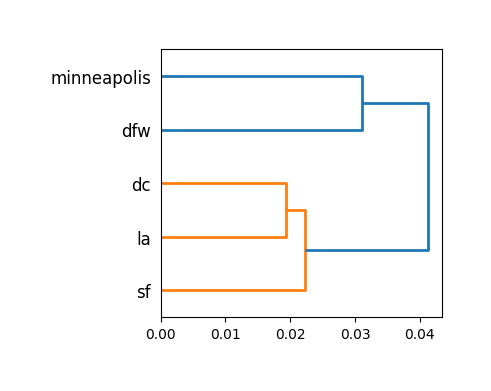

In [58]:
original_vals = {
    'sf': t_orig_prob_1_sf,
    'dc': t_orig_prob_1_dc,
    'dfw': t_orig_prob_1_dfw,
    'la': t_orig_prob_1_la,
    'minneapolis': t_orig_prob_1_minneapolis,
}
for k,v in original_vals.items():
    original_vals[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(original_vals.values()), list(original_vals.keys()))
X = list(original_vals.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(original_vals.values())
clusturing = AgglomerativeClustering(linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[0 1 0 0 1]
Agglomerative
[0 0 1 1 0]


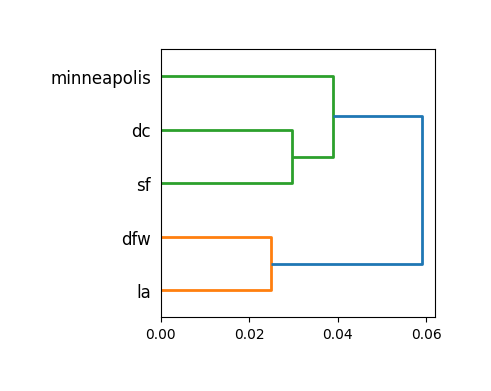

In [59]:
generated_vals_gemini = {
    'sf': t_prob_1_sf_gemini,
    'dc': t_prob_1_dc_gemini,
    'dfw': t_prob_1_dfw_gemini,
    'la': t_prob_1_la_gemini,
    'minneapolis': t_prob_1_minneapolis_gemini,
}
for k,v in generated_vals_gemini.items():
    generated_vals_gemini[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_gemini.values()), list(generated_vals_gemini.keys()))
X = list(generated_vals_gemini.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_gemini.values())
clusturing = AgglomerativeClustering(linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 1 0 1 1]
Agglomerative
[0 0 1 0 0]


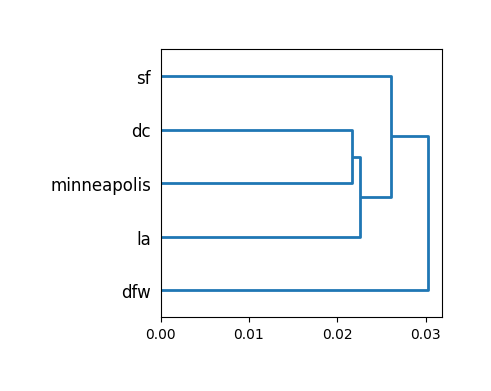

In [61]:
generated_vals_llama = {
    'sf': t_prob_1_sf_llama,
    'dc': t_prob_1_dc_llama,
    'dfw': t_prob_1_dfw_llama,
    'la': t_prob_1_la_llama,
    'minneapolis': t_prob_1_minneapolis_llama,
}
for k,v in generated_vals_llama.items():
    generated_vals_llama[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_llama.values()), list(generated_vals_llama.keys()))
X = list(generated_vals_llama.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_llama.values())
clusturing = AgglomerativeClustering(linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 0 0 1 0]
Agglomerative
[1 0 0 1 0]


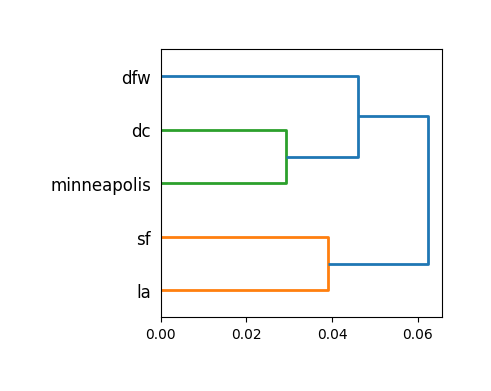

In [62]:
generated_vals_gpt4 = {
    'sf': t_prob_1_sf_gpt4,
    'dc': t_prob_1_dc_gpt4,
    'dfw': t_prob_1_dfw_gpt4,
    'la': t_prob_1_la_gpt4,
    'minneapolis': t_prob_1_minneapolis_gpt4,
}
for k,v in generated_vals_gpt4.items():
    generated_vals_gpt4[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_gpt4.values()), list(generated_vals_gpt4.keys()))
X = list(generated_vals_gpt4.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_gpt4.values())
clusturing = AgglomerativeClustering(linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 0 0 1 0]
Agglomerative
[1 1 0 0 1]


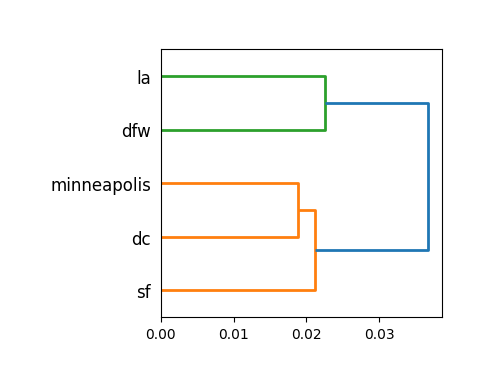

In [63]:
generated_vals_ens = {
    'sf': t_prob_1_sf_ens,
    'dc': t_prob_1_dc_ens,
    'dfw': t_prob_1_dfw_ens,
    'la': t_prob_1_la_ens,
    'minneapolis': t_prob_1_minneapolis_ens,
}
for k,v in generated_vals_ens.items():
    generated_vals_ens[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_ens.values()), list(generated_vals_ens.keys()))
X = list(generated_vals_ens.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_ens.values())
clusturing = AgglomerativeClustering(linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

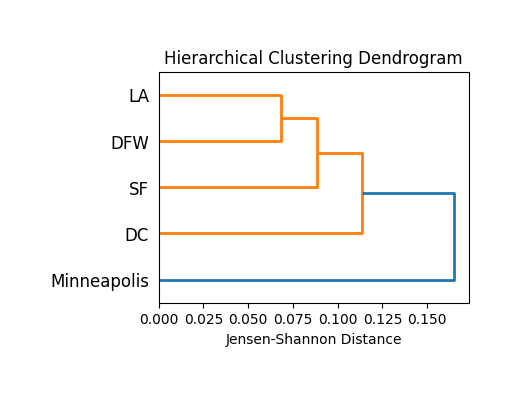

Cluster assignments: [1 1 1 1 1]


In [64]:
matrices = [
    t_orig_prob_1_sf.to_numpy(),
    t_orig_prob_1_dc.to_numpy(),
    t_orig_prob_1_dfw.to_numpy(),
    t_orig_prob_1_la.to_numpy(),
    t_orig_prob_1_minneapolis.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

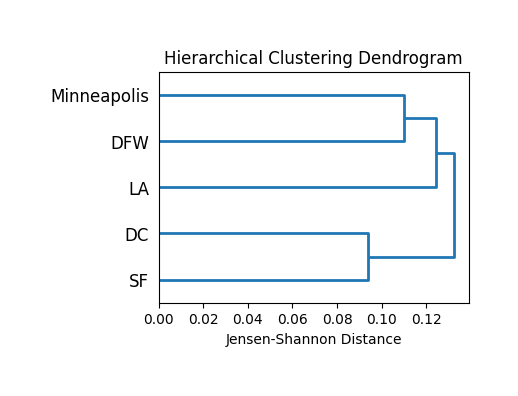

Cluster assignments: [1 1 1 1 1]


In [65]:
matrices = [
    t_prob_1_sf_gemini.to_numpy(),
    t_prob_1_dc_gemini.to_numpy(),
    t_prob_1_dfw_gemini.to_numpy(),
    t_prob_1_la_gemini.to_numpy(),
    t_prob_1_minneapolis_gemini.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

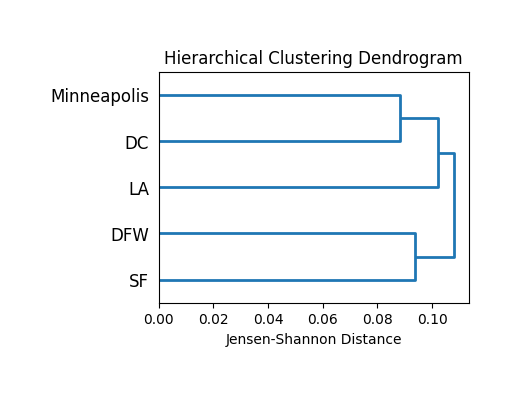

Cluster assignments: [1 1 1 1 1]


In [66]:
matrices = [
    t_prob_1_sf_llama.to_numpy(),
    t_prob_1_dc_llama.to_numpy(),
    t_prob_1_dfw_llama.to_numpy(),
    t_prob_1_la_llama.to_numpy(),
    t_prob_1_minneapolis_llama.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

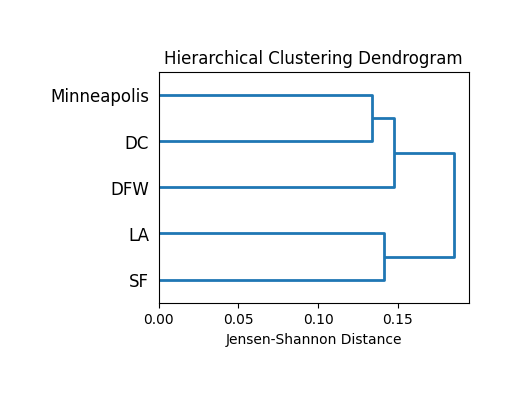

Cluster assignments: [1 1 1 1 1]


In [67]:
matrices = [
    t_prob_1_sf_gpt4.to_numpy(),
    t_prob_1_dc_gpt4.to_numpy(),
    t_prob_1_dfw_gpt4.to_numpy(),
    t_prob_1_la_gpt4.to_numpy(),
    t_prob_1_minneapolis_gpt4.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

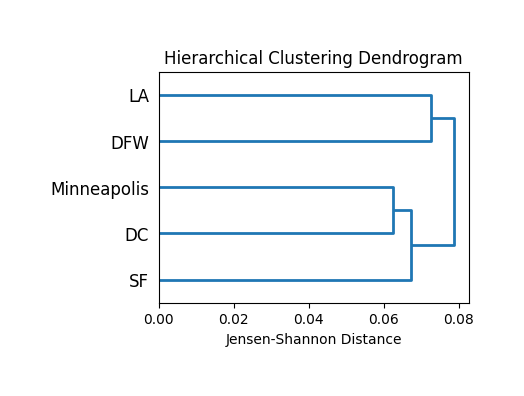

Cluster assignments: [1 1 1 1 1]


In [68]:
matrices = [
    t_prob_1_sf_ens.to_numpy(),
    t_prob_1_dc_ens.to_numpy(),
    t_prob_1_dfw_ens.to_numpy(),
    t_prob_1_la_ens.to_numpy(),
    t_prob_1_minneapolis_ens.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

## Activity Chains

In [69]:
def activity_chains_analysis(a,b,c,d,e ):
    a = a['loc_type'].apply(tuple).value_counts()
    b = b['loc_type_new'].apply(tuple).value_counts()
    c = c['loc_type_new'].apply(tuple).value_counts()
    d = d['loc_type_new'].apply(tuple).value_counts()
    e = e['loc_type_new'].apply(tuple).value_counts()
    a = a / a.sum() * 100
    b = b / b.sum() * 100
    c = c / c.sum() * 100
    d = d / d.sum() * 100
    e = e / e.sum() * 100
    print(f'Gemini: Original chains not present in generated % (mean): {a[a.index.difference(b.index)].values.mean()}')
    print(f'Gemini: Original chains not present in generated % (max): {a[a.index.difference(b.index)].values.max()}')
    print(f'Gemini: Original chains not present in generated % (min): {a[a.index.difference(b.index)].values.min()}')
    print(f'Llama: Original chains not present in generated % (mean): {a[a.index.difference(c.index)].values.mean()}')
    print(f'Llama: Original chains not present in generated % (max): {a[a.index.difference(c.index)].values.max()}')
    print(f'Llama: Original chains not present in generated % (min): {a[a.index.difference(c.index)].values.min()}')
    print(f'Gpt4: Original chains not present in generated % (mean): {a[a.index.difference(d.index)].values.mean()}')
    print(f'Gpt4: Original chains not present in generated % (max): {a[a.index.difference(d.index)].values.max()}')
    print(f'Gpt4: Original chains not present in generated % (min): {a[a.index.difference(d.index)].values.min()}')
    print(f'Ensemble: Original chains not present in generated % (mean): {a[a.index.difference(e.index)].values.mean()}')
    print(f'Ensemble: Original chains not present in generated % (max): {a[a.index.difference(e.index)].values.max()}')
    print(f'Ensemble: Original chains not present in generated % (min): {a[a.index.difference(e.index)].values.min()}')

    print('Gemini')
    overlap = 0
    for value in a.index.intersection(b.index):
        overlap += a[value]
    
    print(f"The values in original data present in generated data: {overlap}")
    overlap = 0
    for value in a.index.intersection(b.index):
        overlap += min(a[value], b[value])

    print(f"Exact overlap: {overlap}")

    print('LLama')
    overlap = 0
    for value in a.index.intersection(c.index):
        overlap += a[value]
    
    print(f"The values in original data present in generated data: {overlap}")
    overlap = 0
    for value in a.index.intersection(c.index):
        overlap += min(a[value], c[value])

    print(f"Exact overlap: {overlap}")

    print('Gpt4')
    overlap = 0
    for value in a.index.intersection(d.index):
        overlap += a[value]
    
    print(f"The values in original data present in generated data: {overlap}")
    overlap = 0
    for value in a.index.intersection(d.index):
        overlap += min(a[value], d[value])

    print(f"Exact overlap: {overlap}")

    print('Ensemble')
    overlap = 0
    for value in a.index.intersection(e.index):
        overlap += a[value]
    
    print(f"The values in original data present in generated data: {overlap}")
    overlap = 0
    for value in a.index.intersection(e.index):
        overlap += min(a[value], e[value])

    print(f"Exact overlap: {overlap}")

    return (
        a[a.index.difference(b.index)].values,
        a[a.index.difference(c.index)].values,
        a[a.index.difference(d.index)].values,
        a[a.index.difference(e.index)].values,
        b[b.index.difference(a.index)].values,
        c[c.index.difference(a.index)].values,
        d[d.index.difference(a.index)].values,
        e[e.index.difference(a.index)].values,
    )


In [70]:
a_sf,b_sf,c_sf,d_sf, e_sf, f_sf, g_sf, h_sf = activity_chains_analysis(data_t_sf, t_sf_gemini, t_sf_llama, t_sf_gpt4, t_sf_ens)

Gemini: Original chains not present in generated % (mean): 0.034598559891478115
Gemini: Original chains not present in generated % (max): 1.216786689843556
Gemini: Original chains not present in generated % (min): 0.024832381425378695
Llama: Original chains not present in generated % (mean): 0.03430900049244824
Llama: Original chains not present in generated % (max): 0.9932952570151479
Llama: Original chains not present in generated % (min): 0.024832381425378695
Gpt4: Original chains not present in generated % (mean): 0.0521957046075596
Gpt4: Original chains not present in generated % (max): 9.187981127390117
Gpt4: Original chains not present in generated % (min): 0.024832381425378695
Ensemble: Original chains not present in generated % (mean): 0.031583077038908405
Ensemble: Original chains not present in generated % (max): 0.9932952570151479
Ensemble: Original chains not present in generated % (min): 0.024832381425378695
Gemini
The values in original data present in generated data: 39

In [71]:
a_dc,b_dc,c_dc,d_dc, e_dc, f_dc, g_dc, h_dc = activity_chains_analysis(data_t_dc, t_dc_gemini, t_dc_llama, t_dc_gpt4, t_dc_ens)

Gemini: Original chains not present in generated % (mean): 0.0895947916137546
Gemini: Original chains not present in generated % (max): 1.250868658790827
Gemini: Original chains not present in generated % (min): 0.06949270326615706
Llama: Original chains not present in generated % (mean): 0.08790064504042124
Llama: Original chains not present in generated % (max): 0.6949270326615705
Llama: Original chains not present in generated % (min): 0.06949270326615706
Gpt4: Original chains not present in generated % (mean): 0.1325187244228245
Gpt4: Original chains not present in generated % (max): 10.006949270326617
Gpt4: Original chains not present in generated % (min): 0.06949270326615706
Ensemble: Original chains not present in generated % (mean): 0.08037710257290456
Ensemble: Original chains not present in generated % (max): 0.4864489228630994
Ensemble: Original chains not present in generated % (min): 0.06949270326615706
Gemini
The values in original data present in generated data: 42.39054

In [72]:
a_dfw,b_dfw,c_dfw,d_dfw, e_dfw, f_dfw, g_dfw, h_dfw = activity_chains_analysis(data_t_dfw, t_dfw_gemini, t_dfw_llama, t_dfw_gpt4, t_dfw_ens)

Gemini: Original chains not present in generated % (mean): 0.01127812842018552
Gemini: Original chains not present in generated % (max): 1.276835450960756
Gemini: Original chains not present in generated % (min): 0.006258997308631157
Llama: Original chains not present in generated % (mean): 0.010685660750579239
Llama: Original chains not present in generated % (max): 0.9638855855291983
Llama: Original chains not present in generated % (min): 0.006258997308631157
Gpt4: Original chains not present in generated % (mean): 0.01785831405204834
Gpt4: Original chains not present in generated % (max): 10.853101333166427
Gpt4: Original chains not present in generated % (min): 0.006258997308631157
Ensemble: Original chains not present in generated % (mean): 0.009589484253196317
Ensemble: Original chains not present in generated % (max): 0.6947487012580584
Ensemble: Original chains not present in generated % (min): 0.006258997308631157
Gemini
The values in original data present in generated data: 

In [73]:
a_la,b_la,c_la,d_la, e_la, f_la, g_la, h_la= activity_chains_analysis(data_t_la, t_la_gemini, t_la_llama, t_la_gpt4, t_la_ens)

Gemini: Original chains not present in generated % (mean): 0.02566467327191768
Gemini: Original chains not present in generated % (max): 0.46982291290205996
Gemini: Original chains not present in generated % (min): 0.018070112034694615
Llama: Original chains not present in generated % (mean): 0.025496185473610208
Llama: Original chains not present in generated % (max): 0.43368268883267075
Llama: Original chains not present in generated % (min): 0.018070112034694615
Gpt4: Original chains not present in generated % (mean): 0.043777525098765285
Gpt4: Original chains not present in generated % (max): 9.360318033971812
Gpt4: Original chains not present in generated % (min): 0.018070112034694615
Ensemble: Original chains not present in generated % (mean): 0.023824181490352456
Ensemble: Original chains not present in generated % (max): 0.32526201662450305
Ensemble: Original chains not present in generated % (min): 0.018070112034694615
Gemini
The values in original data present in generated da

In [74]:
a_minneapolis,b_minneapolis,c_minneapolis,d_minneapolis, e_minneapolis, f_minneapolis, g_minneapolis, h_minneapolis = activity_chains_analysis(data_t_minneapolis, t_minneapolis_gemini, t_minneapolis_llama, t_minneapolis_gpt4, t_minneapolis_ens)

Gemini: Original chains not present in generated % (mean): 0.11470673709762891
Gemini: Original chains not present in generated % (max): 2.092414995640802
Gemini: Original chains not present in generated % (min): 0.08718395815170009
Llama: Original chains not present in generated % (mean): 0.1033164228490619
Llama: Original chains not present in generated % (max): 0.5231037489102005
Llama: Original chains not present in generated % (min): 0.08718395815170009
Gpt4: Original chains not present in generated % (mean): 0.16413714570396598
Gpt4: Original chains not present in generated % (max): 11.595466434176112
Gpt4: Original chains not present in generated % (min): 0.08718395815170009
Ensemble: Original chains not present in generated % (mean): 0.10031865927062432
Ensemble: Original chains not present in generated % (max): 0.5231037489102005
Ensemble: Original chains not present in generated % (min): 0.08718395815170009
Gemini
The values in original data present in generated data: 41.4995

In [75]:
x = t_sf_ens['loc_type_new'].apply(tuple).value_counts().sort_values(ascending=False)
x = x / x.sum() * 100
x

loc_type_new
(1, 2, 1)                      4.831671
(1, 8, 2, 8, 2, 9, 7, 1)       1.558603
(1, 1)                         1.496259
(1, 2, 7, 1)                   1.278055
(1, 2, 1, 7, 1)                1.059850
                                 ...   
(1, 8, 7, 7, 9, 1, 9, 1)       0.031172
(1, 8, 9, 8, 7, 1)             0.031172
(1, 7, 7, 8, 2, 9, 7, 1)       0.031172
(1, 8, 9, 11, 7, 1, 8, 1)      0.031172
(1, 8, 2, 8, 2, 9, 7, 7, 1)    0.031172
Name: count, Length: 2068, dtype: float64

In [76]:
def get_count_rep(x):
    if x == 1:
        return '1'
    elif x < 10:
        return '< 10'
    # elif x < 50:
    #     return '< 50'
    # elif x < 100:
    #     return '< 100'

def get_chains_df(a,b,c,d, e, city='SF'):
    a = a['loc_type'].apply(tuple).value_counts().sort_values(ascending=False)
    a_2 = a.copy()
    a = a / a.sum() * 100
    a = a.reset_index()
    a_2 = a_2.reset_index()
    a_2.rename(columns={'count': 'count_num'}, inplace=True)
    a['cumsum_orig'] = a['count'].cumsum()
    a_3  = pd.merge(a.assign(loc_type=a.loc_type.astype(str)), a_2.assign(loc_type=a_2.loc_type.astype(str)), on='loc_type', how='left')
    a_3['count_rep'] = a_3['count_num'].apply(lambda x: get_count_rep(x))
    a = a_3

    b = b['loc_type_new'].apply(tuple).value_counts().sort_values(ascending=False)
    b = b / b.sum() * 100
    b = b.reset_index()
    b.rename(columns={'loc_type_new': 'loc_type','count': 'count_gemini'}, inplace=True)

    c = c['loc_type_new'].apply(tuple).value_counts().sort_values(ascending=False)
    c = c / c.sum() * 100
    c = c.reset_index()
    c.rename(columns={'loc_type_new': 'loc_type','count': 'count_llama'}, inplace=True)

    d = d['loc_type_new'].apply(tuple).value_counts().sort_values(ascending=False)
    d = d / d.sum() * 100
    d = d.reset_index()
    d.rename(columns={'loc_type_new': 'loc_type','count': 'count_gpt4'}, inplace=True)

    e = e['loc_type_new'].apply(tuple).value_counts().sort_values(ascending=False)
    e = e / e.sum() * 100
    e = e.reset_index()
    e.rename(columns={'loc_type_new': 'loc_type','count': 'count_ens'}, inplace=True)

    f = pd.merge(a.assign(loc_type=a.loc_type.astype(str)), b.assign(loc_type=b.loc_type.astype(str)), on='loc_type', how='left')
    f = pd.merge(f.assign(loc_type=f.loc_type.astype(str)), c.assign(loc_type=c.loc_type.astype(str)), on='loc_type', how='left')
    f = pd.merge(f.assign(loc_type=f.loc_type.astype(str)), d.assign(loc_type=d.loc_type.astype(str)), on='loc_type', how='left')
    f = pd.merge(f.assign(loc_type=f.loc_type.astype(str)), e.assign(loc_type=e.loc_type.astype(str)), on='loc_type', how='left')
    f['cumsum_llama'] = f['count_llama'].cumsum()
    f['cumsum_gemini'] = f['count_gemini'].cumsum()
    f['cumsum_gpt4'] = f['count_gpt4'].cumsum()
    f['cumsum_ens'] = f['count_ens'].cumsum()

    first_occurrences = {}
    for rep_value in f['count_rep'].unique():
        if rep_value == None:
            continue
        first_occurrences[rep_value] = f.index[f['count_rep'] == rep_value][0]
    
    for k, idx in first_occurrences.items():
        if k == '1':
            plt.axvline(x=idx, color=one_color_line, linestyle='dotted', label=f'First {k} count occurrence')
        elif k == '< 10':
            plt.axvline(x=idx, color=ten_color_line, linestyle='--', label=f'First {k} count occurrence')
        # plt.text(idx, f['cumsum_orig'].iloc[idx], k, color='red', fontsize=10, ha='right')



    plt.scatter(f.index, f['cumsum_orig'], label='Actual', color=actual_color) 
    plt.scatter(f.index, f['cumsum_gemini'], label='Gemini', color=gemini_color) 
    plt.scatter(f.index, f['cumsum_llama'], label='Llama', color=llama_color) 
    plt.scatter(f.index, f['cumsum_gpt4'], label='GPT-4', color=gpt4_color) 
    plt.scatter(f.index, f['cumsum_ens'], label='Ensemble', color=ens_color) 
    plt.tight_layout()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # plt.legend(loc='best')
    plt.title(f'{city} Cumulative sum of chains')
    plt.show()
    return f

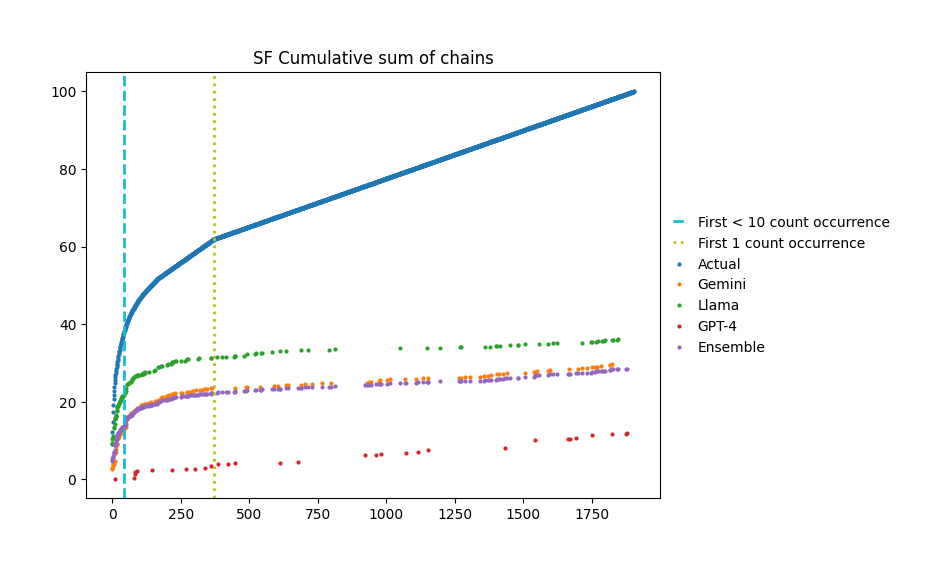

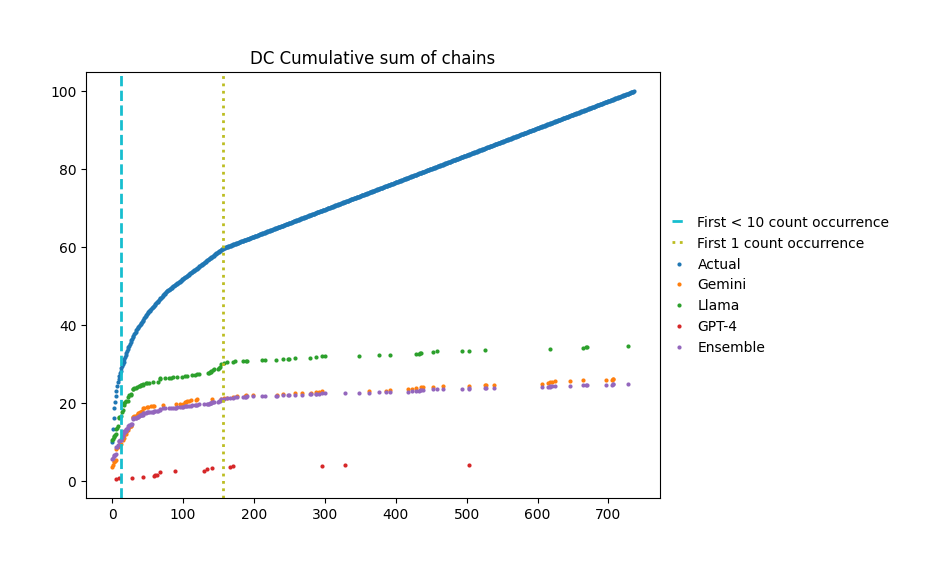

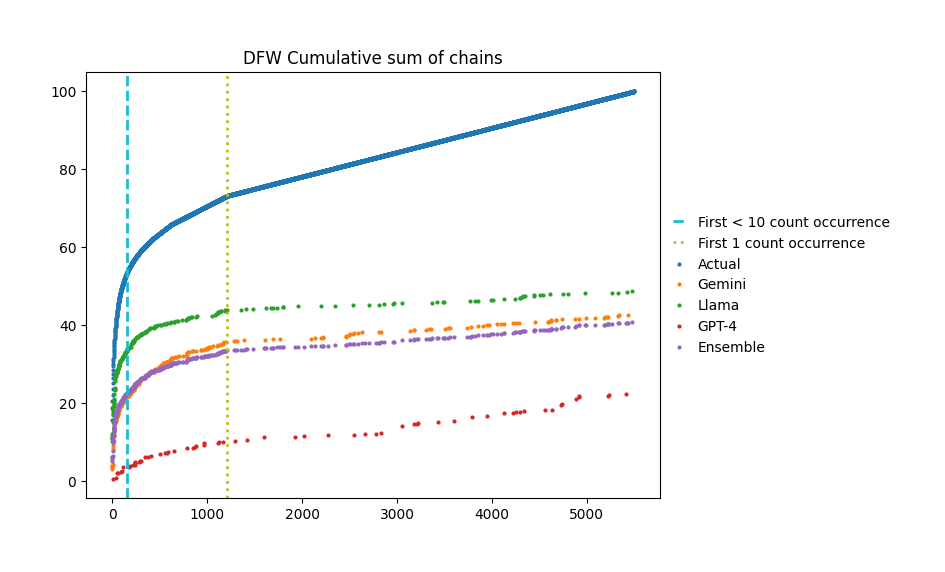

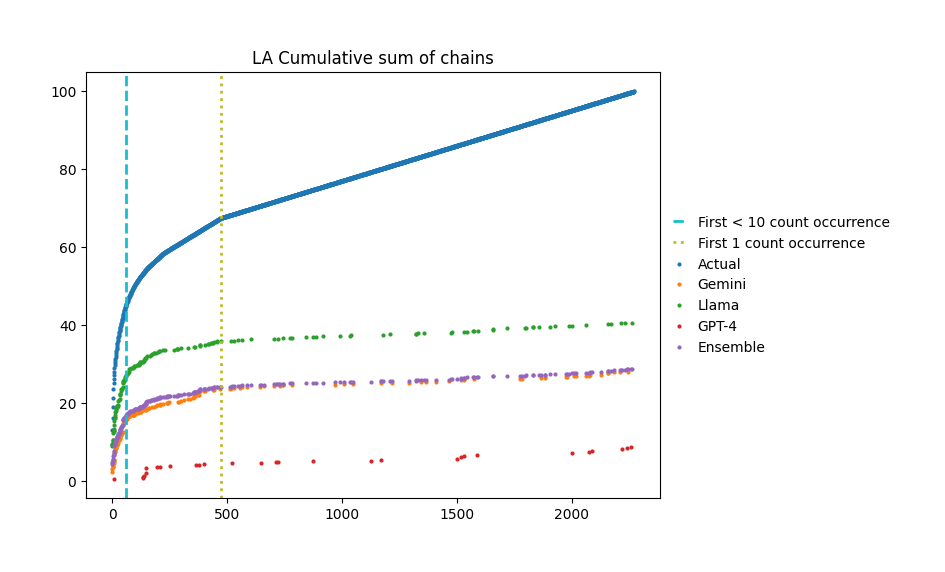

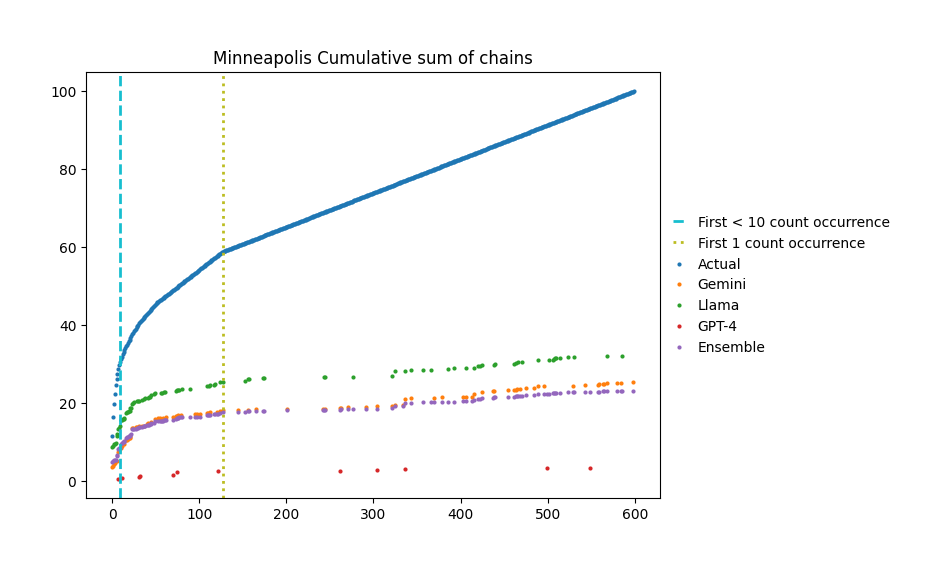

In [77]:
chains_sf = get_chains_df(data_t_sf, t_sf_gemini, t_sf_llama, t_sf_gpt4, t_sf_ens, city='SF')
chains_dc = get_chains_df(data_t_dc, t_dc_gemini, t_dc_llama, t_dc_gpt4, t_dc_ens, city='DC')
chains_dfw = get_chains_df(data_t_dfw, t_dfw_gemini, t_dfw_llama, t_dfw_gpt4, t_dfw_ens, city='DFW')
chains_la = get_chains_df(data_t_la, t_la_gemini, t_la_llama, t_la_gpt4, t_la_ens, city='LA')
chains_minneapolis = get_chains_df(data_t_minneapolis, t_minneapolis_gemini, t_minneapolis_llama, t_minneapolis_gpt4, t_minneapolis_ens, city='Minneapolis')

In [78]:
print(chains_sf[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr()['count'])
print(chains_sf[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr(method='spearman')['count'])

count           1.000000
count_gemini    0.650618
count_llama     0.886147
count_gpt4     -0.084125
Name: count, dtype: float64
count           1.000000
count_gemini    0.422750
count_llama     0.618612
count_gpt4     -0.055187
Name: count, dtype: float64


In [79]:
print(chains_dc[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr()['count'])
print(chains_dc[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr(method='spearman')['count'])

count           1.000000
count_gemini    0.697567
count_llama     0.876275
count_gpt4      0.381826
Name: count, dtype: float64
count           1.000000
count_gemini    0.481540
count_llama     0.492017
count_gpt4      0.301230
Name: count, dtype: float64


In [80]:
print(chains_dfw[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr()['count'])
print(chains_dfw[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr(method='spearman')['count'])

count           1.000000
count_gemini    0.605308
count_llama     0.880182
count_gpt4      0.067047
Name: count, dtype: float64
count           1.000000
count_gemini    0.324115
count_llama     0.515213
count_gpt4      0.023117
Name: count, dtype: float64


In [81]:
print(chains_la[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr()['count'])
print(chains_la[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr(method='spearman')['count'])

count           1.000000
count_gemini    0.648700
count_llama     0.848693
count_gpt4      0.259420
Name: count, dtype: float64
count           1.000000
count_gemini    0.458480
count_llama     0.538520
count_gpt4      0.203665
Name: count, dtype: float64


In [82]:
print(chains_minneapolis[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr()['count'])
print(chains_minneapolis[['count', 'count_gemini', 'count_llama', 'count_gpt4']].corr(method='spearman')['count'])

count           1.000000
count_gemini    0.662227
count_llama     0.840917
count_gpt4      0.415642
Name: count, dtype: float64
count           1.000000
count_gemini    0.434166
count_llama     0.373239
count_gpt4      0.514678
Name: count, dtype: float64


In [83]:
def create_activity_chain_plots(df, start_index=0, end_index=100, city='SF'):
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=4, ncols=1, figsize=(18, 16))
    bar1 = ax0.bar(df[start_index:end_index].index, df[start_index:end_index]['count'], label='Original', color=actual_color)
    bar2 = ax0.bar(df[start_index:end_index].index, df[start_index:end_index]['count_gemini'], label='Gemini', alpha=0.7, color=gemini_color)
    ax0.legend(loc='upper right')
    ax0.set_xlim(left=-1)

    for i, rect1 in enumerate(bar1):
        height1 = rect1.get_height()
        height2 = bar2[i].get_height()
        if np.isnan(height2):
            height2 = 0
        height = height1 if height1 > height2 else height2

        ax0.text(rect1.get_x() + rect1.get_width() / 2.0, height, f'{df.iloc[i].loc_type}', ha='center', va='bottom', rotation=90, fontsize='small')

    bar1 = ax1.bar(df[start_index:end_index].index, df[start_index:end_index]['count'], label='Original', color=actual_color)
    bar2 = ax1.bar(df[start_index:end_index].index, df[start_index:end_index]['count_llama'], label='Llama', alpha=0.7, color=llama_color)
    ax1.legend(loc='upper right')
    ax1.set_xlim(left=-1)

    for i, rect1 in enumerate(bar1):
        height1 = rect1.get_height()
        height2 = bar2[i].get_height()
        if np.isnan(height2):
            height2 = 0
        height = height1 if height1 > height2 else height2

        ax1.text(rect1.get_x() + rect1.get_width() / 2.0, height, f'{df.iloc[i].loc_type}', ha='center', va='bottom', rotation=90, fontsize='small')

    bar1 = ax2.bar(df[start_index:end_index].index, df[start_index:end_index]['count'], label='Original', color=actual_color)
    bar2 = ax2.bar(df[start_index:end_index].index, df[start_index:end_index]['count_gpt4'], label='GPT4', alpha=0.7, color=gpt4_color)
    ax2.legend(loc='upper right')
    ax2.set_xlim(left=-1)

    for i, rect1 in enumerate(bar1):
        height1 = rect1.get_height()
        height2 = bar2[i].get_height()
        if np.isnan(height2):
            height2 = 0
        height = height1 if height1 > height2 else height2

        ax2.text(rect1.get_x() + rect1.get_width() / 2.0, height, f'{df.iloc[i].loc_type}', ha='center', va='bottom', rotation=90, fontsize='small')

    bar1 = ax3.bar(df[start_index:end_index].index, df[start_index:end_index]['count'], label='Original', color=actual_color)
    bar2 = ax3.bar(df[start_index:end_index].index, df[start_index:end_index]['count_ens'], label='Ensemble', alpha=0.7, color=ens_color)
    ax3.legend(loc='upper right')
    ax3.set_xlim(left=-1)

    for i, rect1 in enumerate(bar1):
        height1 = rect1.get_height()
        height2 = bar2[i].get_height()
        if np.isnan(height2):
            height2 = 0
        height = height1 if height1 > height2 else height2

        ax3.text(rect1.get_x() + rect1.get_width() / 2.0, height, f'{df.iloc[i].loc_type}', ha='center', va='bottom', rotation=90, fontsize='small')


    plt.show()

    ax = df[start_index:end_index][['count', 'count_gemini', 'count_llama', 'count_gpt4']].plot.bar(figsize=(18, 5), color=[actual_color, gemini_color, llama_color, gpt4_color])
    ax.set_xticklabels(df[start_index:end_index].loc_type.to_list(), rotation=90)
    plt.show()

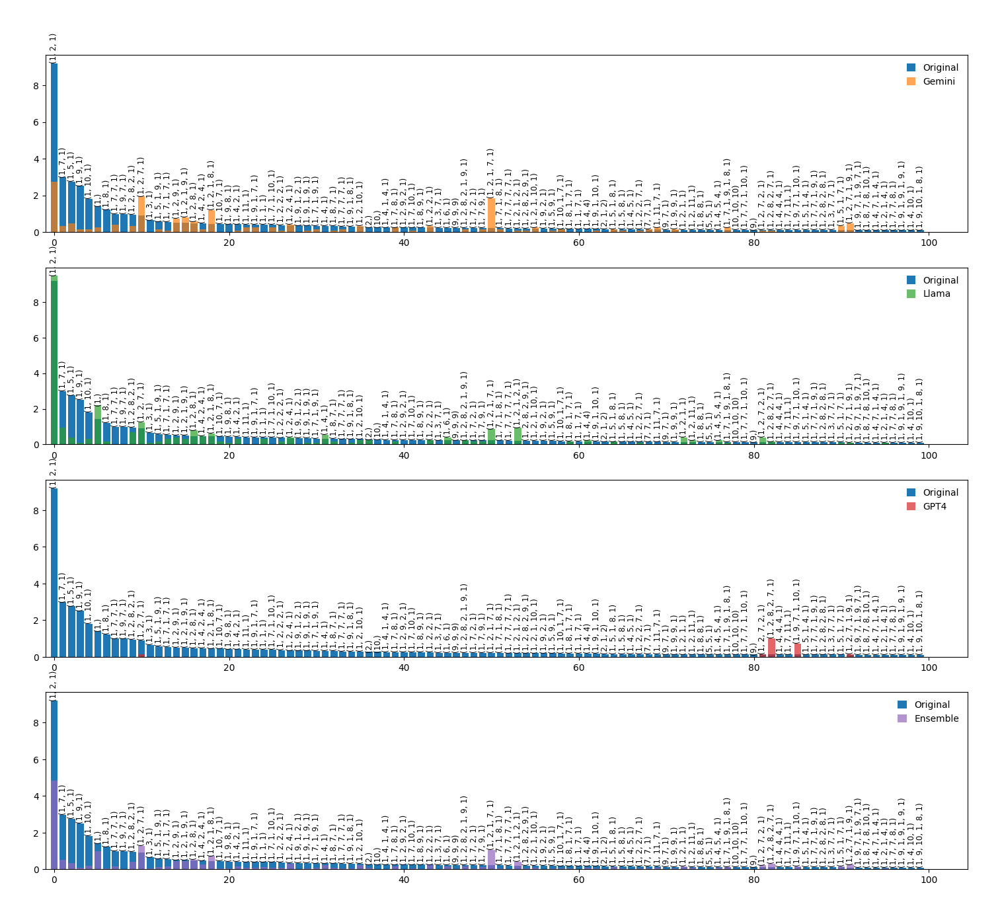

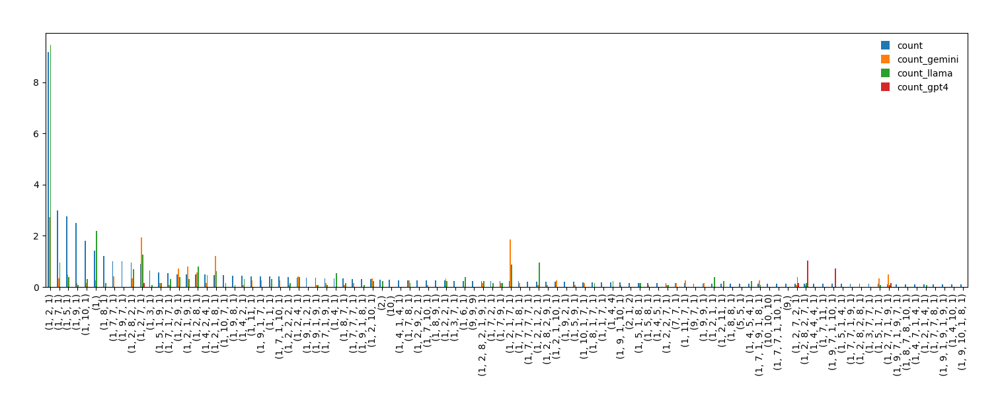

In [84]:
create_activity_chain_plots(chains_sf, city='SF')

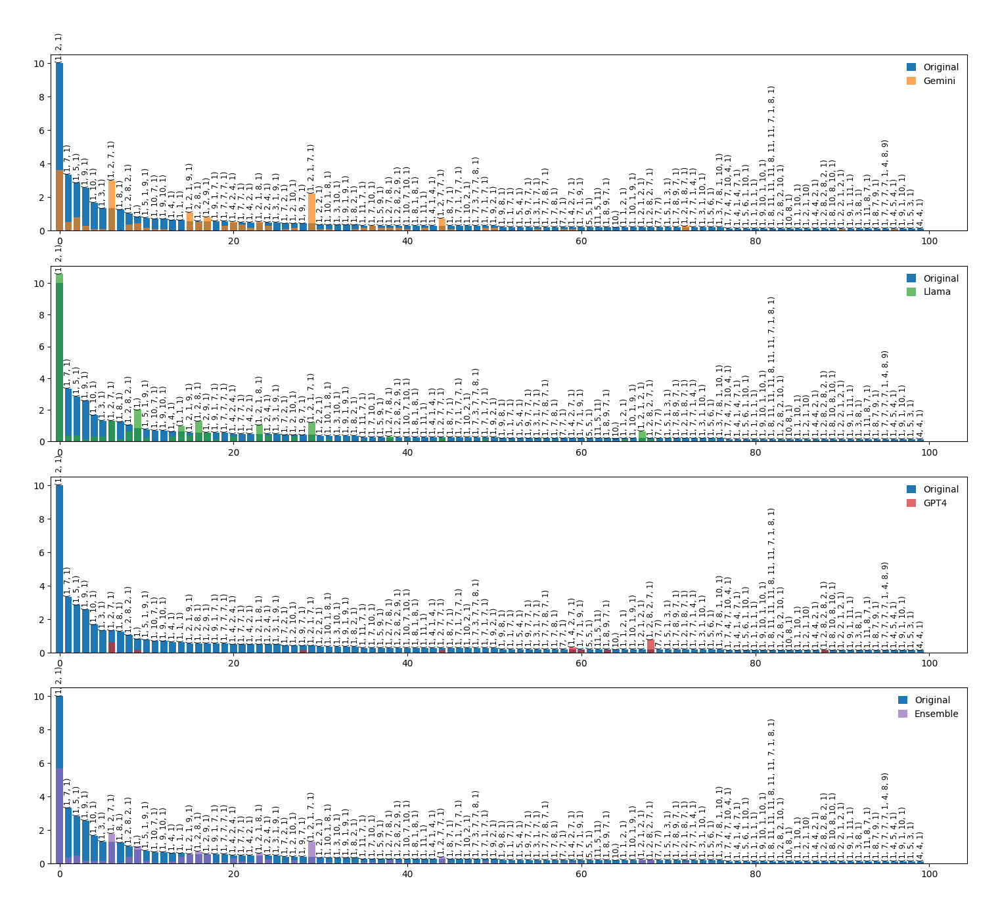

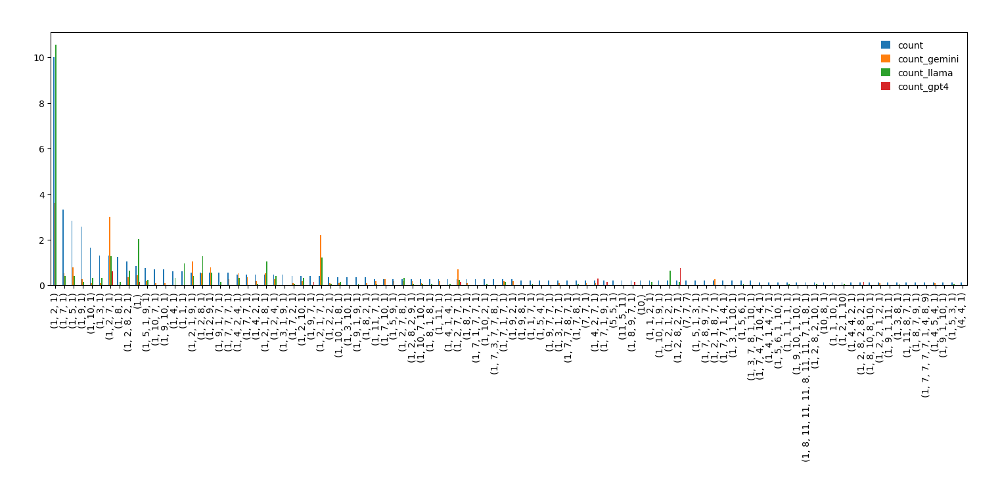

In [92]:
create_activity_chain_plots(chains_dc, city='DC')

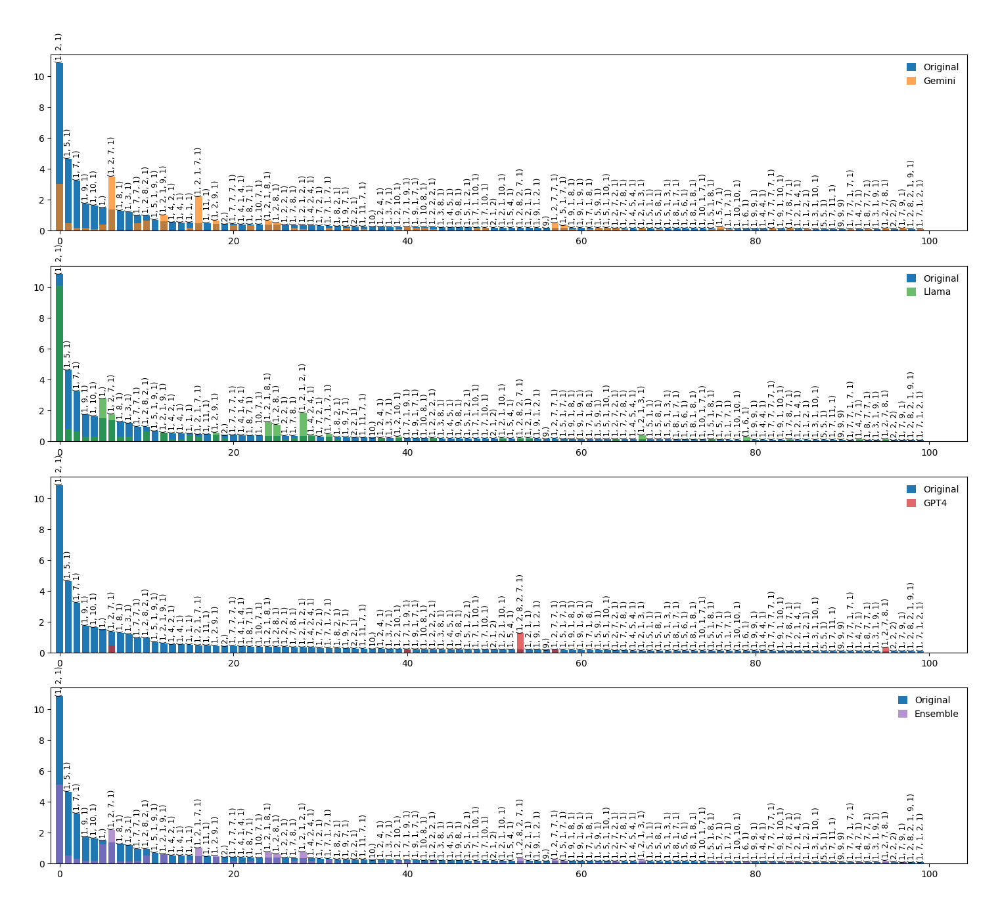

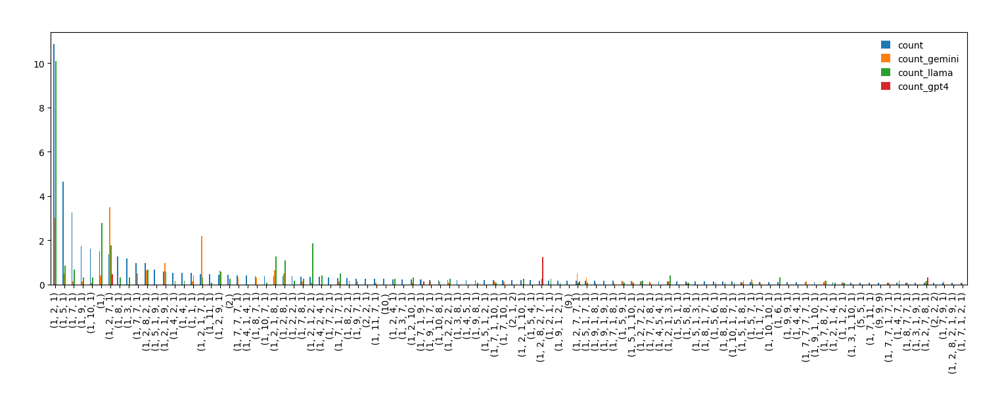

In [93]:

create_activity_chain_plots(chains_dfw, city='DFW')

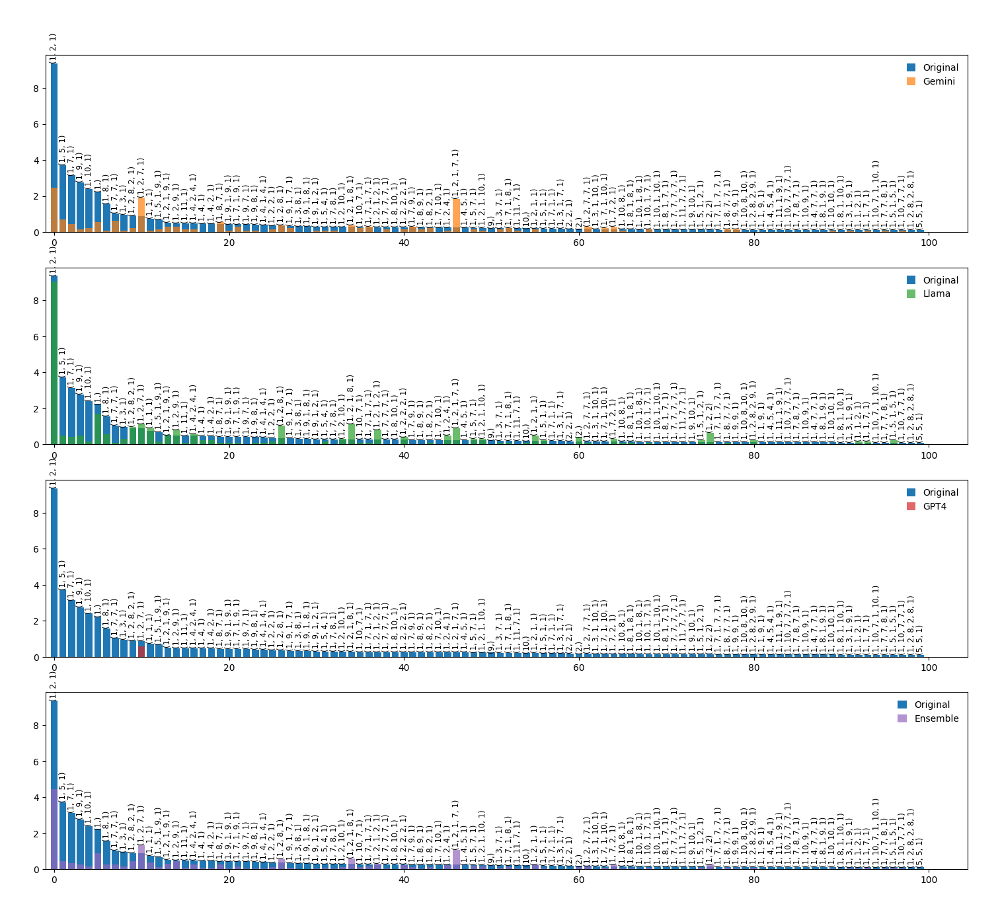

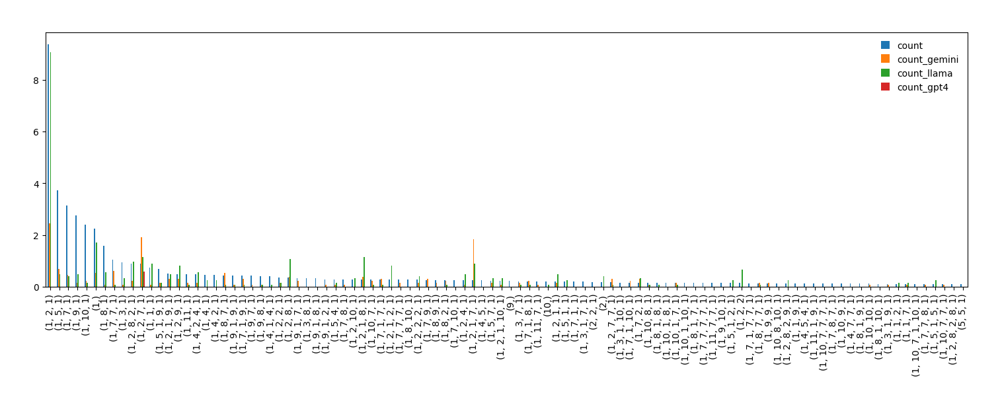

In [94]:

create_activity_chain_plots(chains_la, city='LA')

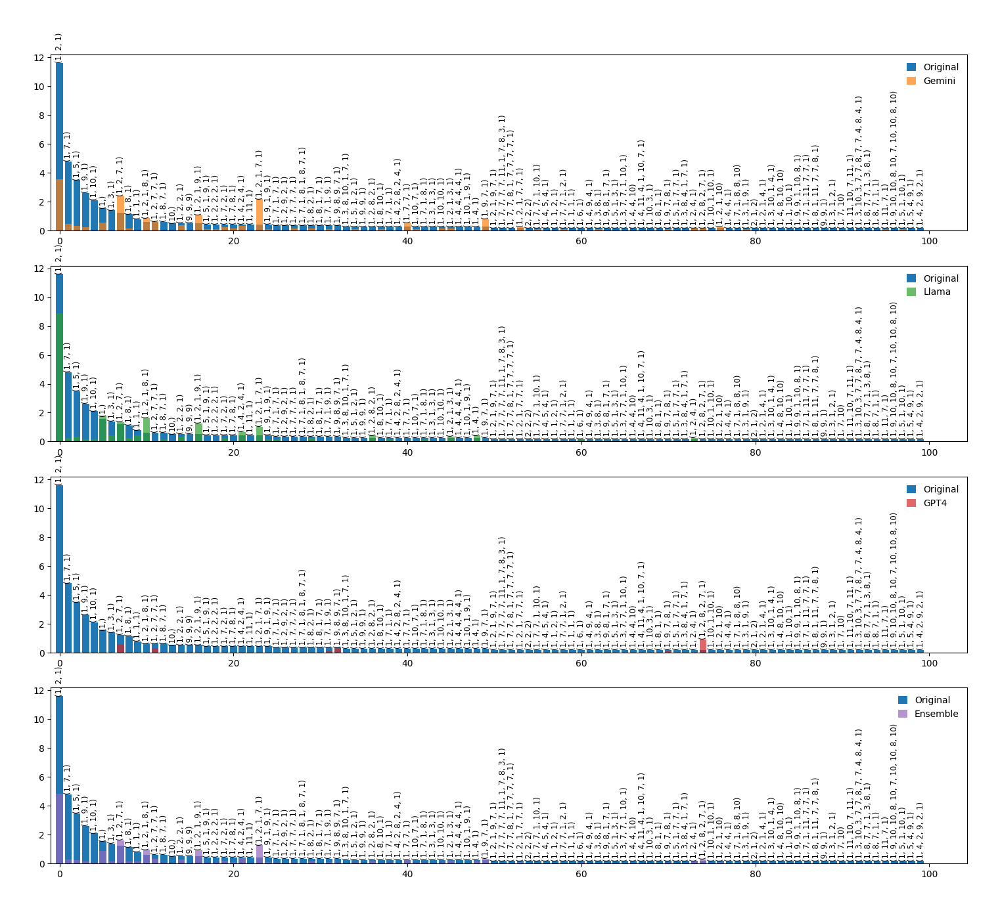

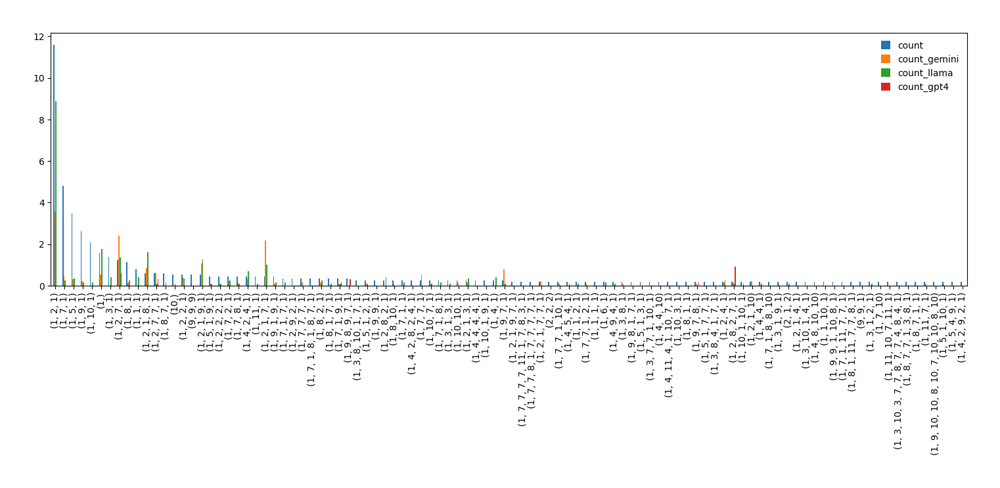

In [95]:

create_activity_chain_plots(chains_minneapolis, city='Minneapolis')